# EJERCICIO 1

Realizar todos los ejercicios con el conjunto de datos “FEV_data.csv”, información en fev.doc (live.com), que se encuentra en la carpeta de datos de la documentación, y sabiendo que la variable objetivo es ‘fev’

1. Reporte descriptivo de los datos. Dimensiones del dataset, número de variables continuas y categóricas. Distribuciones. Comentarios generales. 
2. Decide si se descarta de inicio alguna de las variables de cara al modelado.
3. Ajusta el mejor modelo de regresión lineal con variables originales y sin interacciones entre las variables. 
4. Ajusta el mejor modelo de regresión lineal con variables originales y con interacciones entre las variables que resulten relevantes. 
5. Comparación de ambos modelos por validación cruzada repetida. ¿Cuál de ellos tiene mejor comportamiento en generalización?

In [1]:
import pandas as pd
import numpy as np
pd.set_option("display.max_rows", None, "display.max_columns", None)

# Lectura de datos
fev_data = pd.read_csv('FEV_data.csv')
fev_data.head()    #mostramos solo el head para evitar que colapse a la hora de mostrar un conjunto de datos muy grande

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,2,2
1,2,451,8,1.724,67.5,2,2
2,3,501,7,1.720,54.5,2,2
3,4,642,9,1.558,53.0,1,2
4,5,901,9,1.895,57.0,1,2


###### Las fases de “Data understanding & preparation” de la metodología CRISP-DM comprenden lo que se conoce como Depuración de datos. 

En primer lugar, entendemos qué tipo de información contiene el dataset:

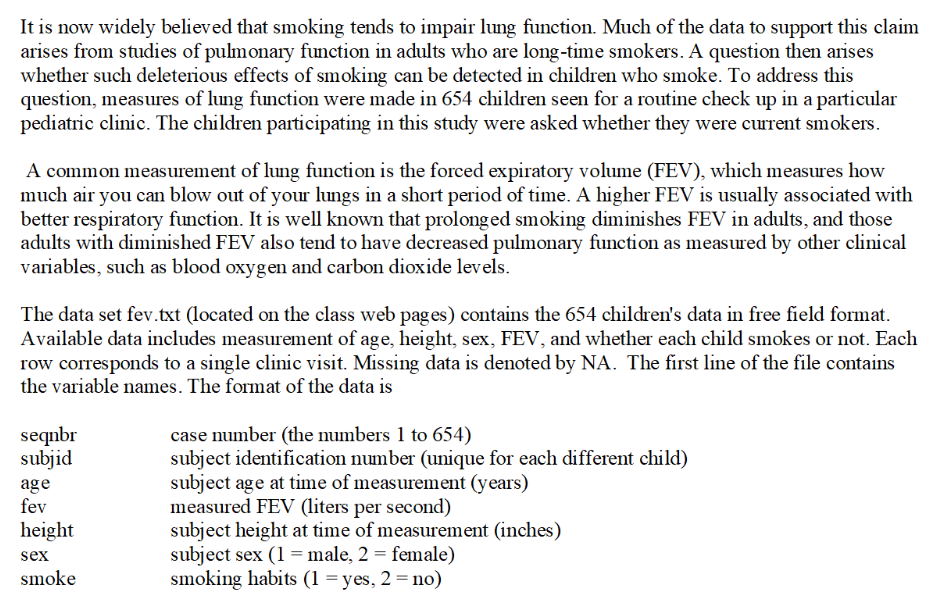


A continuación, en el archivo total comprobaremos lo siguiente:

1. Tipos de variables. Todos los factores, lo son realmente en python?

2. Valores mal codificados. Hay missings no declarados tipo -1, 99999? Las categorías de las nominales son las que deben?

3. Valores fuera de rango. Hay alguna limitación sobre el rango de alguna variable que no se cumpla?

4. Variables nominales o Factores con categorías minoritarias. Las categorías con baja representación puede causar muchos problemas en los modelos por falta de base muestral para la estimación de los parámetros correspondientes a la pertenencia a esa categoría. Por ello, es conveniente echar un vistazo y recodificar las vairables uniendo categorías muy poco representativas con otras cuya unión tenga algún sentido (tienen comportamiento similar frente a la objetivo, la variable tiene caracter ordinal por lo que la unión con mayor sentido sería hacia categorías adyacentes..).


Con estas cosas ya arregladas, nos vamos a los dos grandes “caballos de batalla” de la depuración. Este proceso para la gestión de outliers y missings lo vamos a llevar a cabo sobre el archivo que llamaremos input y que contendrá solamente a los predictores sin incluir las variables objetivo continua y binaria. No es buena idea gestionar estas cosas en las objetivo puesto que las tomamos como la verdad verdadera y si tocamos algo ya estamos sesgando de alguna manera la variable de supervisión del proceso de modelización. Más adelante discutimos con mayor profundidad este hecho.

5. Outliers. Incidencia y tratamiento (pasar a missing, eliminar, winsorizar)

6. Missings. Incidencia y tratamiento (Eliminar, imputación simple por media, mediana, aleatorio, imputación por modelos)


Vamos a comprobar que los tipos de las variables sean los correctos, para ello, revisamos las descripciones de cada una de las variables del dataset:

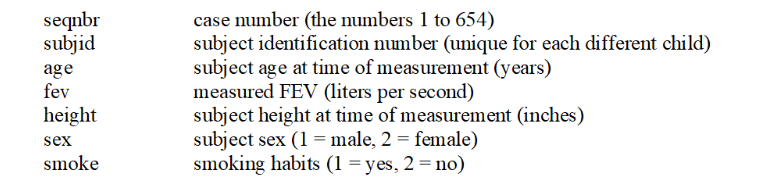

Vemos que tenemos 5 variables continuas y 2 categóricas en el dataset, comprobamos el tipo de dato que tienen en el archivo:

In [2]:
# Información del dataset
fev_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seqnbr  654 non-null    int64  
 1   subjid  654 non-null    int64  
 2   age     654 non-null    int64  
 3   fev     654 non-null    float64
 4   height  654 non-null    float64
 5   sex     654 non-null    int64  
 6   smoke   654 non-null    int64  
dtypes: float64(2), int64(5)
memory usage: 35.9 KB


La dimensión del dataset es de 654 filas/registros y 7 columnas (8 si incluimos la del index) y no hay ningún registro nulo en ninguna de las variables. 

Además, se observa que no todas las variables tienen asignado el tipo correcto de datos. Identificamos factores como Sex (columna 5) y Smoke (columna 6) que tienen asignados valores continuos a pesar de que son dicotómicas.

In [3]:
# Reemplazamos los valores dicotómicos de las variables sex y smoke por palabras para diferenciarlos mejor:
fev_data.sex = fev_data.sex.replace({1:"male", 2:"female"})
fev_data.smoke = fev_data.smoke.replace({1:"yes", 2:"no"})
fev_data.head()

,seqnbr,subjid,age,fev,height,sex,smoke
0,1,301,9,1.708,57.0,female,no
1,2,451,8,1.724,67.5,female,no
2,3,501,7,1.720,54.5,female,no
3,4,642,9,1.558,53.0,male,no
4,5,901,9,1.895,57.0,male,no


In [4]:
# Convertimos Sex y Smoke de numéricas a variables categóricas
fev_data['sex'] = fev_data['sex'].astype('category')
fev_data['smoke'] = fev_data['smoke'].astype('category')

# Comprobamos que se haya actualizado el tipo de dato en ambas categorías
fev_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   seqnbr  654 non-null    int64   
 1   subjid  654 non-null    int64   
 2   age     654 non-null    int64   
 3   fev     654 non-null    float64 
 4   height  654 non-null    float64 
 5   sex     654 non-null    category
 6   smoke   654 non-null    category
dtypes: category(2), float64(2), int64(3)
memory usage: 27.2 KB


In [5]:
# Descriptivos básicos para las variables numéricas: Número de valores distintos por variable
fev_data.describe()

,seqnbr,subjid,age,fev,height
count,654.00000,654.000000,654.000000,654.000000,654.000000
mean,327.50000,37169.571865,9.931193,2.636780,61.143578
std,188.93782,23690.860350,2.953935,0.867059,5.703513
min,1.00000,201.000000,3.000000,0.791000,46.000000
25%,164.25000,15811.000000,8.000000,1.981000,57.000000
50%,327.50000,36071.000000,10.000000,2.547500,61.500000
75%,490.75000,53638.500000,12.000000,3.118500,65.500000
max,654.00000,90001.000000,19.000000,5.793000,74.000000


Como ya habíamos visto anteriormente, no hay datos nulos para ninguna variable numérica, y no parece haber outliers.

In [6]:
# Descriptivos básicos para las variables categóricas
fev_data.describe(exclude=np.number)

,sex,smoke
count,654,654
unique,2,2
top,male,no
freq,336,589


Tampoco hay valores nulos para ninguna variable categórica, y ambas tienen únicamente dos valores posibles. Podemos ver que hay un 51,37% de hombres en el dataset y que un 90,06% de la población no fuma.

Cont


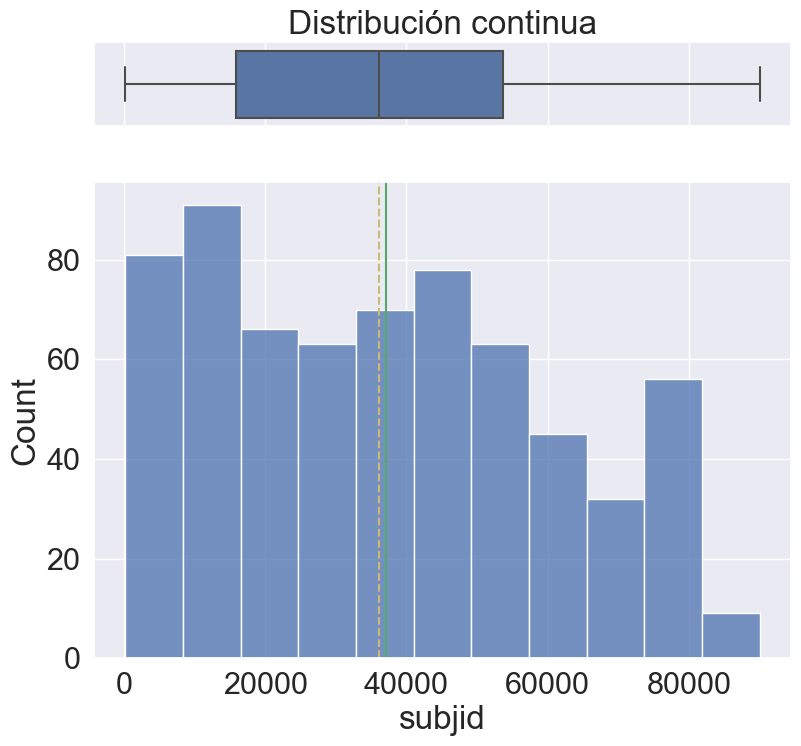

Cont


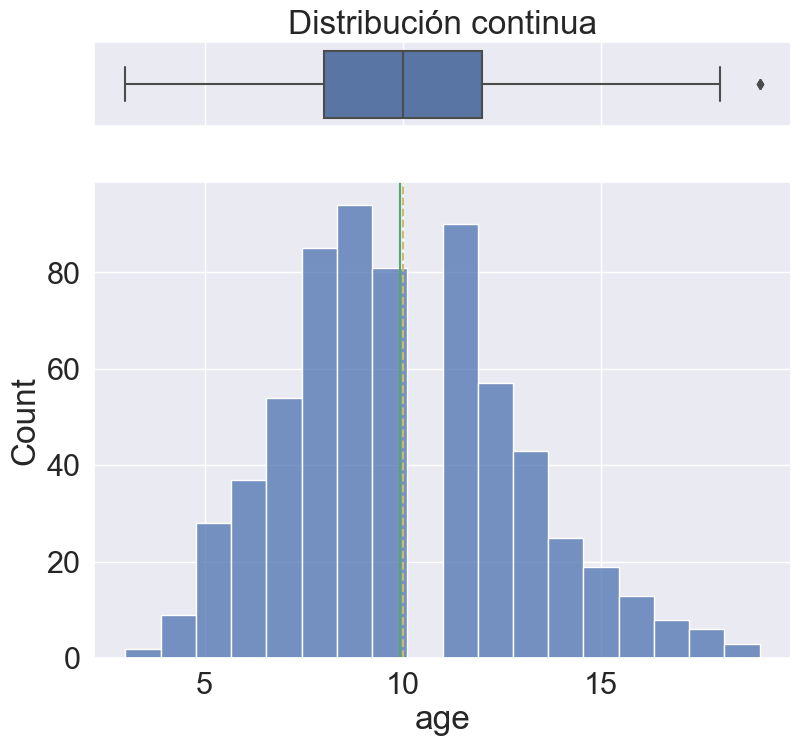

Cont


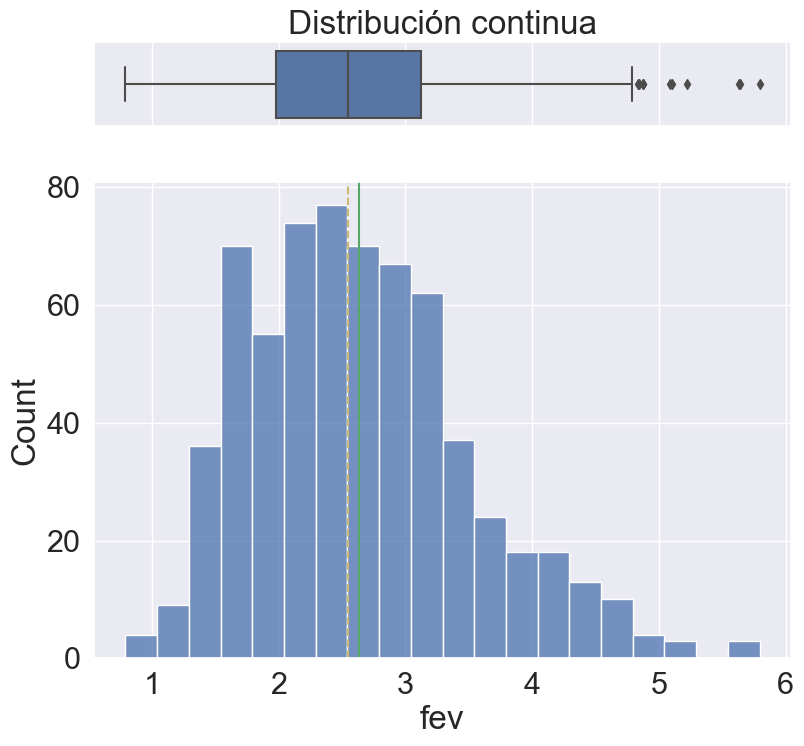

Cont


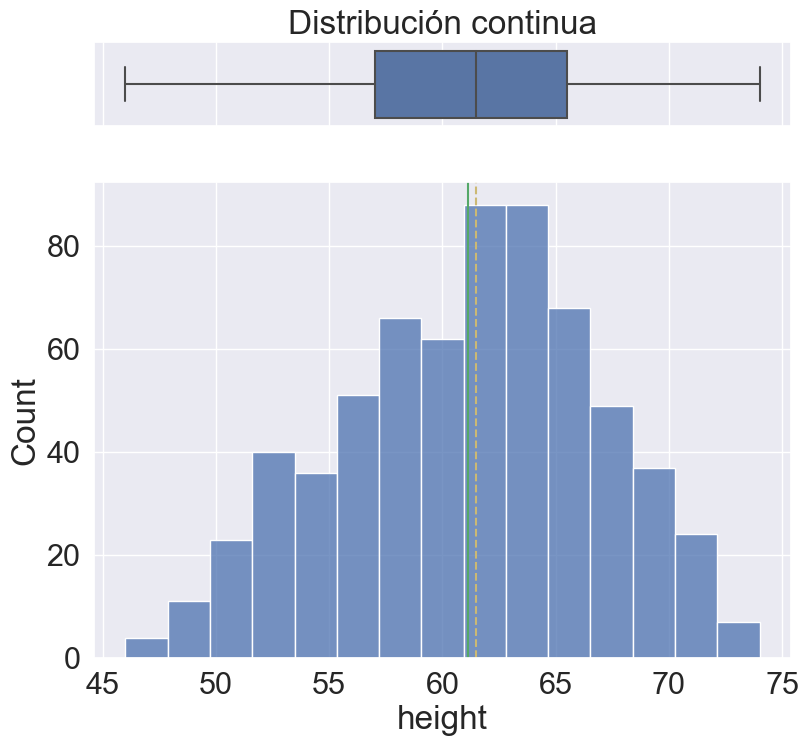

Cat


Cat


subjid    None
age       None
fev       None
height    None
sex       None
smoke     None
dtype: object

In [7]:
# Veamos las distribuciones de una forma más profunda:
exec(open('NuestrasFunciones.py').read())


def plot(fev_data):
     if fev_data.dtypes != 'category':
        print('Cont')
        histogram_boxplot(fev_data, xlabel = fev_data.name, title = 'Distribución continua')
     else:
        print('Cat')
        cat_plot(fev_data).show()
        
# Aplicar a una serie de columas 1:9 del data
fev_data.iloc[:,1:7].apply(plot)

Observaciones de los plots:

###### Variables numéricas:

- age: ligera asimetría hacia la derecha y con valores atípicos, pero muy pocos, aquellos con rango de edad de 19, y ninguno con 11 años.
- fev: asimetría hacia la derecha con valores atípicos
- height: asimetría hacia la izq. y no hallamos valores atípicos en él (ningún punto en el diagrama de bigotes)

###### Variables categóricas:

- sex: hay más o menos la misma distribucion entre hombres y mujeres (como comentamos anteriormente, un 51% de hombres y un 49% de mujeres)
- smoke: el gran porcentaje de la muestra nos dice que son no fumadores (como comentamos anteriormente, un 90% de no fumadores)

En la descripción inicial del dataset, apreciamos que las variables Seqnbr (columna 0) y Subjid (columna 1) contienen información redundante y que no aportarán nada al modelo ya que no están relacionadas con la variable objetivo, ambos son identificadores únicos de cada uno de los 654 experimentos con los 654 niños, por lo que procedemos a eliminarlas:

In [8]:
# Eliminamos las columnas seqnbr y subjid
fev_data = fev_data.drop(['seqnbr', 'subjid'], axis=1)
# Comprobamos que se han eliminado correctamente
fev_data.head()

,age,fev,height,sex,smoke
0,9,1.708,57.0,female,no
1,8,1.724,67.5,female,no
2,7,1.720,54.5,female,no
3,9,1.558,53.0,male,no
4,9,1.895,57.0,male,no


##### Ranking de efectos a priori de las variables del input frente a la variable objetivo con V de Cramer

Procedimiento para evaluar las relaciones de todas las variables del input frente a la variable objetivo (ya sea continua o binaria) y que de alguna forma ordene esos efectos por intensidad de asociación para generar un ranking tentativo a priori de las variables más interesantes a nivel individual (es importante destacar que estas relaciones solamente cuentan el efecto marginal de una variable con la objetivo sin considerar las posibles interacciones existentes entre variables que pueden modificar en modelo estas asociaciones).

In [11]:
# Eliminar variable objetivo continua 
varObjCont = fev_data.fev
imput = fev_data.drop(['fev'],axis=1)
varObjCont.info()


<class 'pandas.core.series.Series'>
RangeIndex: 654 entries, 0 to 653
Series name: fev
Non-Null Count  Dtype  
--------------  -----  
654 non-null    float64
dtypes: float64(1)
memory usage: 5.2 KB


In [12]:
# Librería estadística!
import scipy.stats as stats

# Función para calcular VCramer (dos nominales de entrada!)
def cramers_v(var1, varObj):
    
    if not var1.dtypes == 'category':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'category': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer


# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x,varObjCont)),columns=['VCramer'])

print(tablaCramer)

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a FEV').update_yaxes(categoryorder="total ascending")

         VCramer
age     0.437329
height  0.539096
sex     0.315734
smoke   0.257104


Ya tenemos nuestro ranking de variables según Cramer para todos los predictores en relación a la variable objetivo continua, FEV. Vemos que las variables continuas 'height' y 'age' son las que mayor relación presentan, es decir, las que mayor patrón de asociación pueden aportar para el futuro modelo. Aunque vemos que les siguen con muy poca desventaje 'sex' y 'smoke'. 

Veamos los efectos de estas variables sobre la objetivo con más detalle:

<AxesSubplot:xlabel='height', ylabel='fev'>

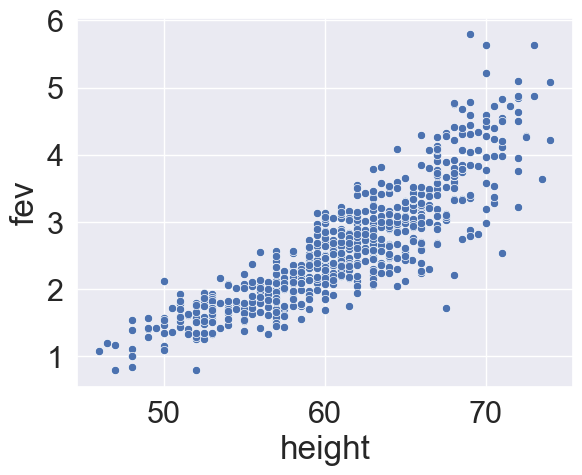

In [13]:
# Análisis bivariable: Height vs FEV:
sns.scatterplot(x='height',y='fev',data=fev_data)

<AxesSubplot:xlabel='age', ylabel='fev'>

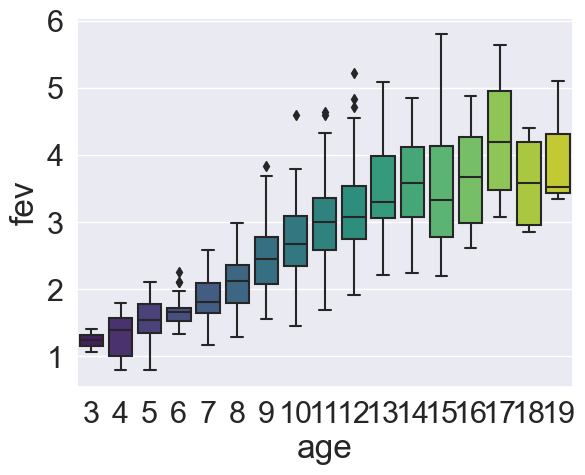

In [14]:
# Análisis bivariable: Age vs FEV:
sns.boxplot(x='age',y='fev',data=fev_data,palette='viridis')

Como ya veíamos en la V de Cramer, en los gráficos bivariables podemos ver una clara RELACIÓN DIRECTA entre la variable objetivo FEV y la variable continua height, y también entre FEV y age.

<AxesSubplot:xlabel='sex', ylabel='fev'>

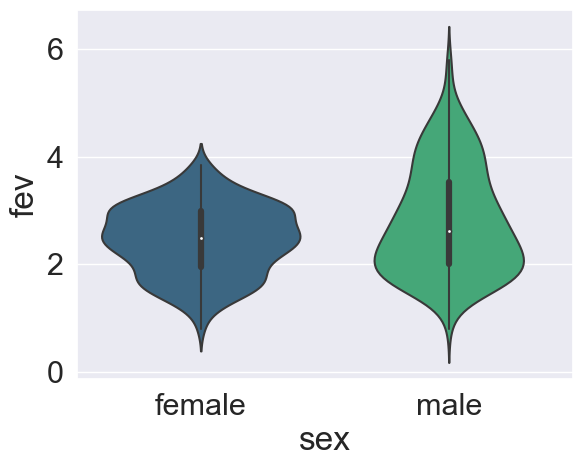

In [15]:
# Análisis bivariable: Sex vs FEV:
sns.violinplot(x='sex',y='fev',data=fev_data,palette='viridis')

En el gráfico de violín podemos ver que los datos de FEV para las mujeres están más concentrados en el rango 1-4 y para los hombre tienen mayor rango y van de 0-6. La mayor frecuencia de FEV en las mujeres está alrededor de 2 y en los hombres también (señalado por el punto blanco en el gráfico)

<AxesSubplot:xlabel='smoke', ylabel='fev'>

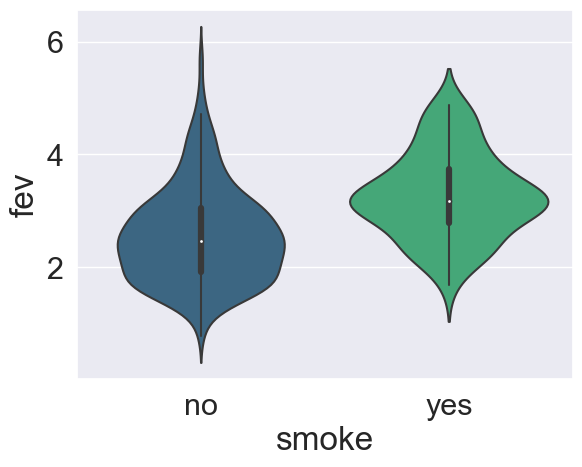

In [16]:
# Análisis bivariable: Smoke vs FEV:
sns.violinplot(x='smoke',y='fev',data=fev_data,palette='viridis')

Podemos ver que los datos de FEV para los no fumadores tienen un mayor rango y están concentrados de 1-4 y para los fumadores tienen un menor rango y están concentrados de 2-5   -> Se ve claramente que los fumadores obtienen mayor cantidad de FEV que los no fumadores en general, ya que la mayor frecuencia de FEV en los no fumadores está alrededor de 2 y la de los fumadores está en 3 (señalado por el punto blanco en el gráfico)

## Modelos de regresión lineal para la predicción del nivel de FEV

La filosofía de muchos de los modelos predictivos en python (muy enfocado a la automatización para la prediccion) es la de tener por separado la matriz de predictores y el vector de variable objetivo ya que bajo este esquema están programados los procedimientos. Sin embargo, esto no es algo directo cuando existen variables categóricas en el dataset. En general, estas variables no son aceptadas tal cual en los modelos y hay que realizar un paso previo de creación de variables dummy generando lo que se conoce como la matriz de diseño del modelo.

Matriz de diseño: Es el archivo de input de los predictores con las variables continuas tal cual y las categóricas extendidas en k-1 dummies. Además se añade una variable constante a dicha matriz. De esta forma, por columnas obtenemos los efectos explícitos de cada beta a estimar por el modelo. Bajo este paradigma se ajustan los modelos de la famosa librería sklearn de machine learning.

In [17]:
# Separamos la variable objetivo ('Fev') = (Y)
varObjCont = fev_data.fev
varObjCont.info()

<class 'pandas.core.series.Series'>
RangeIndex: 654 entries, 0 to 653
Series name: fev
Non-Null Count  Dtype  
--------------  -----  
654 non-null    float64
dtypes: float64(1)
memory usage: 5.2 KB


In [18]:
# Creamos un dataframe 'Input' donde no esté la varible objetivo ('Fev') 
input = fev_data.drop(['fev'],axis=1)

input.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 654 entries, 0 to 653
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   age     654 non-null    int64   
 1   height  654 non-null    float64 
 2   sex     654 non-null    category
 3   smoke   654 non-null    category
dtypes: category(2), float64(1), int64(1)
memory usage: 11.9 KB


##### 1. Partición training-test

Con la primera (training) ajustamos el modelo y con la segunda (test) obtenemos predicciones (obviando la variable objetivo de este conjunto) y evaluamos el error cometido y el posible sobreajuste.

In [19]:
# Función necesaria
from sklearn.model_selection import train_test_split

# Creamos 4 objetos: predictores para tr y tst y variable objetivo para tr y tst. 
X_train, X_test, y_train, y_test = train_test_split(input, varObjCont, test_size=0.2, random_state=42)

# Comprobamos dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (523, 4) (523,)
Testing dataset shape: (131, 4) (131,)


In [20]:
# Genero el training con la objetivo dentro 
data_train = X_train.join(y_train)
data_train.head()

,age,height,sex,smoke,fev
321,12,71.0,male,no,4.550
456,12,68.0,male,no,4.411
340,10,62.0,male,no,1.937
29,9,60.0,female,no,2.100
570,10,65.0,male,no,3.090


##### 2. Modelo completo de referencia

Generamos una función que concatene todos los efectos como string e incluso podamos eliminar algunos a placer, obteniendo la fórmula de manera automática.

In [21]:
# Función para generar la fórmula que concatene todos los efectos como string por larga que sea e includo podamos eliminar algunos a placer:
def ols_formula(df, dependent_var, *excluded_cols):
    df_columns = list(df.columns.values)
    df_columns.remove(dependent_var)
    for col in excluded_cols:
        df_columns.remove(col)
    return dependent_var + ' ~ ' + ' + '.join(df_columns)

# Aplicamos a fórmula de modelo completo
form=ols_formula(data_train,'fev')
form

'fev ~ age + height + sex + smoke'

In [22]:
# Ajusto regresión según fórmula completa
from statsmodels.formula.api import ols 

modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     423.4
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          1.09e-161
Time:                        15:19:43   Log-Likelihood:                -281.13
No. Observations:                 523   AIC:                             572.3
Df Residuals:                     518   BIC:                             593.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -4.4435      0.252    -17.627      0.000      -4.939      -3.948
sex[T.male]      0.1511      0.038      4.028      0.000       0.077       0.225
smoke[T.yes]    -0.0652      0.066     -0.983      0.326      -0.196       0.065
age              0.0632      0.011      5.678      0.000       0.041       0.085
height           0.1041      0.005     19.150      0.000       0.093       0.115
==============================================================================
Omnibus:                       11.617   Durbin-Watson:                   2.092
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.038
Skew:                           0.178   Prob(JB):                     0.000200
Kurtosis:                       3.810   Cond. No.                         863.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Nos fijamos en las siguientes medidas:

R-squared:	0.766

Adj. R-squared:	0.764

P>|t| vs smoke[T.yes] = 0.326,  tiene que ser menos a 0.05 para tener un efecto significativo en  el modelo (es la última variable que aparecía en la V de Cramer, tiene sentido)

##### 2.1. Filosofía matriz de diseño explícita

Procedemos a generar las matrices de diseño de un modelo basadas en una fórmula concreta. Esto nos permitirá utilizar cualquier modelo de predicción de python que no acepte directamente la interfaz fórmula. Es evidente que podríamos hacer esta operación “a mano”, generando la extensión en dummies de los factores y la posterior adición de una constante β0 para que se refleje en el modelo, pero pienso que es más intuitivo utilizar la fórmula y así evitar errores.

Aquí podemos utilizar el modelo de statmodels OLS pensado para filosofía matriz explícita o cualquier modelo sklearn.

In [23]:
import statsmodels.api as sm
import patsy

# Generamos las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

# Ahora podemos aplicar la función "oficial" de statmodels OLS (con formato y,X)
modeloC=sm.OLS(y,X).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     423.4
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          1.09e-161
Time:                        15:19:44   Log-Likelihood:                -281.13
No. Observations:                 523   AIC:                             572.3
Df Residuals:                     518   BIC:                             593.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -4.4435      0.252    -17.627      0.000      -4.939      -3.948
sex[T.male]      0.1511      0.038      4.028      0.000       0.077       0.225
smoke[T.yes]    -0.0652      0.066     -0.983      0.326      -0.196       0.065
age              0.0632      0.011      5.678      0.000       0.041       0.085
height           0.1041      0.005     19.150      0.000       0.093       0.115
==============================================================================
Omnibus:                       11.617   Durbin-Watson:                   2.092
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.038
Skew:                           0.178   Prob(JB):                     0.000200
Kurtosis:                       3.810   Cond. No.                         863.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Podemos comprobar que el modelo es exactamente el mismo que el ajustado mediante la fórmula y la función ols, pero ahora resulta que las matrices de diseño se especifican explicitamente con lo que podemos utilizar la importancia relativa de variables (que solo trabaja con variables de tipo numérico) ya que no existen factores.

##### 2.2. Importancia de las variables en el modelo completo

In [24]:
# pip install relativeimp
from relativeImp import relativeImp

y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calculamos importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'fev', driverNames = names)

# Ordenamos valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

print(df_results)

# Importancia de nuestras variables frente a nuestra variable objetivo. Gráfico de importancia relativa en base al fev

px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por fev').update_yaxes(categoryorder="total ascending").show()


         driver  rawRelaImpt  normRelaImpt
0   sex[T.male]     0.024235      3.164859
1  smoke[T.yes]     0.020075      2.621533
2           age     0.277787     36.275651
3        height     0.443669     57.937958


Obtenemos un gráfico de importancia de las variables del modelo completo con el efecto de las categorías de las nominales por separado. Vemos lo que se podía esperar, las variables "height" y "age" son las que tienen mayor importancia en el modelo.

A partir del modelo completo de referencia (en cualquier variante ya sea OLS o bien ols) la idea es tratar de obtener un modelo más simple con capacidad de predicción parecida y buen aspecto del summary a nivel estadístico. De esta forma podemos trabajar hacia delante/atrás siguiendo el ranking de importancia de Crmer o este último dentro de modelo.

##### 3. Proceso backward para pruebas de modelos manuales

Vamos a generar un proceso backward eliminando variables secuencialmente según el p-valor. Presento solamente el final de mi periplo por la eliminación de variables + evaluación del summary.

In [25]:
# Recordamos primer modelo (modelo completo de referencia) -> form

print(form)

modeloC = ols(form,data=data_train).fit()
modeloC.summary()

fev ~ age + height + sex + smoke


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     423.4
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          1.09e-161
Time:                        15:19:49   Log-Likelihood:                -281.13
No. Observations:                 523   AIC:                             572.3
Df Residuals:                     518   BIC:                             593.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -4.4435      0.252    -17.627      0.000      -4.939      -3.948
sex[T.male]      0.1511      0.038      4.028      0.000       0.077       0.225
smoke[T.yes]    -0.0652      0.066     -0.983      0.326      -0.196       0.065
age              0.0632      0.011      5.678      0.000       0.041       0.085
height           0.1041      0.005     19.150      0.000       0.093       0.115
==============================================================================
Omnibus:                       11.617   Durbin-Watson:                   2.092
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.038
Skew:                           0.178   Prob(JB):                     0.000200
Kurtosis:                       3.810   Cond. No.                         863.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [26]:
# Probamos con un nuevo modelo (form1) sin la variable smoke, que habíamos visto que era la que menos aportaba al modelo:

form1 = 'fev ~ age + height + sex'
modeloC1 = ols(form1,data=data_train).fit()
modeloC1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.765
Model:                            OLS   Adj. R-squared:                  0.764
Method:                 Least Squares   F-statistic:                     564.2
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          6.86e-163
Time:                        15:19:49   Log-Likelihood:                -281.61
No. Observations:                 523   AIC:                             571.2
Df Residuals:                     519   BIC:                             588.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -4.4369      0.252    -17.608      0.000      -4.932      -3.942
sex[T.male]     0.1540      0.037      4.117      0.000       0.081       0.227
age             0.0601      0.011      5.629      0.000       0.039       0.081
height          0.1043      0.005     19.223      0.000       0.094       0.115
==============================================================================
Omnibus:                       11.573   Durbin-Watson:                   2.100
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               17.840
Skew:                           0.155   Prob(JB):                     0.000134
Kurtosis:                       3.850   Cond. No.                         863.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-squared:	0.765 -> un poco peor que el modelo anterior

Adj. R-squared:	0.764 no nos penaliza mucho que hayamos quitado la variable

P>|t| : ya estamos por debajo de lo que queremos, ninguna variable tiene más de 0,05

In [27]:
# Probamos con un nuevo modelo (form2) sin la variable sex

form2 = 'fev ~ age + height + smoke'
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     543.1
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          1.26e-159
Time:                        15:19:51   Log-Likelihood:                -289.19
No. Observations:                 523   AIC:                             586.4
Df Residuals:                     519   BIC:                             603.4
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       -4.6008      0.253    -18.209      0.000      -5.097      -4.104
smoke[T.yes]    -0.0860      0.067     -1.281      0.201      -0.218       0.046
age              0.0565      0.011      5.062      0.000       0.035       0.078
height           0.1090      0.005     20.293      0.000       0.098       0.120
==============================================================================
Omnibus:                       18.413   Durbin-Watson:                   2.101
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               29.790
Skew:                           0.259   Prob(JB):                     3.40e-07
Kurtosis:                       4.048   Cond. No.                         853.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-squared:	0.758 -> bastante peor que los dos modelos anteriores

Adj. R-squared:	0.757 penaliza el haber quitado la variable "sex"

P>|t| : tenemos la variable "smoke" por encima de 0.05 -> NO NOS SIRVE

In [28]:
# Probamos con un nuevo modelo (form3) realizando interacciones entre las variables que resulten relevantes:

form3 = 'fev ~ age + height*sex'
modeloC3 = ols(form3,data=data_train).fit()
modeloC3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.775
Model:                            OLS   Adj. R-squared:                  0.773
Method:                 Least Squares   F-statistic:                     446.5
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          2.74e-166
Time:                        15:19:52   Log-Likelihood:                -270.42
No. Observations:                 523   AIC:                             550.8
Df Residuals:                     518   BIC:                             572.1
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -3.0651      0.379     -8.078      0.000      -3.811      -2.320
sex[T.male]           -1.8025      0.413     -4.368      0.000      -2.613      -0.992
age                    0.0662      0.011      6.276      0.000       0.045       0.087
height                 0.0806      0.007     11.057      0.000       0.066       0.095
height:sex[T.male]     0.0322      0.007      4.760      0.000       0.019       0.045
==============================================================================
Omnibus:                        6.036   Durbin-Watson:                   2.109
Prob(Omnibus):                  0.049   Jarque-Bera (JB):                7.799
Skew:                           0.090   Prob(JB):                       0.0203
Kurtosis:                       3.570   Cond. No.                     2.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-squared:	0.775 -> Mejoramos nuestro modelo inicial completo (form)

Adj. R-squared:	0.773 no penaliza mucho

P>|t| : todo correcto, por debajo de 0.05

In [29]:

form4 = 'fev ~ height + age*sex'
modeloC4 = ols(form4,data=data_train).fit()
modeloC4.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     440.1
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          4.80e-165
Time:                        15:19:53   Log-Likelihood:                -273.31
No. Observations:                 523   AIC:                             556.6
Df Residuals:                     518   BIC:                             577.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept          -3.8968      0.281    -13.856      0.000      -4.449      -3.344
sex[T.male]        -0.3665      0.133     -2.765      0.006      -0.627      -0.106
height              0.0984      0.006     17.761      0.000       0.088       0.109
age                 0.0417      0.011      3.642      0.000       0.019       0.064
age:sex[T.male]     0.0533      0.013      4.088      0.000       0.028       0.079
==============================================================================
Omnibus:                        7.388   Durbin-Watson:                   2.085
Prob(Omnibus):                  0.025   Jarque-Bera (JB):               10.696
Skew:                           0.066   Prob(JB):                      0.00476
Kurtosis:                       3.688   Cond. No.                     1.00e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  1e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-squared:	0.773 -> El anterior es un poco mejor que este

Adj. R-squared:	0.771 no penaliza mucho

P>|t| : todo correcto, por debajo de 0.05

In [30]:
form5 = 'fev ~ height*age + sex'
modeloC5 = ols(form5,data=data_train).fit()
modeloC5.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.784
Method:                 Least Squares   F-statistic:                     474.1
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          1.49e-171
Time:                        15:19:54   Log-Likelihood:                -258.17
No. Observations:                 523   AIC:                             526.3
Df Residuals:                     518   BIC:                             547.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      -0.6396      0.596     -1.074      0.283      -1.810       0.531
sex[T.male]     0.0968      0.037      2.635      0.009       0.025       0.169
height          0.0431      0.010      4.229      0.000       0.023       0.063
age            -0.3881      0.065     -5.961      0.000      -0.516      -0.260
height:age      0.0071      0.001      6.971      0.000       0.005       0.009
==============================================================================
Omnibus:                       14.277   Durbin-Watson:                   2.066
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               28.474
Skew:                          -0.054   Prob(JB):                     6.56e-07
Kurtosis:                       4.138   Cond. No.                     2.27e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.27e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

R-squared:	0.785 -> Parece que es mejor que los anteriores

Adj. R-squared:	0.784 no penaliza mucho

P>|t| : NO NOS SIRVE el modelo porque Intercept nos sale mayor a 0.05

###### Tras todas estas pruebas de combinaciones de modelos, NOS QUEDARÍAMOS CON EL MODELO FORM3 debido a su resumen estadístico en training

##### 4. Evaluación en el conjunto de test

Obtención de las predicciones del modelo para test y comparando estas con los valores reales recogidos en y_test. Nos apoyamos en algunas funcionalidades de metric de sklearn (cientos de métricas disponibles!). En este caso, error cuadrático medio y coeficiente de determinación R2.

In [31]:
from sklearn.metrics import mean_squared_error, r2_score

# Predicciones para test modelo completo
print(form)
tr_tst_eval_lin(form,fev_data)

fev ~ age + height + sex + smoke
Coeficiente de determinaciÃ³n TRAINING:  0.7722206511471126 

Mean squared error TEST: 0.38
Coeficiente de determinaciÃ³n TEST: 0.79


In [32]:
# Predicciones para modelos válidos por resumen estadísticas anterior en training:

print(form1)
tr_tst_eval_lin(form1,fev_data)

fev ~ age + height + sex
Coeficiente de determinaciÃ³n TRAINING:  0.7703341071043787 

Mean squared error TEST: 0.38
Coeficiente de determinaciÃ³n TEST: 0.79


In [33]:
print(form3)
tr_tst_eval_lin(form3,fev_data)

fev ~ age + height*sex
Coeficiente de determinaciÃ³n TRAINING:  0.7817483408984349 

Mean squared error TEST: 0.37
Coeficiente de determinaciÃ³n TEST: 0.80


In [34]:
print(form4)
tr_tst_eval_lin(form4,fev_data)

fev ~ height + age*sex
Coeficiente de determinaciÃ³n TRAINING:  0.7798593427598546 

Mean squared error TEST: 0.37
Coeficiente de determinaciÃ³n TEST: 0.80


Los modelos 3 y 4 en el test nos dan los mismo números, podemos ver que son los que mejor nos salen y podríamos coger cualquiera de ellos.

##### 5. Comparación de ambos modelos por validación cruzada repetida. ¿Cuál de ellos tiene mejor comportamiento en generalización?

Se generarán n_splits particiones del archivo, repitiendo el proceso con distintas semillas n_repeats veces. De esta forma, obtenemos n_splits x n_repeats modelos por fórmula especificada, pudiendo así promediar los resultados obtenidos bajo muchas muestras de training-test.

En este esquema, todas las observaciones del archivo son utilizadas en algún training para el ajuste del modelo y en algún test para su evaluación pero nunca simultáneamente. Así el modelo tiene instancias cambiantes para el ajuste de parámetros y para la predicción.

In [35]:
#creamos la lista de formulas

list_form = [form,form1,form3,form4]
list_form

# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)

list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,fev_data, seed=42),list_form))


Modelo: fev ~ age + height + sex + smoke
Coeficiente de determinaciÃ³n R2: 0.769 (0.030)
Modelo: fev ~ age + height + sex
Coeficiente de determinaciÃ³n R2: 0.770 (0.030)
Modelo: fev ~ age + height*sex
Coeficiente de determinaciÃ³n R2: 0.779 (0.029)
Modelo: fev ~ height + age*sex
Coeficiente de determinaciÃ³n R2: 0.778 (0.030)


In [36]:
# Trasponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])

results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()

,Modelo,R2
0,0,0.805612
1,0,0.810751
2,0,0.766404
3,0,0.746866
4,0,0.714957


<AxesSubplot:xlabel='Modelo', ylabel='R2'>

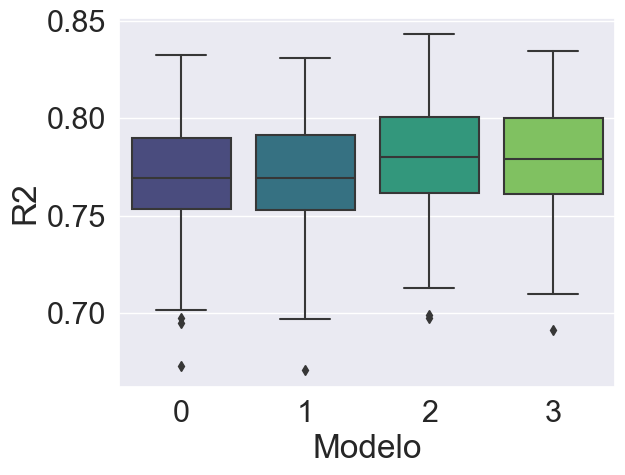

In [37]:
# Boxplot paralelo para comparar: juntamos los resultados de los “resamples” en un dataset para generar el gráfico de boxplots 
# de las distribuciones de R2 a través de los modelos y valorar la relación sesgo-varianza.

sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')

##### Nos quedamos con el modelo número 2, que en este caso se corresponde con el form 3 : fev ~ age + height*sex, ya que es el que mayor R2 tiene de los 4 modelos comparados (0,80 aprox)

In [38]:
# Ajusto regresión sin prop_missings con el modelo final(form3)
modelo_final = ols(form3,data=fev_data).fit()
modelo_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    fev   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     591.0
Date:                Thu, 29 Jun 2023   Prob (F-statistic):          1.13e-214
Time:                        15:20:07   Log-Likelihood:                -332.18
No. Observations:                 654   AIC:                             674.4
Df Residuals:                     649   BIC:                             696.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             -3.0986      0.329     -9.420      0.000      -3.745      -2.453
sex[T.male]           -1.8083      0.361     -5.014      0.000      -2.516      -1.100
age                    0.0669      0.009      7.487      0.000       0.049       0.084
height                 0.0812      0.006     12.888      0.000       0.069       0.094
height:sex[T.male]     0.0324      0.006      5.483      0.000       0.021       0.044
==============================================================================
Omnibus:                       15.370   Durbin-Watson:                   1.603
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               27.626
Skew:                           0.112   Prob(JB):                     1.00e-06
Kurtosis:                       3.982   Cond. No.                     2.07e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.07e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

##### 6. Conclusiones:

- De media el FEV disminuye 1.8 unidades por ser hombre con respecto a la mujer. En un intervalo de confianza al 95% esta disminución se encuentra entre 2.5 y 1.1 unidades de FEV.
- Un aumento unitario en la edad provoca un aumento de 0.0669 unidades de FEV.
- Un aumento unitario en la altura provoca un aumento de 0.0812 unidades de FEV.
- El efecto conjunto del aumento de una unidad en altura siendo hombre, aumentaría 0.0324 unidades de FEV.


# EJERCICIO 2

Con los datos de la serie de “defunciones.xlsx” se pretende ajustar el mejor modelo de series temporales a cualquiera de las series allí contenidas (elegir 1).

1. Lectura y representación de la serie. Descomposición. Conclusiones.

2. Partición training y test (los últimos 2 años de datos).

3. Mejor modelo de suavizado exponencial. ¿Pasa el test residual de Ljung.Box? 

4. Mejor modelo ARIMA. ¿Pasa el test residual de Ljung.Box?

5. Comparación. En relación al MAPE en el conjunto de test, ¿Qué modelo resulta más preciso en sus predicciones

In [39]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

In [40]:
# Lectura de datos
defunciones = pd.read_excel('defunciones.xlsx')
defunciones.head()

,,Todas las causas,Tumores,Causas externas
0,1980M01,28681,4883,1277
1,1980M02,23906,4493,1122
2,1980M03,25275,4957,1244
3,1980M04,22500,4523,1214
4,1980M05,22781,4893,1228


In [41]:
# Información del dataset
defunciones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 468 entries, 0 to 467
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0                     468 non-null    object
 1   Todas las causas  468 non-null    int64 
 2   Tumores           468 non-null    int64 
 3   Causas externas   468 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 14.8+ KB


Podemos ver que la columna 0 es la que contiene las fechas y que está con un dtype de object, por lo que procedemos a cambiarlo a fecha para poder analizarlo correctamente.

In [42]:
defunciones['month'] = defunciones[' '].str.replace('M', '-')
defunciones['month'] = pd.to_datetime(defunciones['month'], format='%Y-%m')
defunciones.drop(defunciones.columns[0], axis=1, inplace=True)
defunciones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 468 entries, 0 to 467
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Todas las causas  468 non-null    int64         
 1   Tumores           468 non-null    int64         
 2   Causas externas   468 non-null    int64         
 3   month             468 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(3)
memory usage: 14.8 KB


In [43]:
# Convertir en serie temporal: establecemos fecha como index
defunciones.set_index(['month'],inplace=True)
defunciones.head()

,Todas las causas,Tumores,Causas externas
month,,,
1980-01-01,28681,4883,1277
1980-02-01,23906,4493,1122
1980-03-01,25275,4957,1244
1980-04-01,22500,4523,1214
1980-05-01,22781,4893,1228


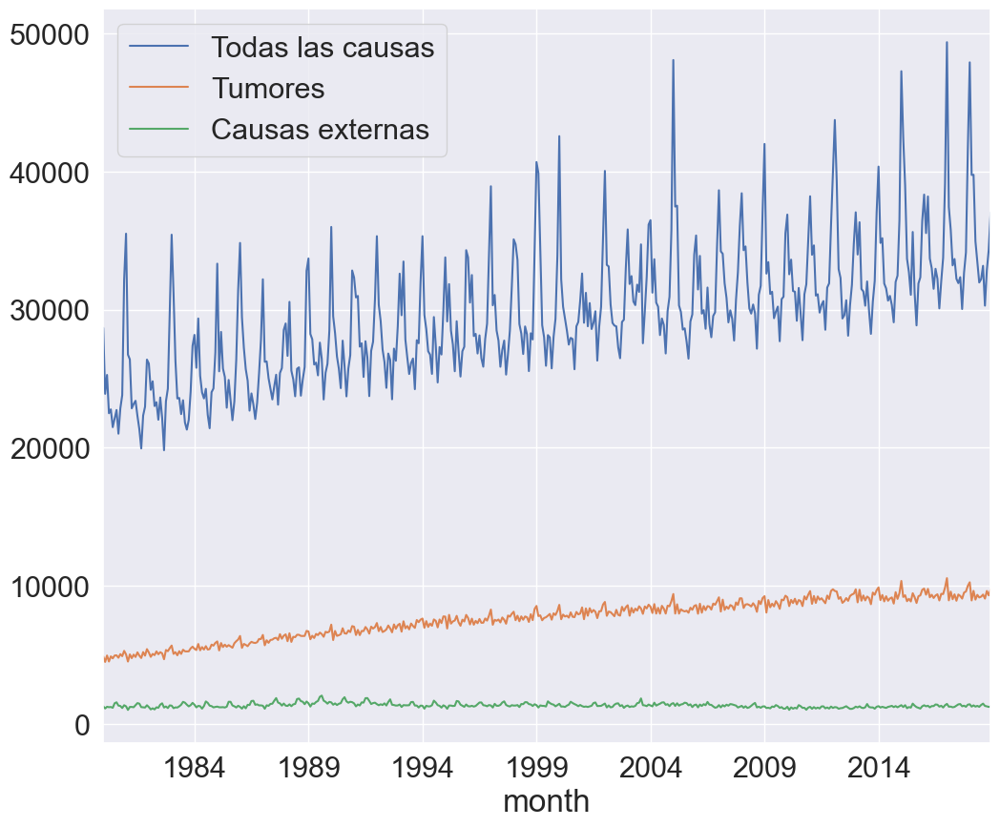

In [44]:
# Estudio descriptivo: graficamos todas las variables del dataset
plt.rcParams["figure.figsize"] = (12,10)
defunciones.plot()
plt.show()

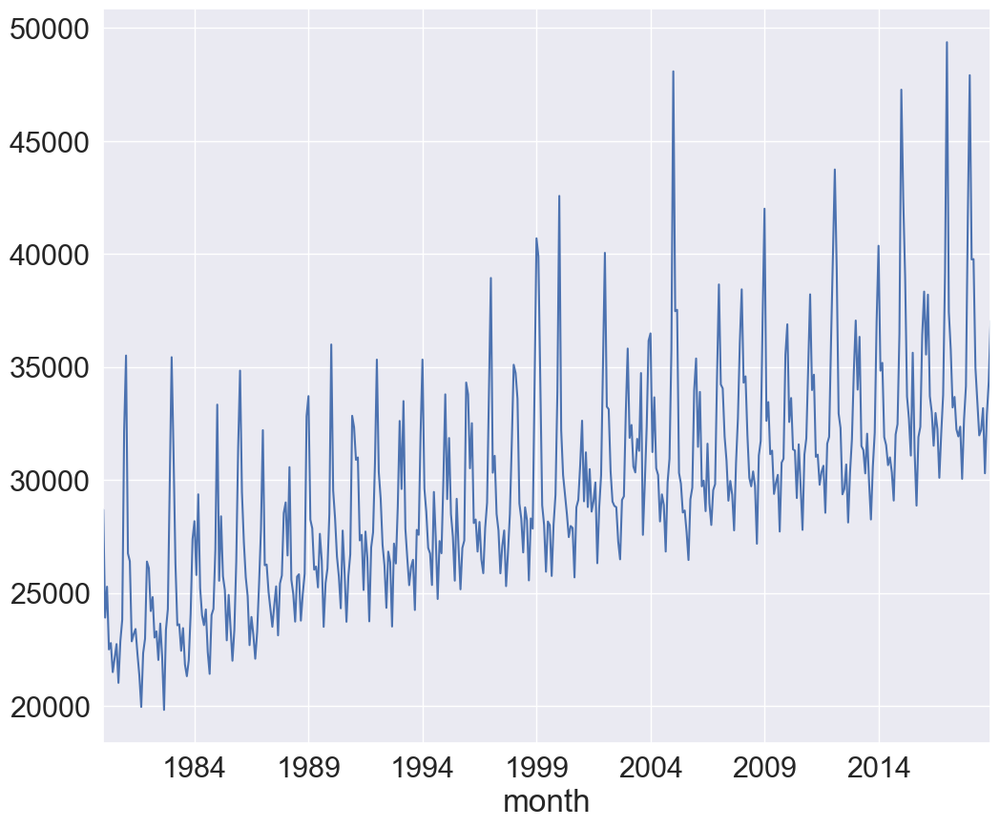

In [45]:
# Graficamos solo la variable que nos interesa
plt.rcParams["figure.figsize"] = (12,10)
defunciones['Todas las causas'].plot()
plt.show()

De primeras ya podemos ver que esta serie NO es estacionaria, porque tiene tendencia(creciente), es estacional(hay un patrón anual) y tiene heterocedasticidad(la magnitud de las fluctuaciones/diferencia entre máximo y mínimo, va cambiando hacia algo más o menos creciente)


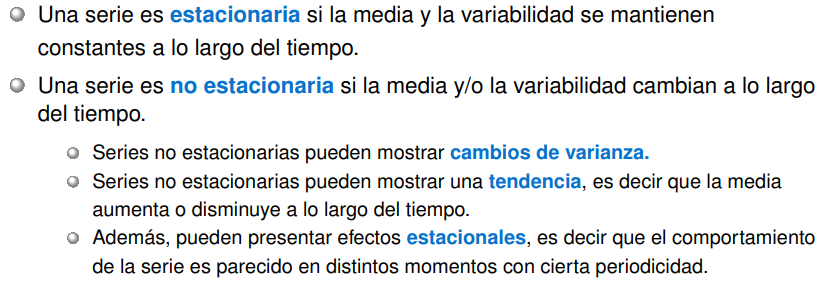

Una serie es estacionaria/estocástica si no presenta tendencia temporal en media y varianza. La variable es aleatoria, los datos futuros no tienen ninguna estructura de dependencia con los datos pasados y el valor futuro es igual al valor presente (la distribución de los valores permanece igual). 

Tenemos que asegurarnos de la estacionariedad débil en nuestra serie para poder implementar los modelos de predicción. 

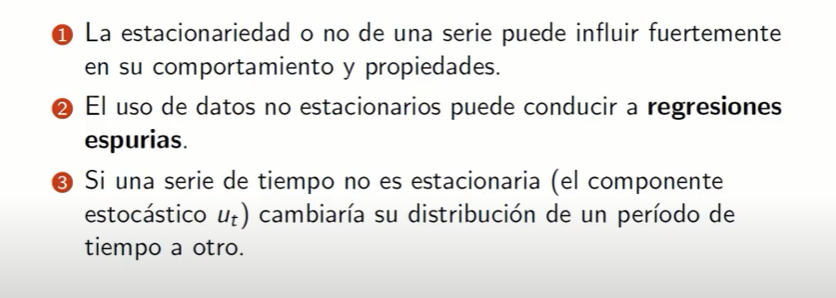

Para comprobar que una serie es estacionaria débil (p.ej. el ruido blanco)

-. Media constante (valor promedio de errores = 0)

-. Varianza constante(homocedasticidad)

-. Covarianza entre dos variables de la serie depende solo de su separación en el tiempo.





### 1. Test de Dickey Fuller para la estacionariedad de la serie.

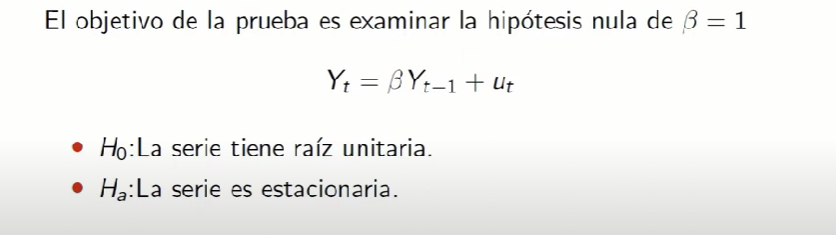

H0: La serie NO es estacionaria 

H1: La serie es estacionaria

Por tanto, nos interesará que el contraste de hipótesis sea rechazado (p-valor < 0.05).

In [46]:
exec(open('NuestrasFunciones.py').read())

In [47]:
test_stationarity(defunciones["Todas las causas"])      #Test de Dickey Fuller aumentado

Results of Dickey-Fuller Test:
Test Statistic                  -0.942604
p-value                          0.773619
#Lags Used                      14.000000
Number of Observations Used    453.000000
Critical Value (1%)             -3.444868
Critical Value (5%)             -2.867941
Critical Value (10%)            -2.570180
dtype: float64


p-valor = 0,77 > 0,05 -> No se puede rechazar la hipotesis nula -> Según el Test de Dickey Fuller LA SERIE NO ES ESTACIONARIA

### 2. Descomposición de la serie

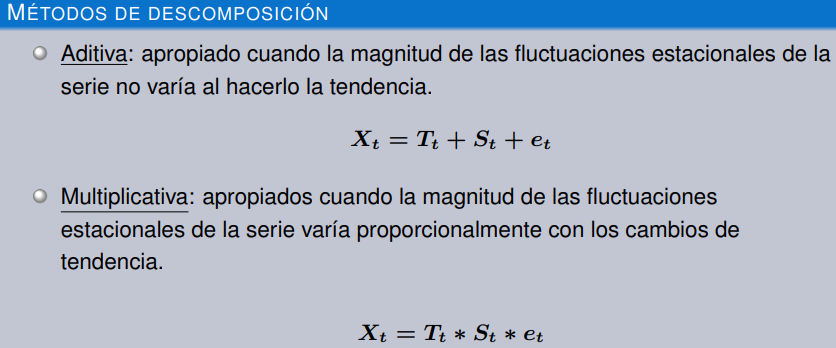


Tt = tendencia (la ponemos como una componente en el modelo, para quitarla pero sin quitarla)

St = estacionalidad (la ponemos como una componente en el modelo, para quitarla pero sin quitarla)

et = error aleatorio (o no)


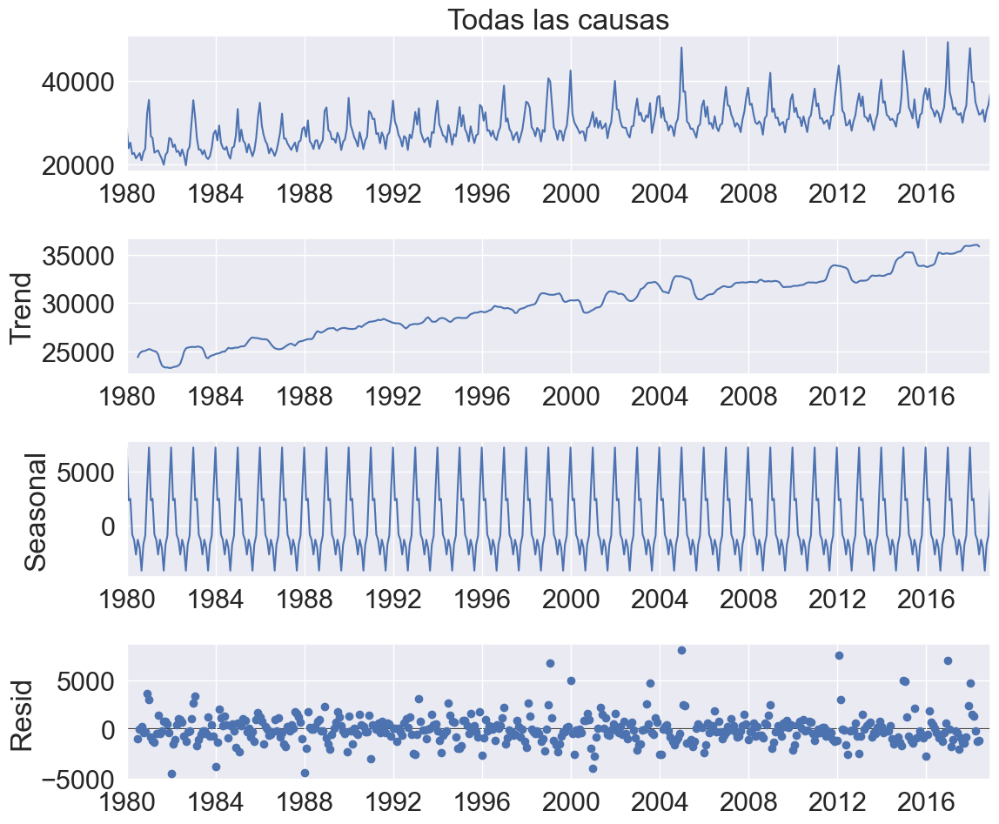

In [48]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Descomposición aditiva
defunciones_desc_Ad = seasonal_decompose(defunciones['Todas las causas'], model='additive',period=12)  #period = 12 porque es una serie mennsual que se repite cada año (cada 12 instantes hay un dato)
defunciones_desc_Ad.plot()
plt.show()

In [49]:
# Evaluamos la estacionariedad de los residuos de la descomposición aditiva:
# Debido a que la tendencia se calcula por medias móviles, los primeros y últimos valores de la serie son NA, no se calculan. Simplemente saber esto y tener en cuenta solamente los residuos válidos.

test_stationarity(defunciones_desc_Ad.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.833132e+00
p-value                        4.975783e-17
#Lags Used                     1.800000e+01
Number of Observations Used    4.370000e+02
Critical Value (1%)           -3.445403e+00
Critical Value (5%)           -2.868177e+00
Critical Value (10%)          -2.570305e+00
dtype: float64


p-valor < 0,05 =====> Rechaza la hipotesis nula -> LOS RESIDUOS SON ESTACIONARIOS

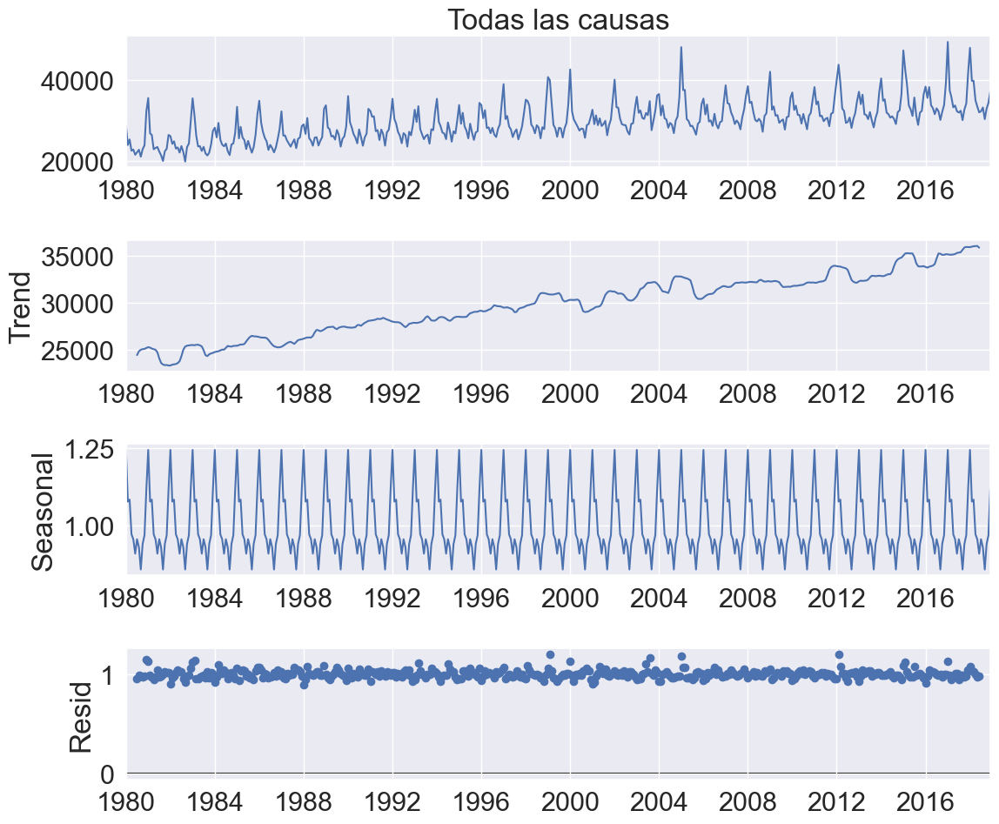

In [50]:
# Descomposición multiplicativa

defunciones_desc_mul = seasonal_decompose(defunciones['Todas las causas'], model='multiplicative',period=12)
defunciones_desc_mul.plot()
plt.show()

In [51]:
test_stationarity(defunciones_desc_mul.resid.dropna())

Results of Dickey-Fuller Test:
Test Statistic                -9.977362e+00
p-value                        2.159804e-17
#Lags Used                     1.700000e+01
Number of Observations Used    4.380000e+02
Critical Value (1%)           -3.445368e+00
Critical Value (5%)           -2.868161e+00
Critical Value (10%)          -2.570297e+00
dtype: float64


Tanto la descomposición aditiva como la multiplicativa obtienen unos residuos estacionarios (p-valor <0,05), pero en este caso escogemos la descomposición multiplicativa debido a que los residuos en ella parecen ser mucho más aleatorios que en la aditiva (el p-valor en la aditiva es mayor al p-valor en la multiplicativa).

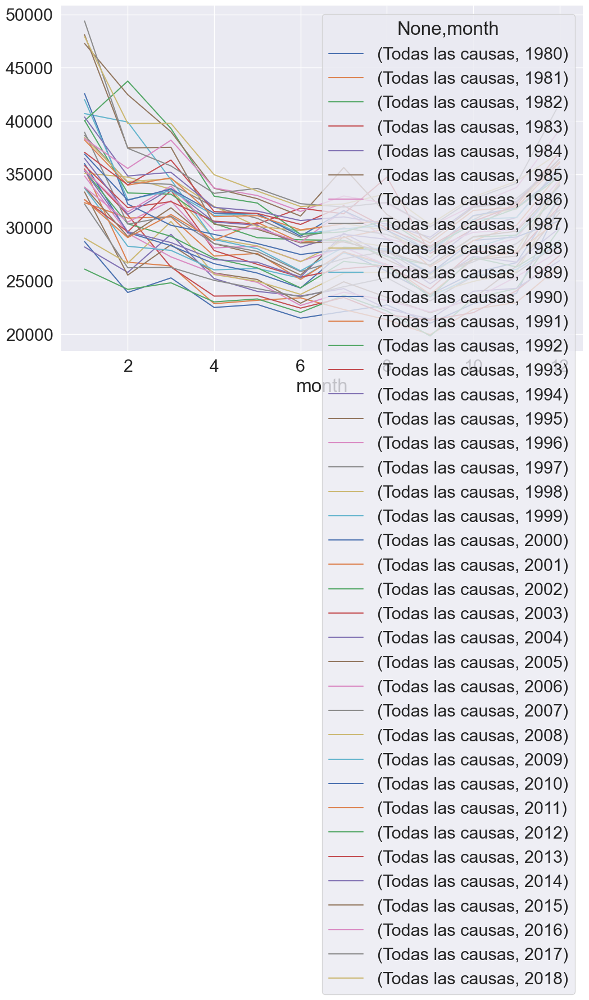

In [52]:
seasonal_plot(defunciones, column = "Todas las causas" )

plt.show()

Apreciamos un componente estacional bastante constante en el tiempo porque vemos que la fluctuación es parecida, va fluctuando por mes. Vemos que las defunciones en febrero caen, en marzo suben, en abril bajan, en mayo y en los meses de verano suben...

### 3. Hacia la estacionariedad

Vamos a extraer las componentes identificadas para generar una serie residual y comprobar si es estacionaria una vez eliminados los efectos típicos de las series temporales. El objetivo es convertir la serie original en una serie aproximadamente estacionaria.

El esquema es:

1. Estabilización de la varianza = Transformación Logaritmica. El primer paso es eliminar el efecto de heterocedasticidad.
2. Diferenciación regular = Eliminar la tendencia. Una vez se tiene la serie con varianza estable, si se intuye una tendencia aproximadamente lineal, puede ser eliminada mediante una diferenciación.
3. Diferenciación estacional = Eliminar la estacionalidad. Si se observa comportamineto periódico, se puede tratar de eliminar aplicando una diferenciación estacional (mensual, trimestral, anual...)

El método más común y conveniente para estacionar la serie es diferenciar la serie al menos una vez hasta que se vuelva aproximadamente estacionaria. Si Y_tes el valor en el tiempo ‘t’, entonces la primera diferencia de Y = Y t – Y t-1. En términos más simples, diferenciar la serie no es más que restar el siguiente valor por el valor actual.

Si la primera diferencia no hace que una serie sea estacionaria, puede optar por la segunda diferenciación. Etcétera.

Por ejemplo, considere la siguiente serie: [1, 5, 2, 12, 20]

-- La primera diferenciación da: [5-1, 2-5, 12-2, 20-12] = [4, -3, 10, 8]

-- La segunda diferenciación da: [-3-4, -10-3, 8-10] = [-7, -13, -2]

Este proceso se va acumulando: sobre el logaritmo hago la diferenciación regular periodo=1, sobre esa hago la diferenciación estacional periodo=12

Con la serie resultante, comprobaremos estacionariedad y será con la que podemos valorar autocorrelaciones simples y parciales para proponer órdenes ARIMA tentativos para la serie.

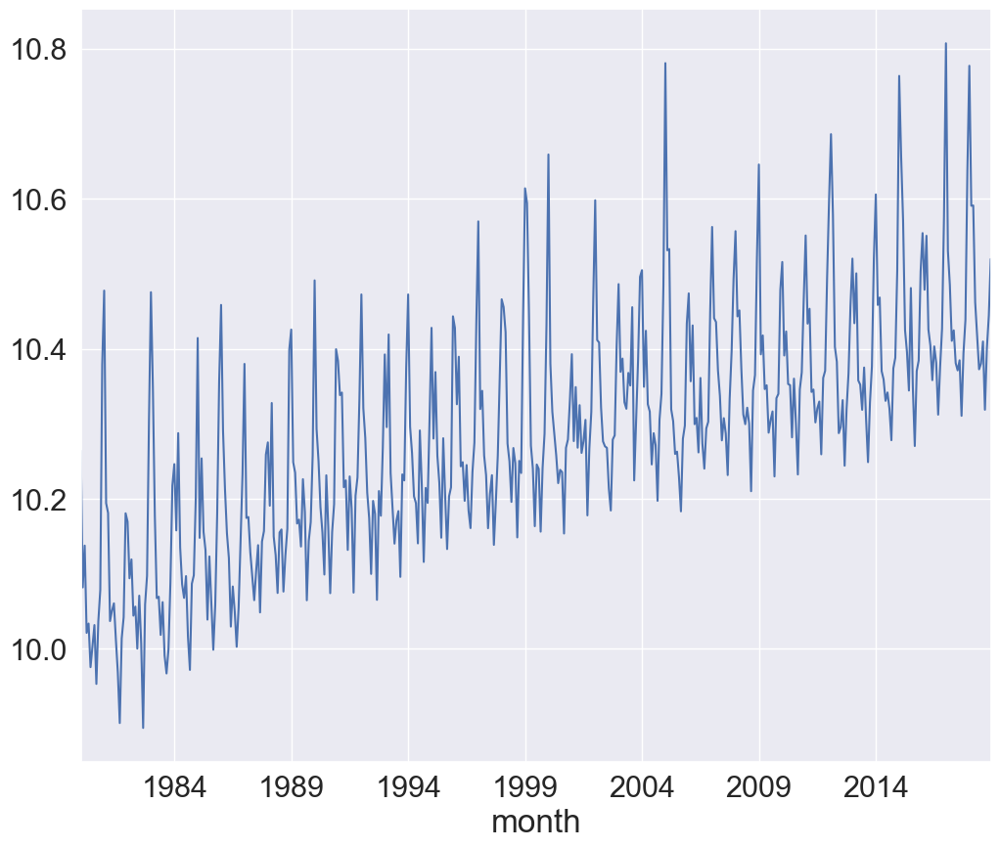

In [53]:
# 3.1. Estabilización de la varianza. Transformación Logaritmica de la variable "Todas las causas"

defuncionestodLog = np.log(defunciones['Todas las causas'])
defuncionestodLog.plot()
plt.show()

Apreciamos tendencia creciente en el tiempo, a simple vista parece estacional

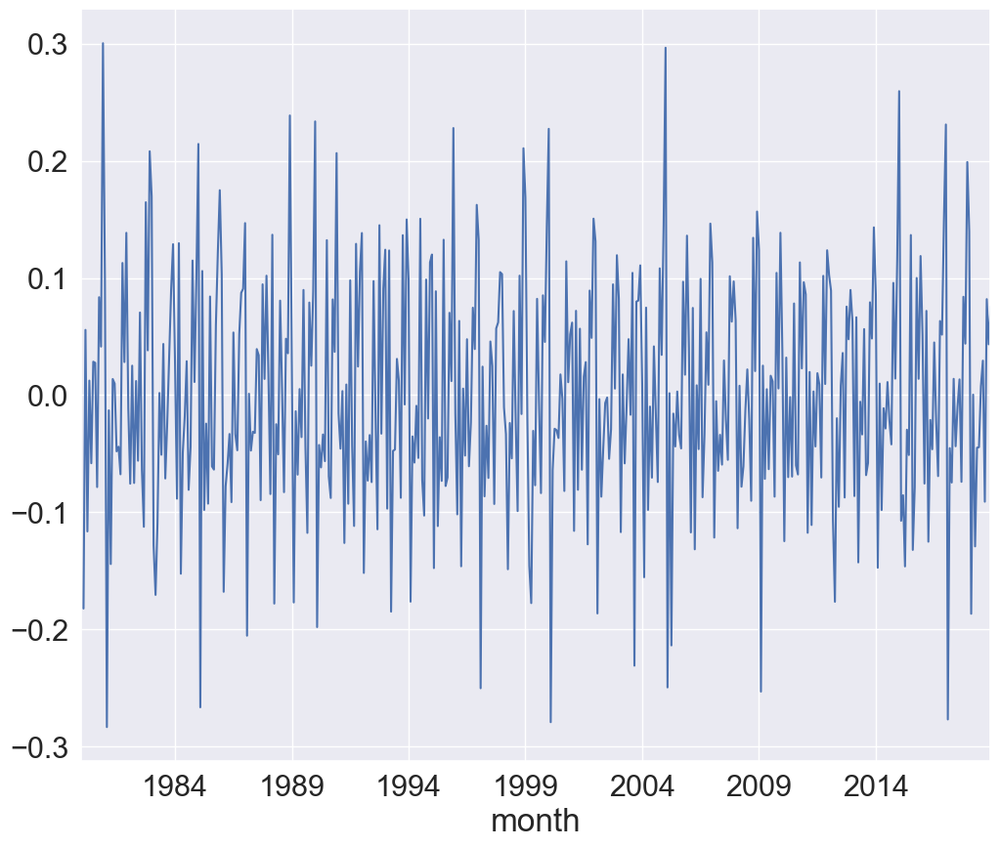

In [54]:
# 3.2. Diferenciación regular (un solo periodo = lo que pasó ayer vs lo que ha pasado hoy)
defuncionestodLog_diff_1 = defuncionestodLog.diff(periods=1)  # 1 solo periodo
defuncionestodLog_diff_1.plot() 
plt.show()

Aquí ya se ha aplanado, es recto, es decir, no hay tendencia creciente, y casi no se aprecia ninguna estacionalidad.

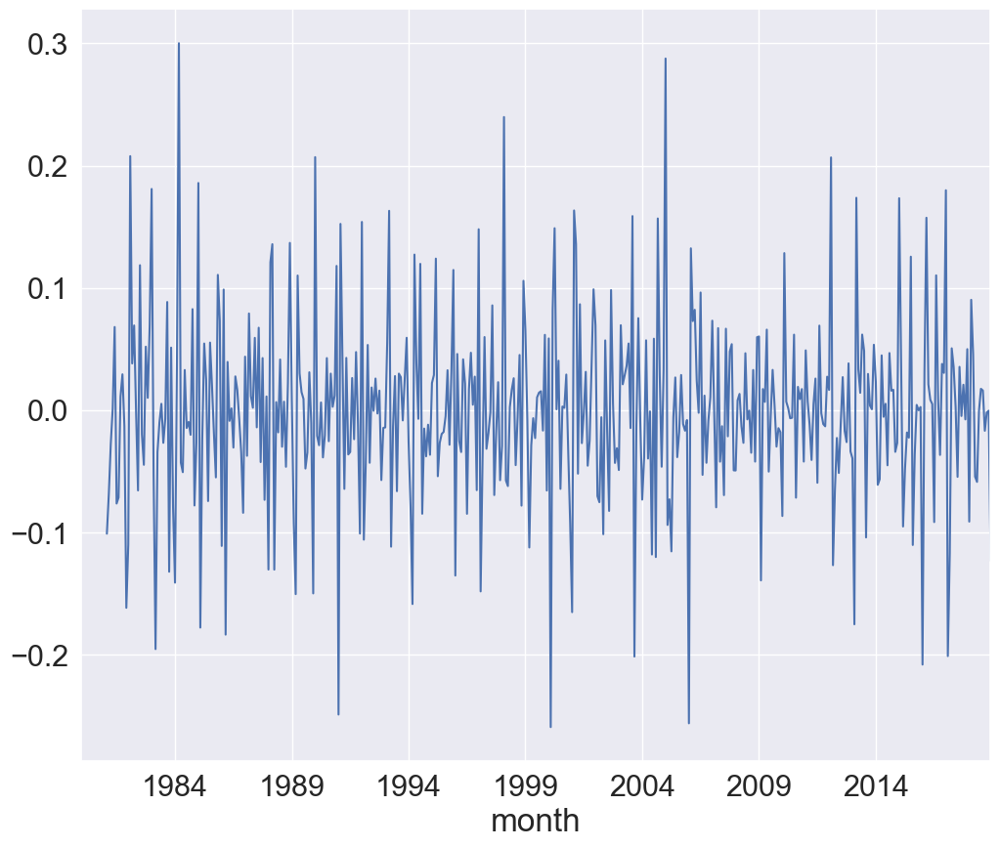

In [55]:
# 3.3. Diferenciación estacional (12 periodos, uno por cada mes)
defuncionestodLog_diff_1_12 = defuncionestodLog_diff_1.diff(periods=12)   #12 periodos, uno por cada mes
defuncionestodLog_diff_1_12.plot()
plt.show()

In [56]:
# Comprobación de la estacionariedad de la diferenciación estacional

test_stationarity(defuncionestodLog_diff_1_12.dropna(inplace=False))

Results of Dickey-Fuller Test:
Test Statistic                -1.029023e+01
p-value                        3.586141e-18
#Lags Used                     1.700000e+01
Number of Observations Used    4.370000e+02
Critical Value (1%)           -3.445403e+00
Critical Value (5%)           -2.868177e+00
Critical Value (10%)          -2.570305e+00
dtype: float64


##### p- valor <0,05 -> Se rechaza la hipótesis nula -> LA SERIE YA ES ESTACIONARIA

### 4 . Autocorrelaciones

Creamos diferentes variables con los datos que ya tenemos: con Yt creamos Yt-1, Yt-2... y vemos sus correlaciones


-- ACF: Función de autocorrelación simple: correlaciones pero sin descontar los efectos intermedios (p.ej. la correlación entre Xt y Xt-2 podría estar afectada por Xt-1, pues esta función tiene en cuenta ese efecto)

Muy útil para ver si la serie es o no estacionaria

-- PACF: Función de autocorrelación parcial: descuenta los efectos intermedios (p.ej. quita el efecto de Xt-1), es decir, hace una correlación pura entre Xt y Xt-2

In [57]:
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

#### 4.1. Correlogramas ACF

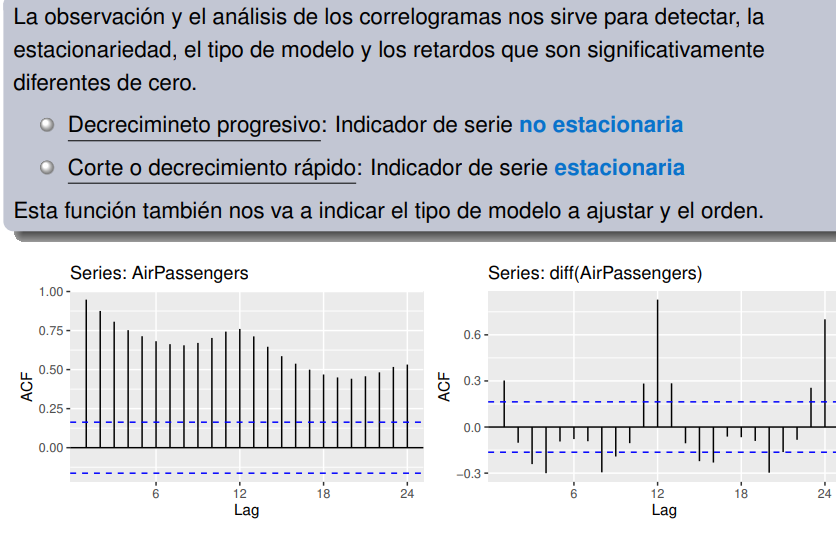

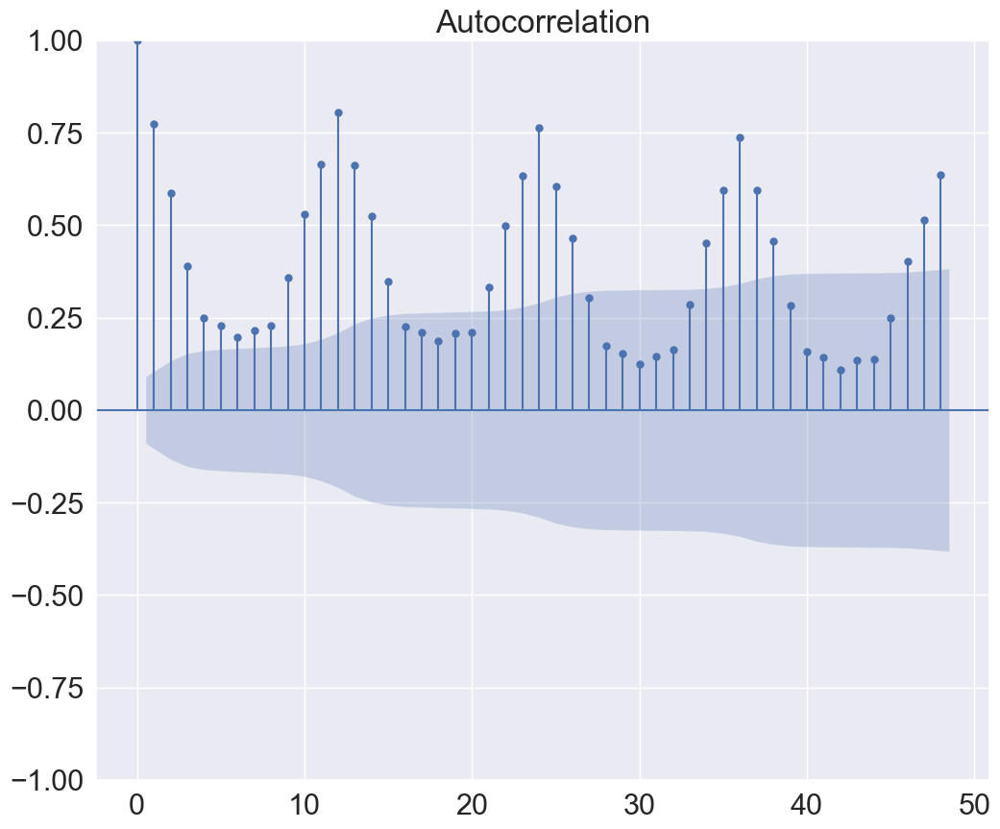

In [58]:
# Acf de la primera serie (original y era estacionaria)

plot_acf(defunciones['Todas las causas'].dropna(inplace=False), lags = 48)
plt.show()

El área azul es el intervalo de confianza, deberíamos obtener unos resultados que estén dentro del mismo

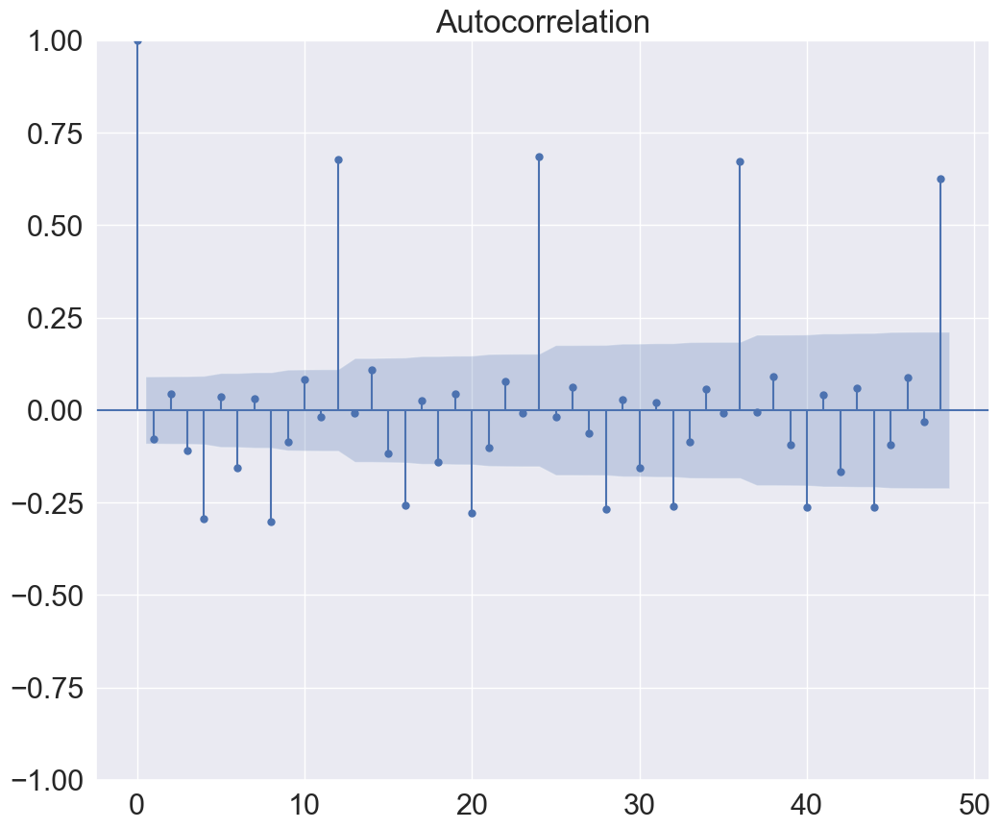

In [59]:
# ACF para la serie diferenciada regular (period =1), serie sin tendencia

plot_acf(defuncionestodLog_diff_1.dropna(inplace=False), lags =48)
plt.show()

Ya no hay decrecimiento lento, parece que hay estacionariedad en medias, cada 12 hay un pico, aún se puede mejorar:

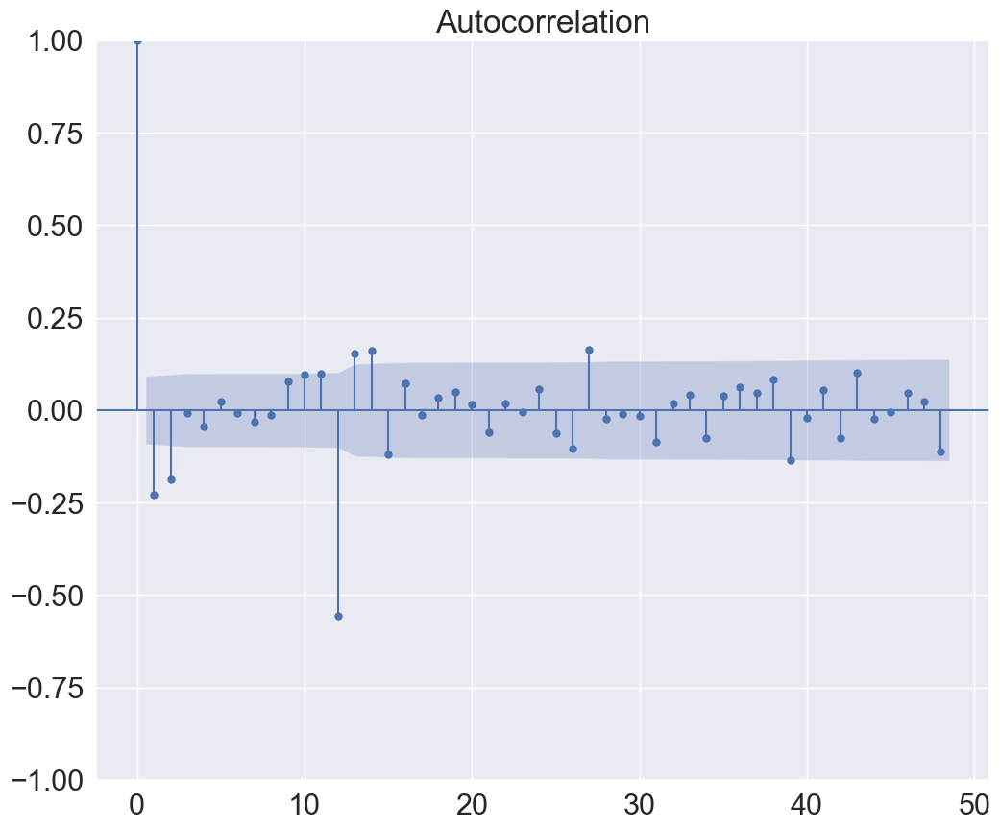

In [60]:
# ACF para la serie diferenciada estacional (period =12), serie sin tendencia ni estacionalidad
plot_acf(defuncionestodLog_diff_1_12.dropna(inplace=False), lags = 48)
plt.show()

Como vemos en los correlogramas, en la serie original se ve un decrecimiento progresivo, lo que indica no estacionariedad, en cambio, en las dos siguientes series diferenciadas ya podemos ver cortes o decrecimientos rápidos, por lo que vemos que son estacionarias (ya lo sabíamos de antes). 


Igualmente en el último correlograma vemos que quedan cosas significativas (fuera del intervalo de confianza)

#### 4.2. Correlogramas PACF

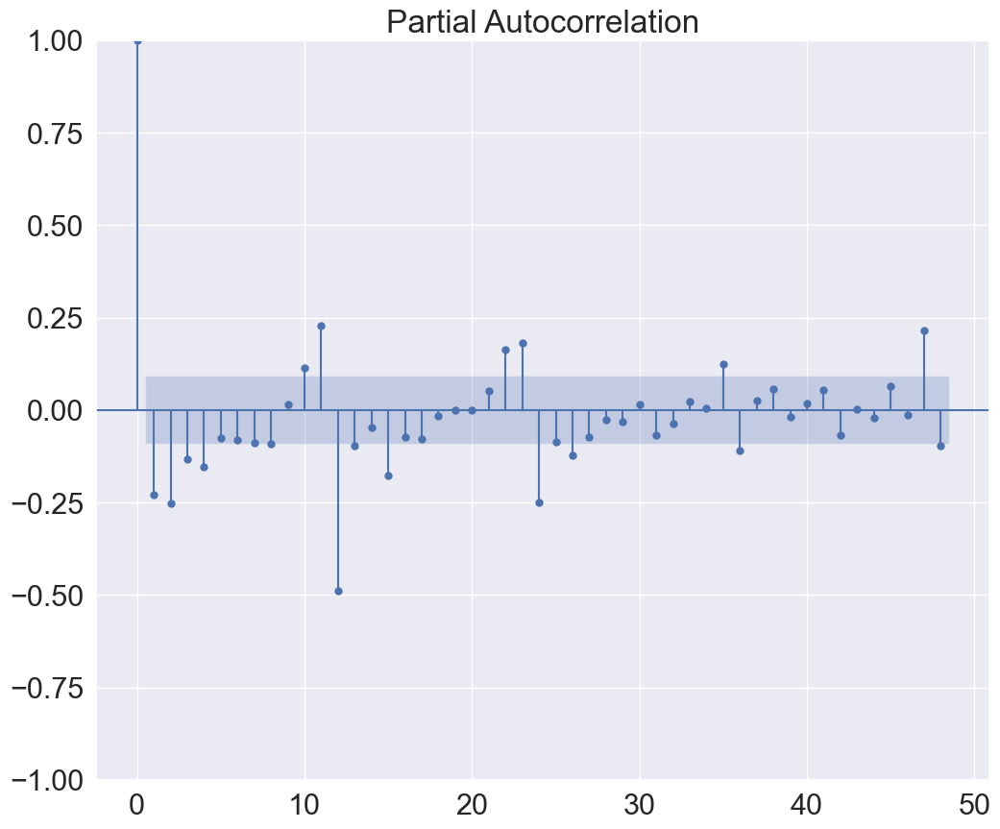

In [61]:
# PACF de serie diferenciada 12
plot_pacf(defuncionestodLog_diff_1_12.dropna(inplace=False), lags=48, method = "ywm")
plt.show()

Comparamos correlogramas ACF y PACF para buscar valores AR(se corta el PACF) o MA(se corta el ACF): 




#### 4.2. Test Ljung-Box

Calcula las autocorrelaciones para la serie diferencial. El test nos da para cada uno de los retardos un estadístico y un p-valor (nos indica si una autocorrelación es significativa o no)

In [62]:
# Autocorrelaciones de la serie diferenciada
sm.stats.acorr_ljungbox(defuncionestodLog_diff_1_12.dropna(inplace=False), lags= 12, return_df=True)

,lb_stat,lb_pvalue
1,23.778074,1.081070e-06
2,40.114171,1.946787e-09
3,40.137704,9.962462e-09
4,41.071693,2.597509e-08
5,41.320966,8.081170e-08
6,41.356094,2.463609e-07
7,41.788551,5.710869e-07
8,41.881523,1.425366e-06
9,44.695833,1.050197e-06
10,49.055084,3.979652e-07


Significativa debido a que todos los p-valores son bajos -> correlaciones en general significativas

In [63]:
# Autocorrelaciones de la serie al natural, con 12 retardos:
sm.stats.acorr_ljungbox(defunciones['Todas las causas'], lags=12, return_df=True)

,lb_stat,lb_pvalue
1,281.343726,3.826286e-63
2,443.309748,5.451442e-97
3,515.264707,2.346854e-111
4,544.849132,1.331532e-116
5,569.522868,7.763396e-121
6,588.020615,8.945304e-124
7,610.126932,1.605393e-127
8,634.829595,7.574366e-132
9,696.461992,3.985347e-144
10,830.660066,5.272461e-172


Vemos que los p-valores son muchísimo más bajos -> autocorrelaciones mucho más significativas en la serie al natural que en la serie diferenciada

### 5. Modelos de suavizado

In [64]:
#Modelos de suavizado
import statsmodels.tsa.holtwinters as ets
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Generamos la serie logaritmica (para evitar heterocedasticidad, la tendencia y la estacionalidad ya se encargará el modelo de recoger y modelizar)
defuncionestodLog = defuncionestodLog.copy()        #hago copia
defuncionestodLog = np.log(defuncionestodLog)
defuncionestodLog

# Tomo una ventana training-test
defunciones_tr = defunciones[:'2016-12-01'] #hasta 2016
defunciones_tst = defunciones['2017-01-01':] #del 2017 al final
defunciones_tst


,Todas las causas,Tumores,Causas externas
month,,,
2017-01-01,49370,10558,1453
2017-02-01,37434,8954,1251
2017-03-01,35779,9581,1257
2017-04-01,33208,9032,1207
2017-05-01,33673,9385,1235
2017-06-01,32236,8922,1330
2017-07-01,31924,9373,1418
2017-08-01,32356,9271,1440
2017-09-01,30049,9078,1281


Definimos aquí una función para evaluar un modelo (será válido para modelos de suavizado y arima de statsmodels pero no para auto_arima…distintos valores de salida y ajustaremos luego la función para ello)

In [65]:
# Función para evaluar modelo

def eval_model(model,tr,tst,name='Model',lags=12):
    lb = np.mean(sm.stats.acorr_ljungbox(model.resid, lags=lags, return_df=True).lb_pvalue)
    pred = model.forecast(steps=len(tst))
    fig1, ax = plt.subplots()
    ax.plot(tr, label='training')
    ax.plot(tst, label='test')
    ax.plot(pred, label='prediction')
    plt.legend(loc='upper left')
    tit = name + ":  LjungBox p-value --> " + str(lb) + "\n MAPE: " + str(round(mean_absolute_percentage_error(tst, pred)*100,2)) + "%"
    plt.title(tit)
    plt.ylabel('Serie')
    plt.xlabel('Date')
    plt.show()
    print(lb)

Existen varios modelos de suavizado: 

-  Suavizado simple (SES): para series sin tendencia y estacionalidad
-  Suavizado doble de Holt: para series que presenta tendencia, asumida como lineal con pendiente que varia en el tiempo (con pendiente pero sin componente estacional). Esperamos una recta con pendiente como predicción.
-  Suavizado de Holt Winters: para series con comportamiento estacional, que se trata mediante la inclusión de un término adicional al modelo de alisado doble anterior
    - Aditivo:fenómenos estacionales que no varian a lo largo del tiempo
    - Multiplicativo: fenómenos estacionales cuya influencia varía a lo largo del tiempo

AIC y BIC cuanto menores mejor es el modelo


##### 5.1. Suavizado doble de Holt

In [66]:
# Suavizado doble de Holt
holt = ets.Holt(defunciones_tr['Todas las causas']).fit()
holt.summary()

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Dep. Variable:,Todas las causas,No. Observations:,444
Model:,Holt,SSE,4568355138.329
Optimized:,True,AIC,7177.088
Trend:,Additive,BIC,7193.471
Seasonal:,None,AICC,7177.280
Seasonal Periods:,None,Date:,"Thu, 29 Jun 2023"
Box-Cox:,False,Time:,15:20:48
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.9478571,alpha,True
smoothing_trend,0.0693554,beta,True


SSE = error = en este caso es enorme

smoothing_level	(alpha) es aprox 1, lo que significa que no está suavizando prácticamente nada en tendencia,  está reproduciendo el comportamiento de la serie un paso adelante. 

smoothing_trend (beta) es un poco bajo pero no mucho, por lo que suaviza algo en pendiente

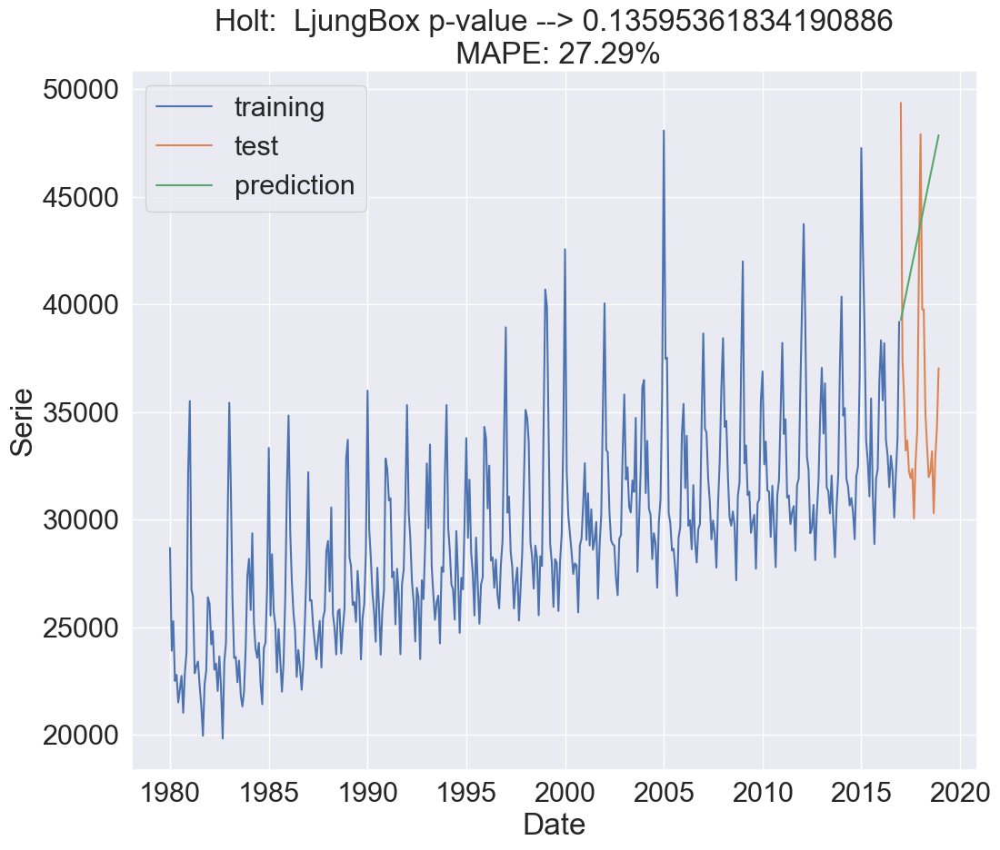

0.13595361834190886


In [67]:
# Evaluamos el modelo Holt
eval_model(holt,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Holt')


En el test de Ljung-box nos interesa un p-valor alto (>0,05), en este caso es 0.13595361834190886. 

MAPE = error absoluto medio en porcentaje = 27,29%

##### 5.2. Suavizado de Holt Winters Aditivo

Vamos a los métodos que podrían funcionar sobre esta serie. En primer lugar, Holt Winters aditivo. Con el aspecto de la serie y la clara heterocedasticidad, no parece que sea la mejor opción…pero probar con el logaritmo para ver el cambio.

In [68]:
# Suavizado de Holt Winters Aditivo
hw_add = ets.ExponentialSmoothing(defunciones_tr['Todas las causas'],trend='add', damped_trend=False, seasonal='add').fit()
hw_add.summary()

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Dep. Variable:,Todas las causas,No. Observations:,444
Model:,ExponentialSmoothing,SSE,1145515912.319
Optimized:,True,AIC,6586.904
Trend:,Additive,BIC,6652.437
Seasonal:,Additive,AICC,6588.513
Seasonal Periods:,12,Date:,"Thu, 29 Jun 2023"
Box-Cox:,False,Time:,15:20:55
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.4646429,alpha,True
smoothing_trend,0.0001,beta,True


- El error SSE cae 4 veces con respecto al modelo anterior, pero sigue siendo muy alto
- El AIC y BIC caen también con respecto al modelo anterior
- El alpha y beta han mejorado muchísimo: alpha antes era casi 1 y ahora es 0,4646 y el beta pasa de 0,069 a 0,0001

Todo esto nos indica que vamos por el camino correcto

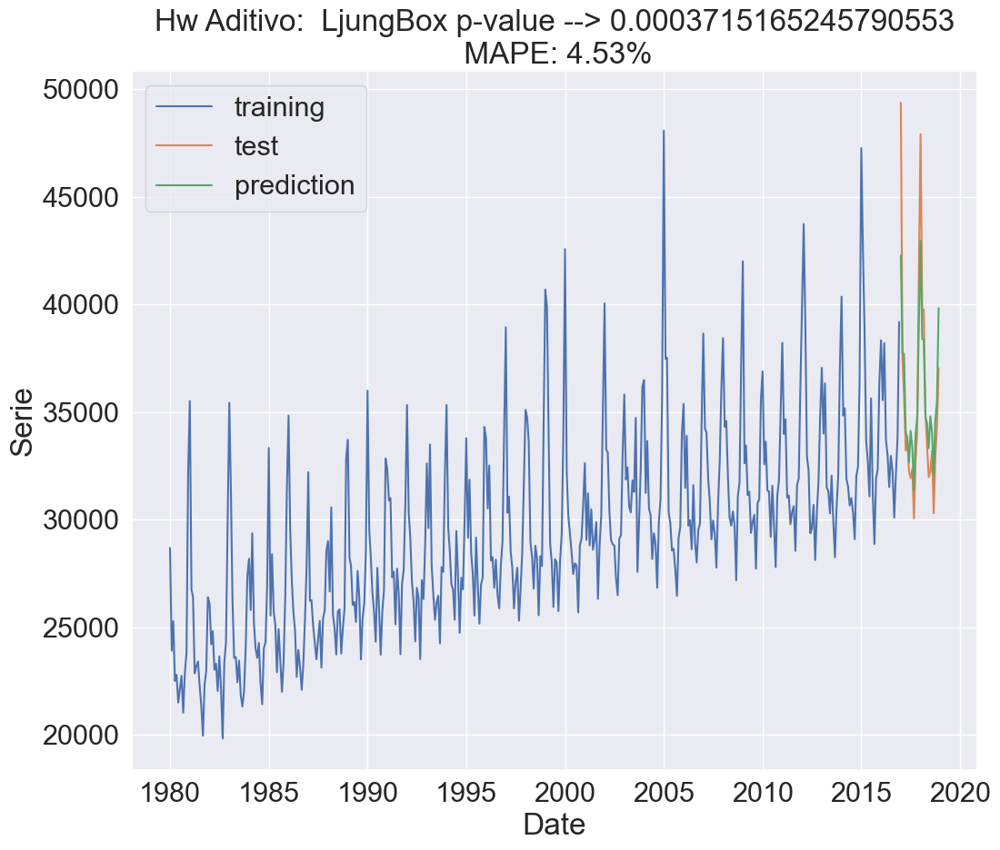

0.0003715165245790553


In [69]:
eval_model(hw_add,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Hw Aditivo')

- Test de Ljung-Box p-valor es 0.0003715165245790553, que es menor a 0,05 -> la cosa no pasa
- error MAPE baja del 27,29% al 4,53% -> buen camino
- Visualmente en el gráfico podemos ver que el modelo va captando la dinámica de los datos (la línea verde ya es muy parecida a la naranja, aunque no es del todo preciso en los picos de subida y de bajada)

##### 5.3. Suavizado de Holt Winters Multiplicativo

Hemos tomado la serie logaritmica por lo que no habrá muchas diferencias entre la serie aditiva y la multiplicativa

In [70]:
#Suavizado de Holt Winters Multiplicativo
hw_mul = ets.ExponentialSmoothing(defunciones_tr['Todas las causas'],trend='mul', damped_trend=False, seasonal='mul').fit()
hw_mul.summary()

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Dep. Variable:,Todas las causas,No. Observations:,444
Model:,ExponentialSmoothing,SSE,1124543562.024
Optimized:,True,AIC,6578.699
Trend:,Multiplicative,BIC,6644.233
Seasonal:,Multiplicative,AICC,6580.309
Seasonal Periods:,12,Date:,"Thu, 29 Jun 2023"
Box-Cox:,False,Time:,15:21:00
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.4646429,alpha,True
smoothing_trend,0.0001,beta,True


- El error SSE cae con respecto al modelo anterior -> bien
- El AIC y BIC también caen con respecto al modelo anterior, aunque no mucho -> bien
- Alpha y beta se mantienen iguales

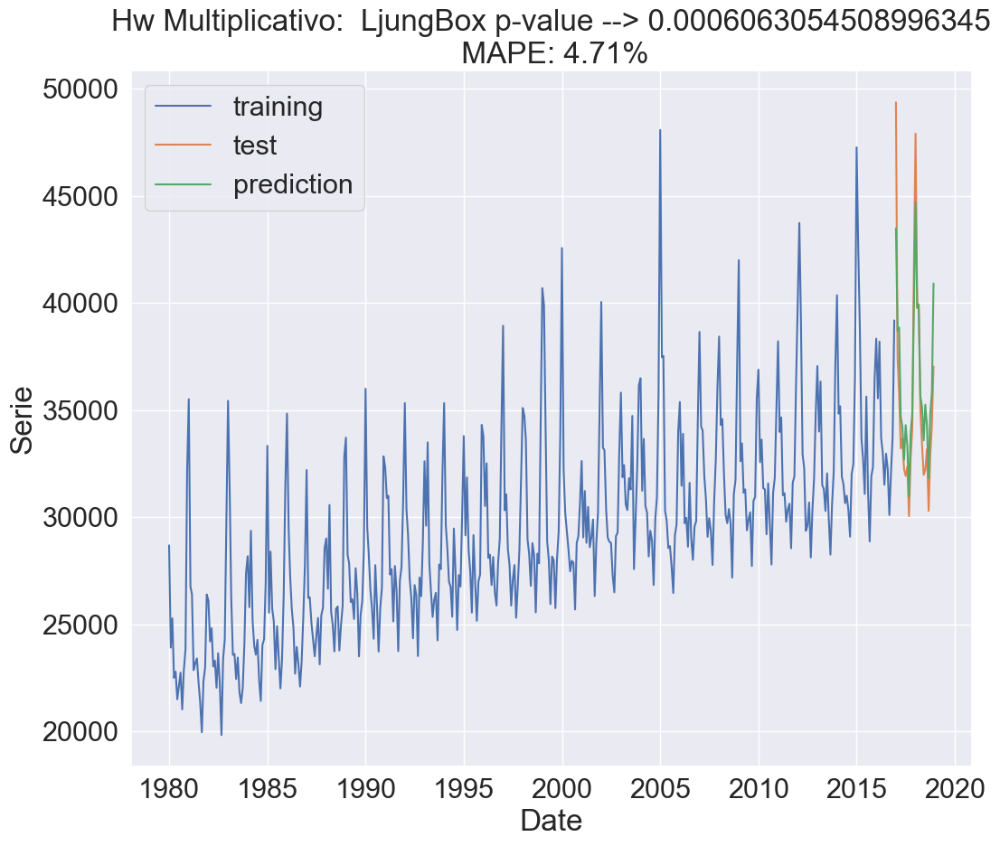

0.0006063054508996345


In [71]:
eval_model(hw_mul,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Hw Multiplicativo')

- p-valor: aumenta con respecto al modelo anterior, por lo que mejora, pero estadísticamente sigue sin valer este modelo (es menor a 0,05) 
- error MAPE: pasa de 4,53% a 4,71% -> peor capacidad predictiva

Tenemos que hacer modelos ARIMA a ver si nos sale un p-valor de Ljung-Box bueno y una buena capacidad predictiva, ya que el modelo aditivo y el multiplicativo salen prácticamente iguales, algo mejor el multiplicativo en todo caso

##### 5.4. Autocorrelaciones con intervalos de confianza

Podemos evaluar los correlogramas de los residuos para este último modelo multiplicativo.

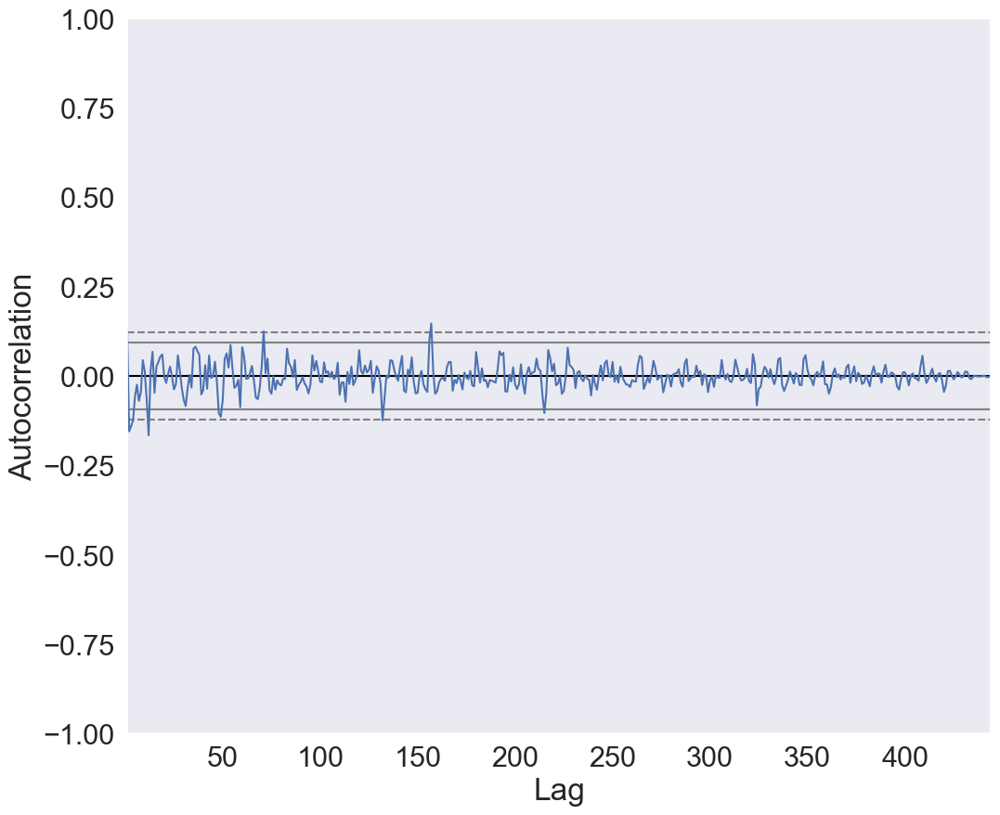

In [72]:
from pandas.plotting import autocorrelation_plot

plt.clf()
autocorrelation_plot(hw_mul.resid)
plt.show()

Vemos que hay bastantes picos que se salen de las dos líneas continuas, esto es lo que hace que el test de Ljung-Box esté saliendo con un p-valor tan bajo

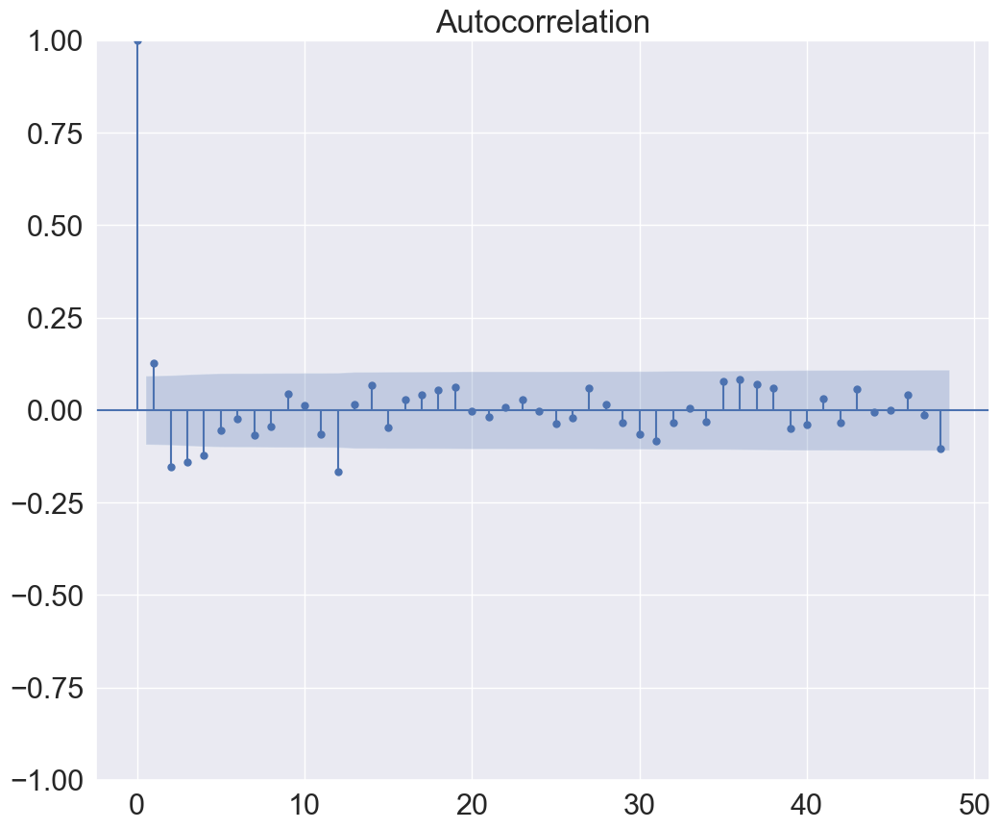

In [73]:
plot_acf(hw_mul.resid,lags=48)
plt.show()

Me sigo dejando algo fuera en 1 y algo en 12 -> Modelos ARIMA que capten estos puntos con un orden 1

### 6. Buscando el mejor Modelo ARIMA

Buscamos que pase el test residual de Ljung-Box

##### 6.1. ARIMA Manual

Podemos ajustar modelos ARIMA manuales con SARIMAX de statsmodels. Para ello, en primer lugar se deben evaluar las autodcoleraciones para identificar patrones de efectos AR y MA tentativos. Una vez tenemos una idea de los órdenes a proponer, ajustamos los modelos.

Recordamos correlogramas ACF y PACF de la serie logaritmica y doblemente diferenciada.

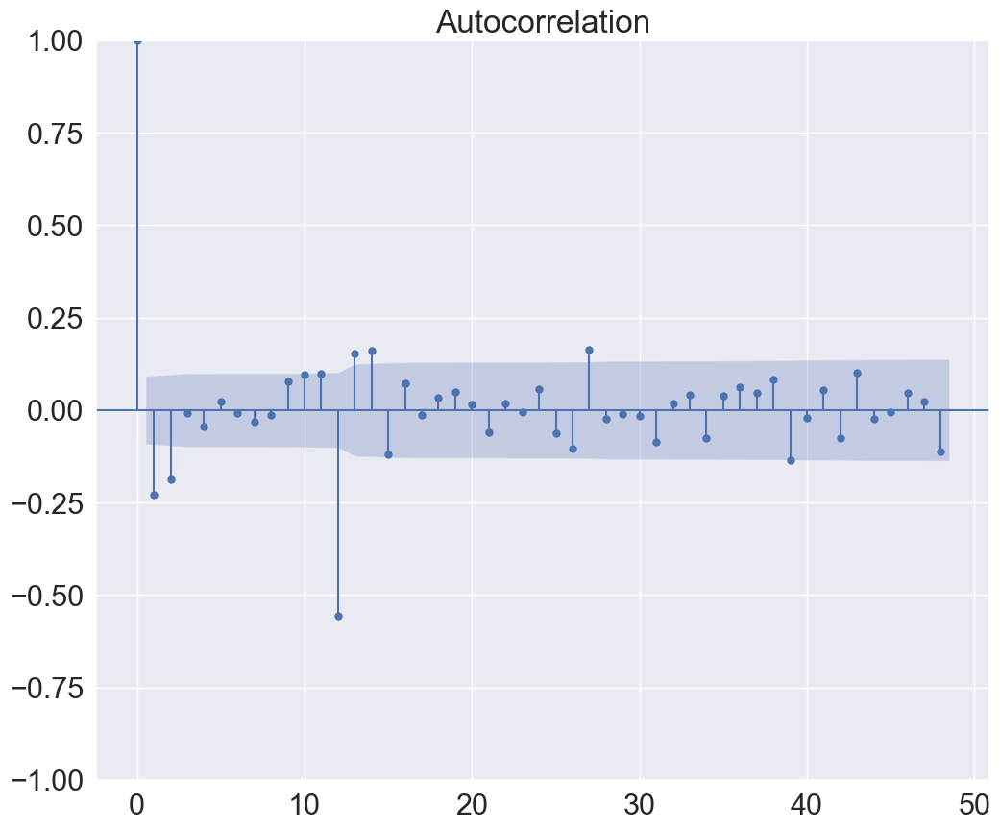

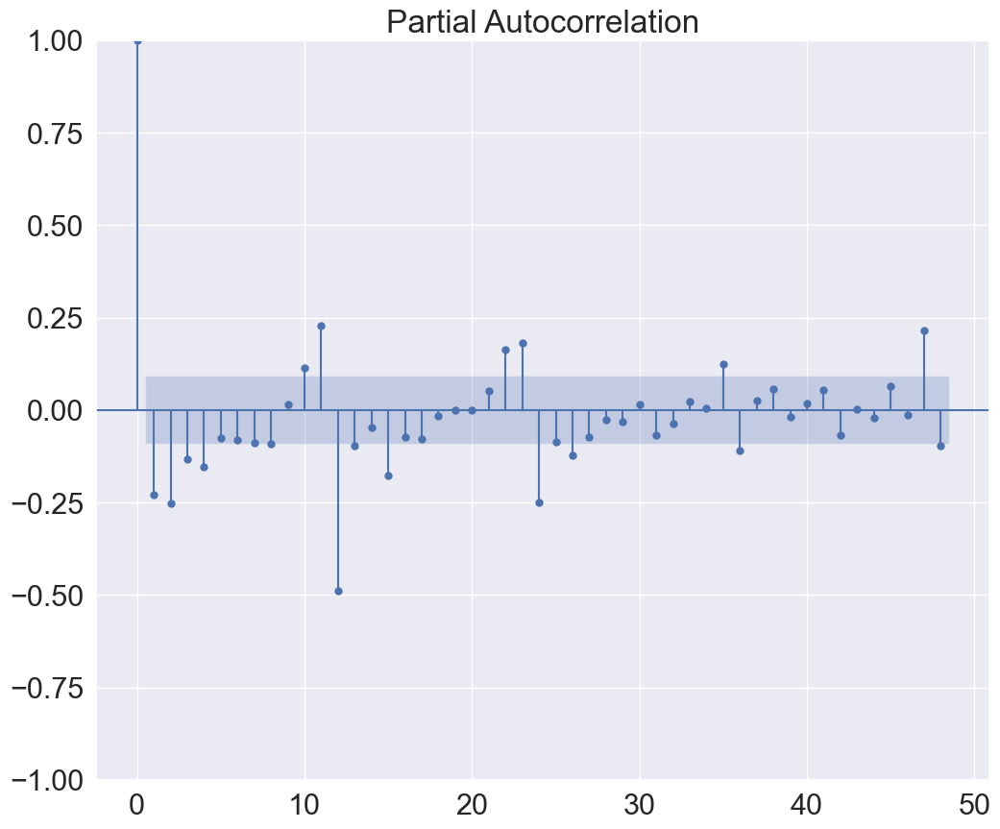

In [74]:
plot_acf(defuncionestodLog_diff_1_12.dropna(inplace=False),lags=48)
plt.show()

plot_pacf(defuncionestodLog_diff_1_12.dropna(inplace=False),lags=48,method='ywm')
plt.show()

#### Modelo 1 -> Con ambas partes MA

In [75]:
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
  
arima1 = SARIMAX(defunciones_tr['Todas las causas'], 
                order = (0, 1, 1), 
                seasonal_order =(0, 1, 2, 12))

arima_1 = arima1.fit()
arima_1.summary()

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                        Todas las causas   No. Observations:                  444
Model:             SARIMAX(0, 1, 1)x(0, 1, [1, 2], 12)   Log Likelihood               -3831.772
Date:                                 Thu, 29 Jun 2023   AIC                           7671.544
Time:                                         15:21:15   BIC                           7687.809
Sample:                                     01-01-1980   HQIC                          7677.966
                                          - 12-01-2016                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2978      0.031     -9.763      0.000      -0.358      -0.238
ma.S.L12      -1.0593      0.047    -22.326      0.000      -1.152      -0.966
ma.S.L24       0.0599      0.029      2.044      0.041       0.002       0.117
sigma2      2.697e+06    1.8e-08    1.5e+14      0.000     2.7e+06     2.7e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):               702.53
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                             0.06
Prob(H) (two-sided):                  0.61   Kurtosis:                         9.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.76e+28. Standard errors may be unstable.
"""

**AIC**

**BIC**

El p-valor de ma.S.L24 no es cero, no es un parámetro significativo

prob(Q)=p-valor= 0,80 -> modelo cuyos residuos quedan incorrelados, está bastante bien.  

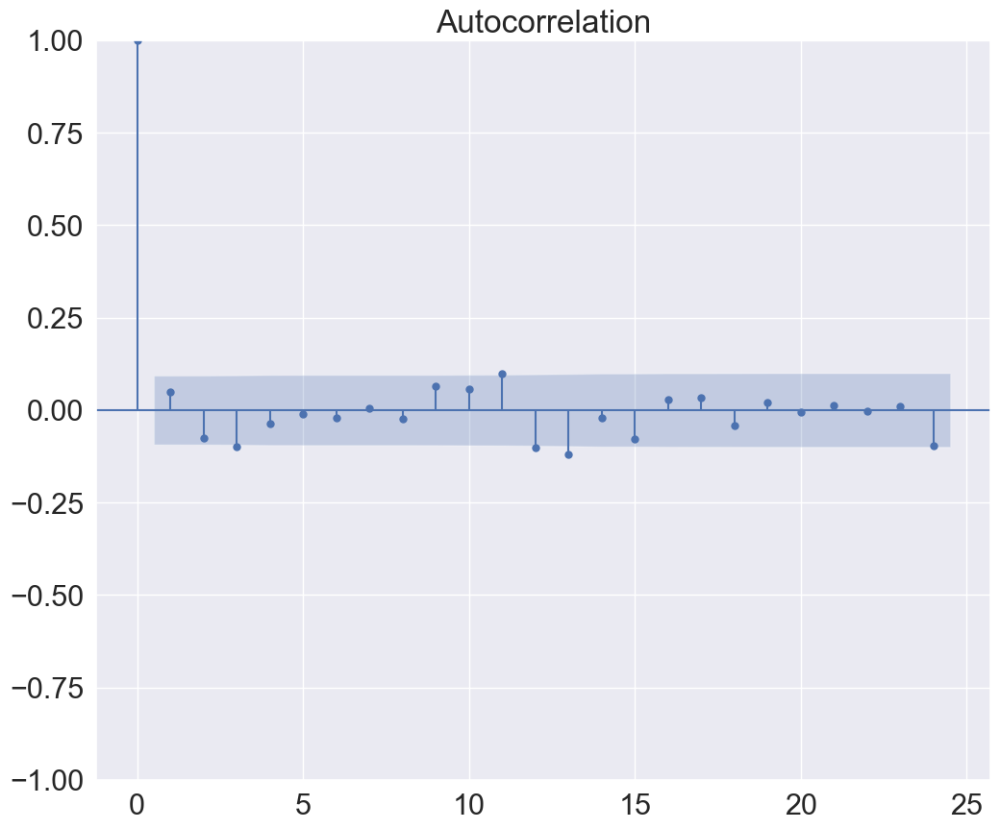

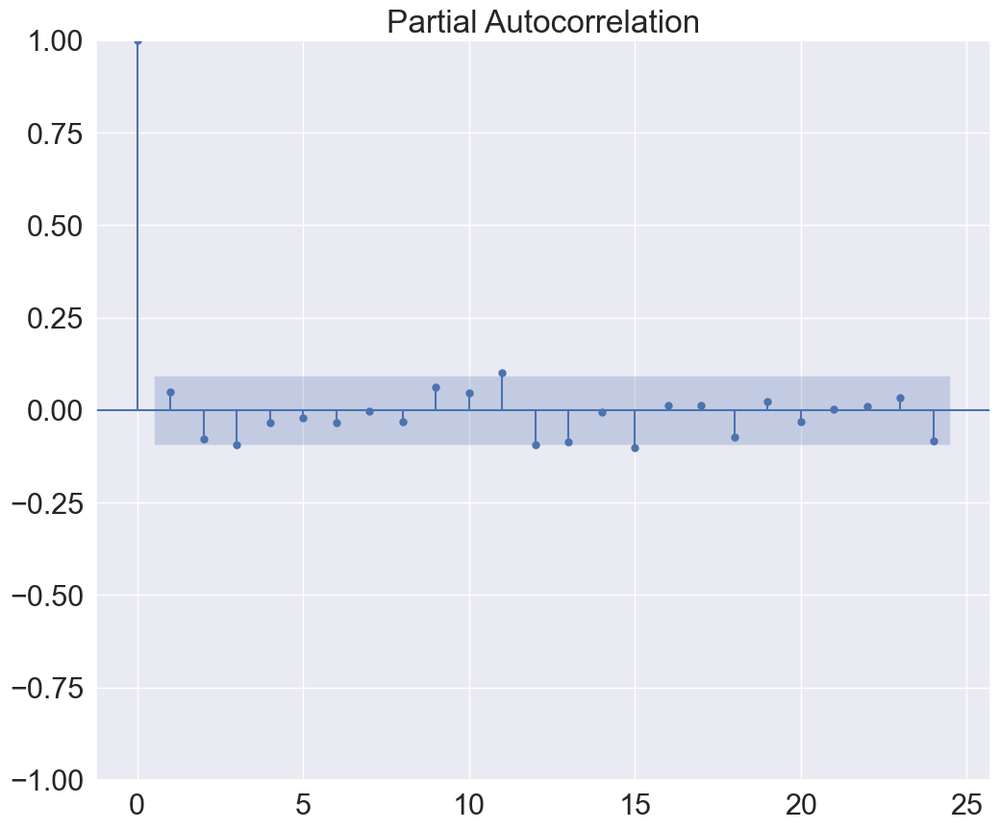

In [76]:
# Graficamos los residuos de este modelo

plot_acf(arima_1.resid,lags=24)
plt.show()

plot_pacf(arima_1.resid,lags=24,method='ywm')
plt.show()

Están bien pero algunos fuera de la banda azul -> podemos mejorarlo

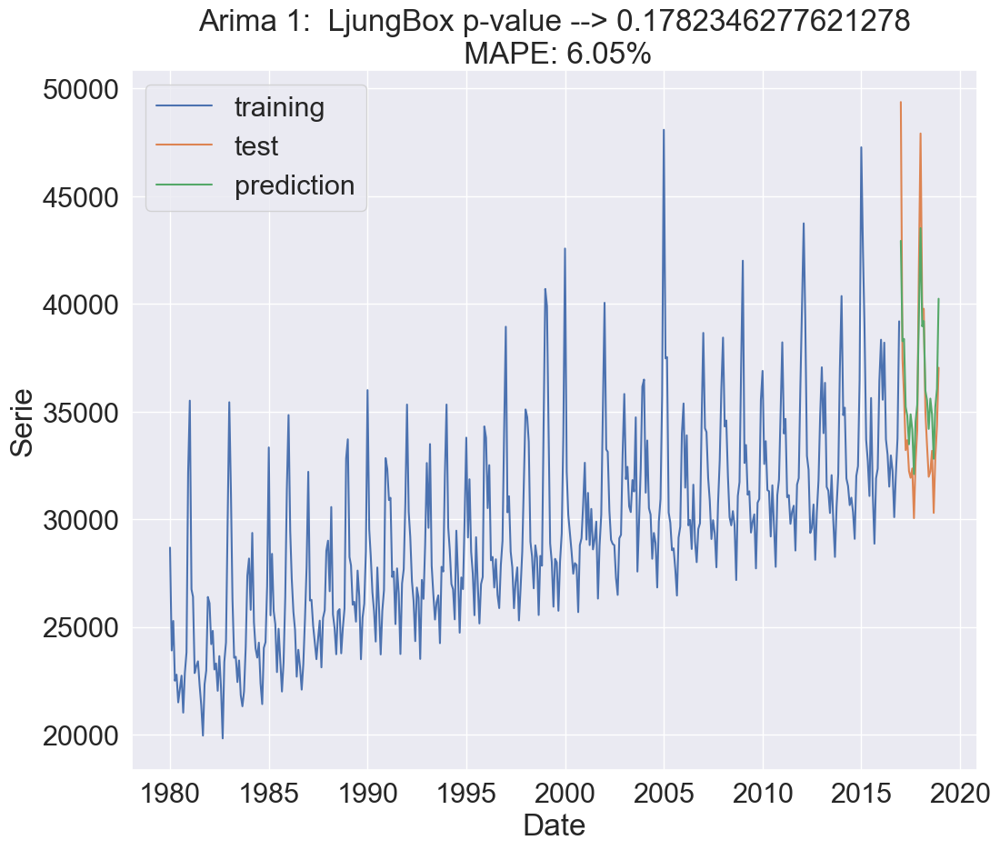

0.1782346277621278


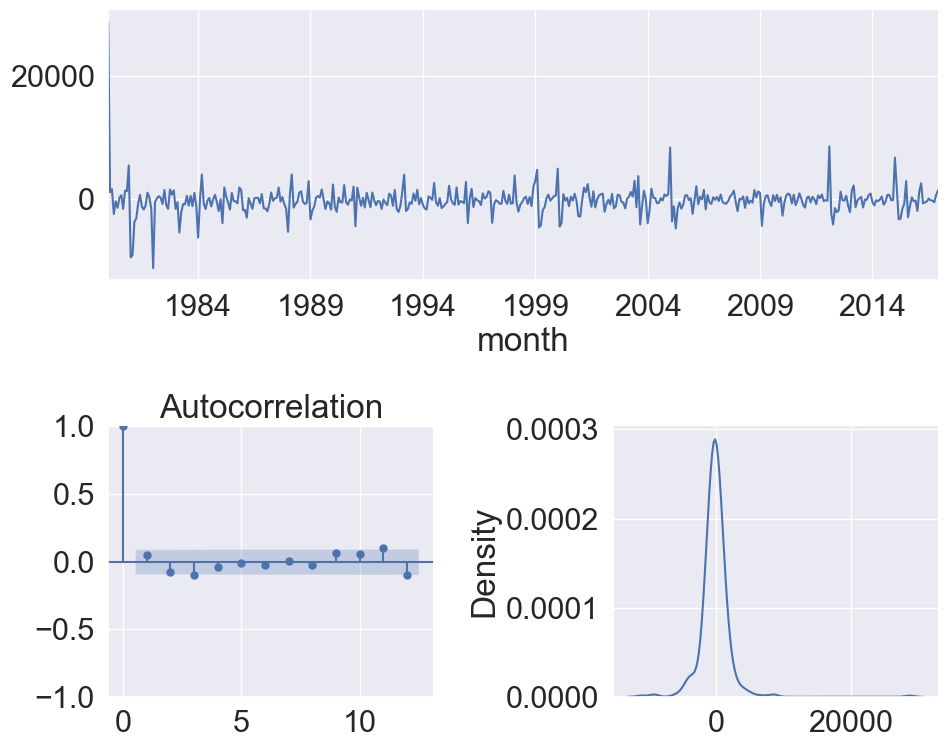

** Mean of the residuals:  -165.25

** Ljung Box Test, p-value: 0.178 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:xlabel='month'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [77]:
eval_model(arima_1,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Arima 1')

residcheck(arima_1.resid,12)

p-valor 0,17 -> residuos no muy buenos

MAPE: 6,05% (peor que los anteriores modelos multiplicativo y aditivo que estaban sobre un 4,5%), está prediciendo en media peor que los modelos suavizados, aunque los residuos sí que los está mejorando (de 0,0006 a 0,17)

#### Modelo 2 -> Con ambas partes AR

In [78]:
arima2 = SARIMAX(defunciones_tr['Todas las causas'], 
                order = (1, 1, 0), 
                seasonal_order =(1, 1, 0, 12))

arima_2 = arima2.fit()
arima_2.summary()

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Todas las causas   No. Observations:                  444
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood               -3920.529
Date:                            Thu, 29 Jun 2023   AIC                           7847.057
Time:                                    15:21:19   BIC                           7859.256
Sample:                                01-01-1980   HQIC                          7851.874
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1868      0.031     -5.963      0.000      -0.248      -0.125
ar.S.L12      -0.4737      0.016    -30.487      0.000      -0.504      -0.443
sigma2      4.528e+06   1.75e+05     25.846      0.000    4.18e+06    4.87e+06
===================================================================================
Ljung-Box (L1) (Q):                   2.55   Jarque-Bera (JB):               774.93
Prob(Q):                              0.11   Prob(JB):                         0.00
Heteroskedasticity (H):               1.03   Skew:                            -0.28
Prob(H) (two-sided):                  0.84   Kurtosis:                         9.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

P>|z| = 0 en todos los parámetros -> el modelo es significativo
Prob(Q) muy baja 

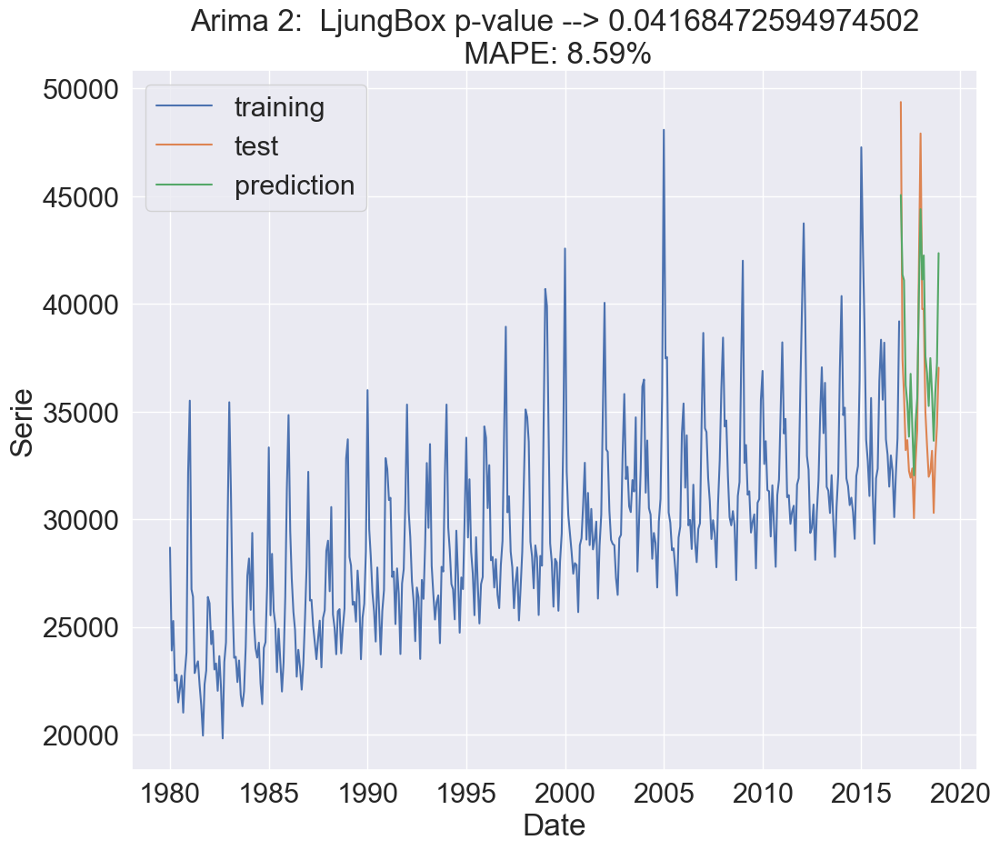

0.04168472594974502


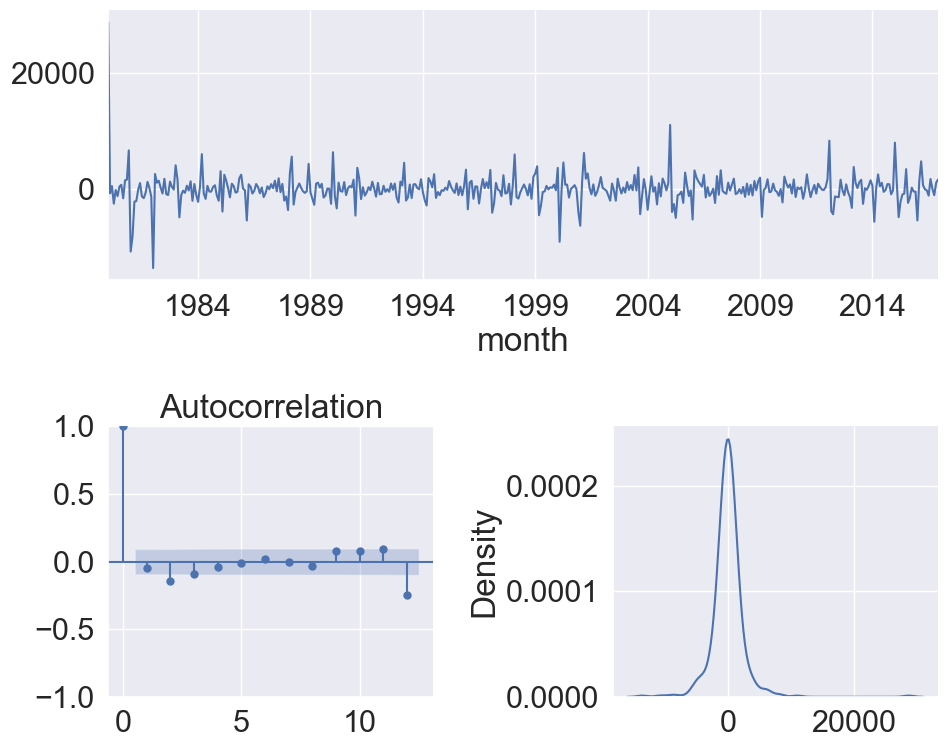

** Mean of the residuals:  5.25

** Ljung Box Test, p-value: 0.042 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:xlabel='month'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [79]:
eval_model(arima_2,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Arima 2')

residcheck(arima_2.resid,12)

Objetivamente es peor que el modelo anterior porque tiene un p-valor menor (antes era 0,17) y un MAPE que es mayor. 

Ljung Box Test, p-value: 0.042 (<0.05, residuos Correlated)

#### Modelo 3 -> Superposición de efectos ARMA en regular y estacional

In [80]:
arima3 = SARIMAX(defunciones_tr['Todas las causas'], 
                order = (1, 1, 1), 
                seasonal_order =(1, 1, 1, 12))

arima_3 = arima3.fit()
arima_3.summary()

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

C:\Users\tiqda\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   Todas las causas   No. Observations:                  444
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -3819.971
Date:                            Thu, 29 Jun 2023   AIC                           7649.942
Time:                                    15:21:26   BIC                           7670.272
Sample:                                01-01-1980   HQIC                          7657.969
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5515      0.050     11.122      0.000       0.454       0.649
ma.L1         -0.8815      0.044    -19.991      0.000      -0.968      -0.795
ar.S.L12      -0.0458      0.028     -1.643      0.100      -0.100       0.009
ma.S.L12      -0.9945      0.032    -30.911      0.000      -1.058      -0.931
sigma2      2.432e+06   1.29e-08   1.88e+14      0.000    2.43e+06    2.43e+06
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):              1009.33
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               0.80   Skew:                             0.44
Prob(H) (two-sided):                  0.19   Kurtosis:                        10.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.72e+29. Standard errors may be unstable.
"""

- En cuanto a significación paramétrica está mejor que antes, solo hay un parámetro con p-valor mayor a 0

- prob(Q) está bastante bien en 0,81

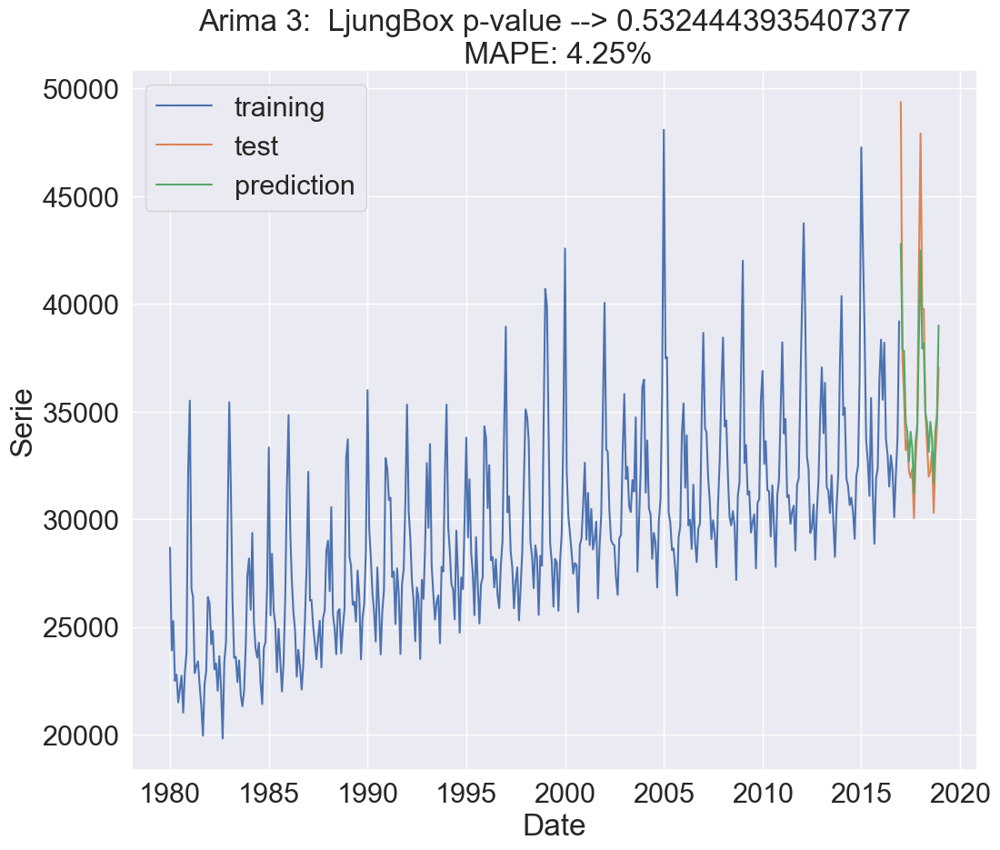

0.5324443935407377


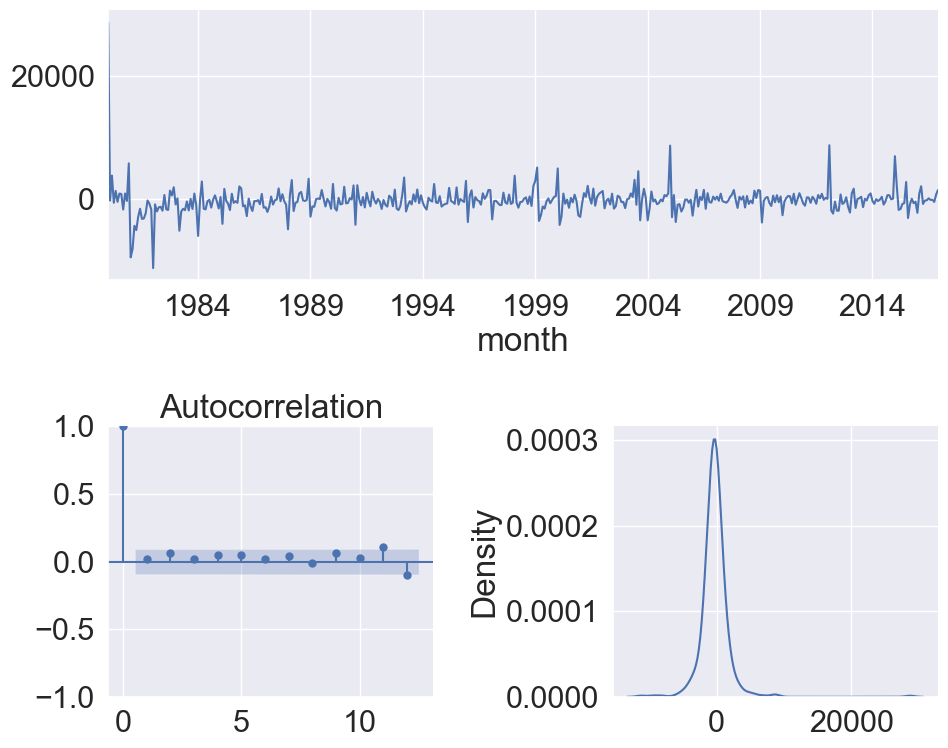

** Mean of the residuals:  -267.9

** Ljung Box Test, p-value: 0.532 (>0.05, Uncorrelated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:xlabel='month'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [81]:
eval_model(arima_3,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Arima 3')

residcheck(arima_3.resid,12)

- p-valor de Ljung-Box es el que mejor está de todos los modelos probados hasta ahora, con un 0,53 -> los resiudos no están correlacionados (>0,05)

- MAPE: 4,25%, el que mejor está de todos los modelos probados hasta ahora también, el menor había sido 4,53%

#### Modelo 4 -> ARIMA automático

Selección de modelos arima mediante AIC que implementa el paquete pmdarima. Se puede jugar bastante con órdenes máximos y mínimos para los efectos autoregresivos y de medias móviles, así como con las diferenciaciones regular y estacional.

In [82]:
import pmdarima as pm

# Ajustamos modelo arima step-wise con métrica AIC para la serie de vuelos
arima_auto = pm.auto_arima(defunciones_tr['Todas las causas'], start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      m=12,              # frequency of series
                      d=1,           # let model determine 'd'
                      seasonal=True,   # No Seasonality
                      #start_P=None, 
                      D=None, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

arima_auto.summary()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=2.60 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=8373.008, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=8149.313, Time=0.78 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=8261.459, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=8371.036, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=8369.624, Time=0.11 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=8065.490, Time=2.05 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=8040.883, Time=6.09 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=7947.600, Time=2.31 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=8243.748, Time=0.83 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=inf, Time=4.13 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=8189.990, Time=2.10 sec
 ARIMA(1,1,0)(2,0,2)[12] intercept   : AIC=inf, Time=7.07 sec
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.94 sec
 ARIMA(2,1,0)(1,0,1)[12] intercept   : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  444
Model:             SARIMAX(1, 1, 0)x(1, 0, [1], 12)   Log Likelihood               -3968.800
Date:                              Thu, 29 Jun 2023   AIC                           7947.600
Time:                                      15:22:06   BIC                           7968.068
Sample:                                  01-01-1980   HQIC                          7955.673
                                       - 12-01-2016                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      6.5722      9.582      0.686      0.493     -12.209      25.353
ar.L1         -0.1116      0.028     -4.007      0.000      -0.166      -0.057
ar.S.L12       0.9694      0.008    119.494      0.000       0.953       0.985
ma.S.L12      -0.8218      0.027    -30.572      0.000      -0.874      -0.769
sigma2      3.401e+06    4.3e-05   7.91e+10      0.000     3.4e+06     3.4e+06
===================================================================================
Ljung-Box (L1) (Q):                   5.86   Jarque-Bera (JB):               463.40
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                             0.40
Prob(H) (two-sided):                  0.84   Kurtosis:                         7.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 6.09e+27. Standard errors may be unstable.
"""

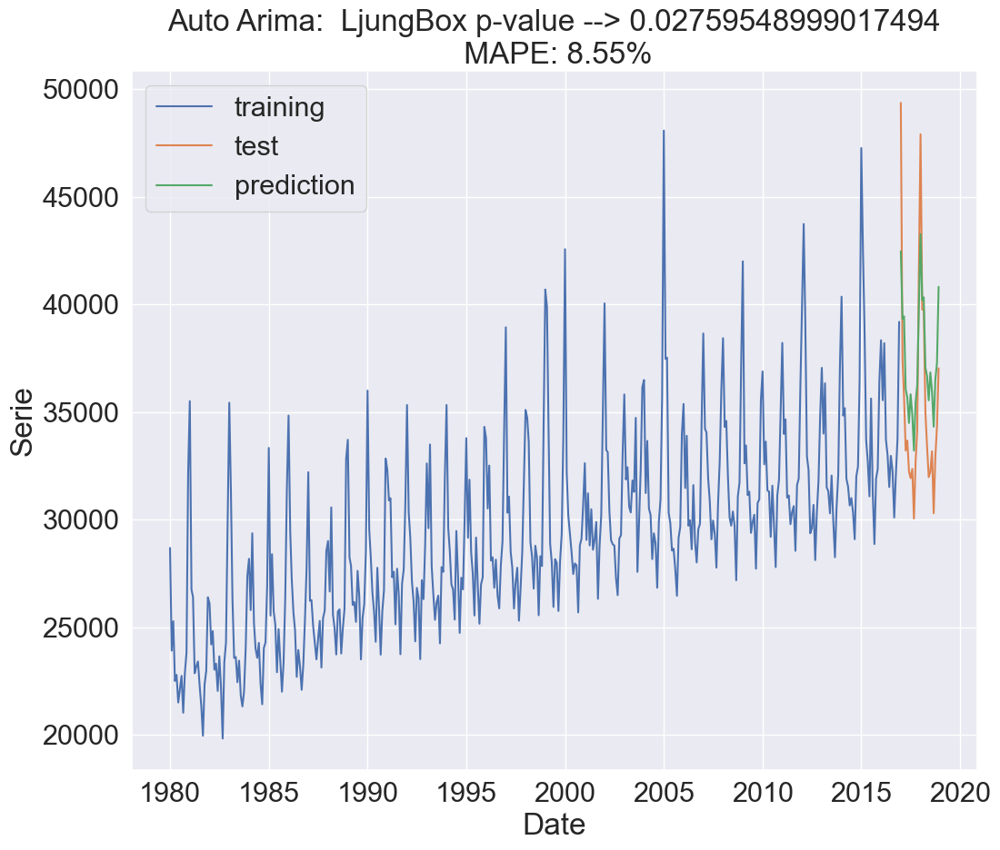

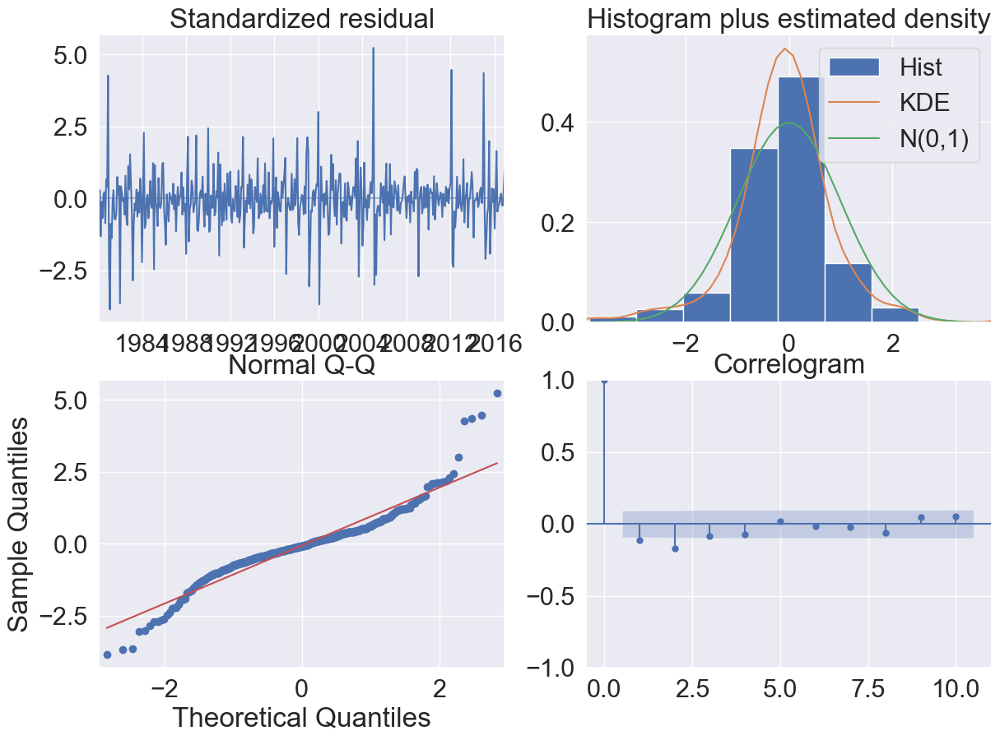

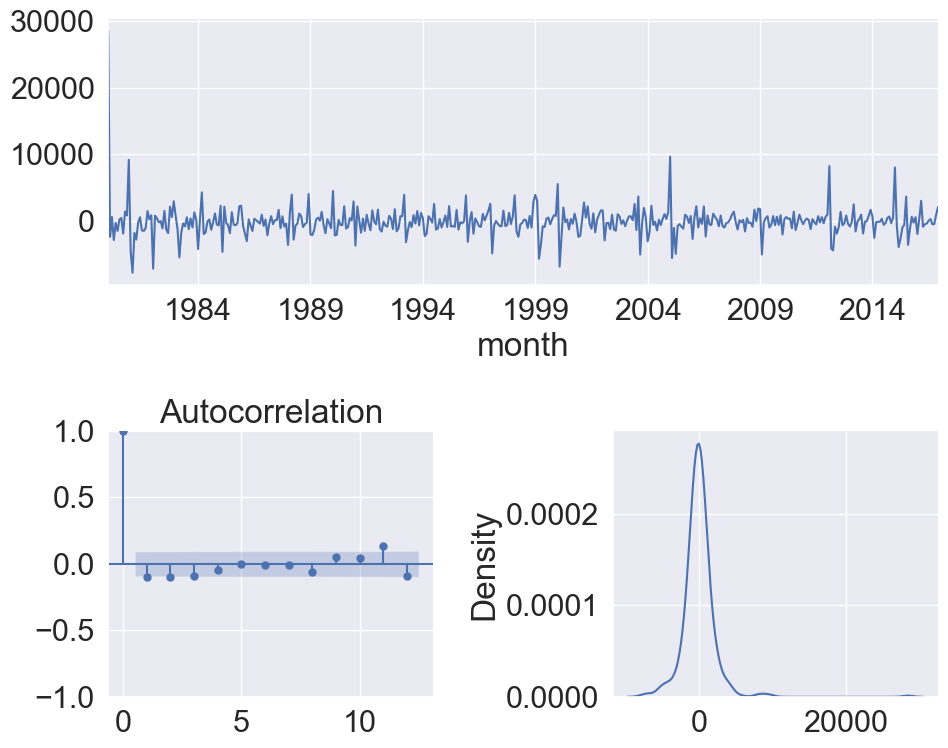

** Mean of the residuals:  -54.41

** Ljung Box Test, p-value: 0.028 (<0.05, Correlated)

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal)

** AD Fuller, p_value: 0.0 (<0.05, Stationary)


(<AxesSubplot:xlabel='month'>,
 <AxesSubplot:title={'center':'Autocorrelation'}>,
 <AxesSubplot:ylabel='Density'>)

In [83]:
eval_model_Aarima(arima_auto,defunciones_tr['Todas las causas'],defunciones_tst['Todas las causas'],'Auto Arima')

residcheck(arima_auto.resid(),12)

**ESTE MODELO NO LO PODEMOS ESCOGER:**

** Mean of the residuals:  -54.41   **(no es ni cercana a 0)**

** Ljung Box Test, p-value: 0.028 (<0.05, Correlated)  **RESIDUOS CORRELACIONADOS**

MAPE: 8,55% -> mayor error que el modelo anterior

** Jarque Bera Normality Test, p_value: 0.0 (<0.05, Not-normal) ESTO CASI NUNCA SE CONSIGUE QUE SEAN NORMALES ASIQUE NADA

** AD Fuller, p_value: 0.0 (<0.05, Stationary) **ESTACIONARIA OKEY**



### 7. Conclusiones 

Por todo lo dicho anteriormente, el **modelo ARIMA 3 (arima_3)** es el más preciso y adecuado de escoger:

- MAPE menor de todos)
- Test de Ljung-box mayor que todos (0,5324)
- Prob(Q):	0.81
- Solo 1 parámetro no significativo con un p-vaor de 0,1

# EJERCICIO 3

Con los datos de wisconsin.xlsx:

1. Leer el archivo
2. Obtener la matriz de correlaciones entre las variables numéricas. Conclusiones.
3. Sabiendo que se trata de predecir la variable binaria diagnosis (‘M,’B’). ¿Cuál sería el modelo adecuado de predicción? ¿Qué problemas auguras a la luz de la información sobre las correlaciones del archivo?
4. Como posible estrategia se plantea la realización de un ACP para la reducción de dimensiones y un modelo de predicción adecuado utilizando como predictores las componentes principales resultantes de tal forma que se  retenga al menos el 70% de la variabilidad del archivo. 
    a. Valora la adecuación muestral a priori
    b. Realiza el ACP sobre las numéricas. ¿Cuántas componentes se deberían considerar para cumplir el criterio mencionado. Interpreta la componente 1.
    c. Crea el input con estas componentes (matriz de scores o puntuaciones) y ajusta un modelo de predicción adecuado para la variable objetivo diagnosis.
    d. Conclusiones del modelo por validación cruzada repetida. Interpreta el parámetro de la componente 1. 


In [85]:
 #!pip install factor_analyzer

     ---------------------------------------- 41.8/41.8 kB ? eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
     -------------------------------------- 202.8/202.8 kB 2.5 MB/s eta 0:00:00
     ---------------------------------------- 98.8/98.8 kB 2.9 MB/s eta 0:00:00
     ---------------------------------------- 3.3/3.3 MB 3.6 MB/s eta 0:00:00
     -------------------------------------- 468.5/468.5 kB 2.0 MB/s eta 0:00:00
  Created wheel for factor_analyzer: filename=factor_analyzer-0.4.1-py2.py3-none-any.whl size=42071 sha256=747f946fad0e0680c2935d8770f4bc448108333af64b30a6d733a7a255f92606
  Stored in directory: c:\users\tiqda\appdata\local\pip\cache\wheels\6d\32\bd\460a71becd83f7d77152f437c2fd4

In [86]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

#PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA

#Factor Analysis
from sklearn.decomposition import FactorAnalysis
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo

#Encoding
from sklearn.preprocessing import LabelEncoder

### 1. Lectura de datos

In [88]:
wis = pd.read_excel('wisconsin.xlsx')
wis.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [89]:
wis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [90]:
wis.nunique()

id                         569
diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: i

In [91]:
wis.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [92]:
# Eliminamos el indice y la variable objetivo

wis1 = wis.drop(["id"], axis=1)
wis1.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [93]:
wis2 = wis1.drop(["diagnosis"], axis=1)
wis2.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### 2. Matriz de correlaciones entre las variables

In [94]:
corr = wis2.corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000,0.324,0.998,0.987,0.171,0.506,0.677,0.823,0.148,-0.312,0.679,-0.097,0.674,0.736,-0.223,0.206,0.194,0.376,-0.104,-0.043,0.970,0.297,0.965,0.941,0.120,0.413,0.527,0.744,0.164,0.007
texture_mean,0.324,1.000,0.330,0.321,-0.023,0.237,0.302,0.293,0.071,-0.076,0.276,0.386,0.282,0.260,0.007,0.192,0.143,0.164,0.009,0.054,0.353,0.912,0.358,0.344,0.078,0.278,0.301,0.295,0.105,0.119
perimeter_mean,0.998,0.330,1.000,0.987,0.207,0.557,0.716,0.851,0.183,-0.261,0.692,-0.087,0.693,0.745,-0.203,0.251,0.228,0.407,-0.082,-0.006,0.969,0.303,0.970,0.942,0.151,0.456,0.564,0.771,0.189,0.051
area_mean,0.987,0.321,0.987,1.000,0.177,0.499,0.686,0.823,0.151,-0.283,0.733,-0.066,0.727,0.800,-0.167,0.213,0.208,0.372,-0.072,-0.020,0.963,0.287,0.959,0.959,0.124,0.390,0.513,0.722,0.144,0.004
smoothness_mean,0.171,-0.023,0.207,0.177,1.000,0.659,0.522,0.554,0.558,0.585,0.301,0.068,0.296,0.247,0.332,0.319,0.248,0.381,0.201,0.284,0.213,0.036,0.239,0.207,0.805,0.472,0.435,0.503,0.394,0.499
compactness_mean,0.506,0.237,0.557,0.499,0.659,1.000,0.883,0.831,0.603,0.565,0.497,0.046,0.549,0.456,0.135,0.739,0.571,0.642,0.230,0.507,0.535,0.248,0.590,0.510,0.566,0.866,0.816,0.816,0.510,0.687
concavity_mean,0.677,0.302,0.716,0.686,0.522,0.883,1.000,0.921,0.501,0.337,0.632,0.076,0.660,0.617,0.099,0.670,0.691,0.683,0.178,0.449,0.688,0.300,0.730,0.676,0.449,0.755,0.884,0.861,0.409,0.515
concave points_mean,0.823,0.293,0.851,0.823,0.554,0.831,0.921,1.000,0.462,0.167,0.698,0.021,0.711,0.690,0.028,0.490,0.439,0.616,0.095,0.258,0.830,0.293,0.856,0.810,0.453,0.667,0.752,0.910,0.376,0.369
symmetry_mean,0.148,0.071,0.183,0.151,0.558,0.603,0.501,0.462,1.000,0.480,0.303,0.128,0.314,0.224,0.187,0.422,0.343,0.393,0.449,0.332,0.186,0.091,0.219,0.177,0.427,0.473,0.434,0.430,0.700,0.438
fractal_dimension_mean,-0.312,-0.076,-0.261,-0.283,0.585,0.565,0.337,0.167,0.480,1.000,0.000,0.164,0.040,-0.090,0.402,0.560,0.447,0.341,0.345,0.688,-0.254,-0.051,-0.205,-0.232,0.505,0.459,0.346,0.175,0.334,0.767


### 3. Test de esferidad de Bartlett

Compara la matriz de correlaciones con una matriz identidad para extraer un p-valor. La hipótesis nula del contraste es 

H0: Matriz de correlaciones = Matriz identidad, por lo que nos interesa rechazarla! Recordemos que una matriz identidad tiene componentes absolutamente ortogonales, osea 0 correlación o varianza compartida.

In [99]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
calculate_bartlett_sphericity(wis2)

(39362.120841135045, 0.0)

El valor del estadístico de prueba (en este caso, 39362.120841135045) nos indica  que hay una gran relacion lineal entre las variables.

En este caso, nuestro valor p de (0.0) indica que la probabilidad de obtener un estadístico de prueba tan extremo como el observado es prácticamente nula. Podemos rechazar la hipótesis nula de que las variables del conjunto de datos son no correlacionadas y concluir que existe una relación lineal significativa entre las variables.

Podemos concluir que los datos wis2 tienen una estructura factorial significativa y son adecuados para un análisis factorial.

### 4. KMO-MSA global y por variable.

In [100]:
from factor_analyzer.factor_analyzer import calculate_kmo
calculate_kmo(wis2)

(array([0.83463512, 0.64352613, 0.85334054, 0.86403253, 0.814716  ,
        0.87939755, 0.89192843, 0.90027723, 0.82510264, 0.83181381,
        0.83412178, 0.48458942, 0.84290718, 0.85199881, 0.64427854,
        0.8712978 , 0.82547994, 0.83516673, 0.5832182 , 0.81149623,
        0.82308704, 0.60329755, 0.88493799, 0.82044529, 0.75316064,
        0.85127714, 0.90222587, 0.89105242, 0.69074764, 0.81233969]),
 0.8322253094651043)

Al darnos en el KMO un 0.832 significa que los datos son más adecuados para el análisis factorial. Si quisieramos mejorarlo, solo habría que seleccionar las variables que tienen menos que la media que nos sale, P.E 0.48458942 o 0.5832182.

### ¿Sabiendo que se trata de predecir la variable binaria diagnosis (‘M,’B’). ¿Cuál sería el modelo adecuado de predicción? ¿Qué problemas auguras a la luz de la información sobre las correlaciones del archivo?

Al ser una variable binaria se tendrá que utilizar la regresión logística. El mayor problema que veo es que en nuestra matriz de correlacion tenemos muchos datos y a priori son significativos por lo que no vamos a poder descartar ninguno.

### Como posible estrategia se plantea la realización de un ACP para la reducción de dimensiones y un modelo de predicción adecuado utilizando como predictores las componentes principales resultantes de tal forma que se retenga al menos el 70% de la variabilidad del archivo

## Valoración de la adecuación muestral a priori

### 5. Escalado de datos

Unidades de medida distintas implican necesidad de escalar los datos para que las variables con mayor escala de medida no “pesen” más de lo que deben en la solución.

In [105]:
scaler = StandardScaler()
scaler.fit(wis2)

X = scaler.transform(wis2)

pd.DataFrame(X, columns = wis2.columns)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,2.489734,-0.565265,2.833031,2.487578,-0.214002,1.316862,0.724026,0.660820,1.148757,0.907083,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,0.499255,-0.876244,0.263327,0.742402,-0.605351,-0.692926,-0.440780,0.260162,-0.805450,-0.099444,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,1.228676,-0.780083,0.850928,1.181336,-0.297005,0.814974,0.213076,1.424827,0.237036,0.293559,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,0.326373,-0.110409,0.286593,-0.288378,0.689702,2.744280,0.819518,1.115007,4.732680,2.047511,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,1.270543,-0.790244,1.273189,1.190357,1.483067,-0.048520,0.828471,1.144205,-0.361092,0.499328,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100
5,-0.476375,-0.835335,-0.387148,-0.505650,2.237421,1.244335,0.866302,0.824656,1.005402,1.890005,-0.255070,-0.592662,-0.321304,-0.289258,0.156347,0.445544,0.160025,-0.069124,0.134119,0.486846,-0.165498,-0.313836,-0.115009,-0.244320,2.048513,1.721616,1.263243,0.905888,1.754069,2.241802
6,1.170908,0.160649,1.138125,1.095295,-0.123136,0.088295,0.300072,0.646935,-0.064325,-0.762332,0.149883,-0.804940,0.155410,0.298627,-0.909030,-0.651568,-0.310141,-0.228089,-0.829666,-0.611218,1.368983,0.322883,1.368325,1.275220,0.518640,0.021215,0.509552,1.196716,0.262476,-0.014730
7,-0.118517,0.358450,-0.072867,-0.218965,1.604049,1.140102,0.061026,0.281950,1.403355,1.660353,0.643623,0.290561,0.490051,0.233722,0.588031,0.268933,-0.232554,0.435349,-0.688004,0.611669,0.163763,0.401048,0.099449,0.028859,1.447961,0.724786,-0.021054,0.624196,0.477640,1.726435
8,-0.320167,0.588830,-0.184080,-0.384207,2.201839,1.684010,1.219096,1.150692,1.965600,1.572462,-0.356850,-0.389818,-0.227743,-0.352403,-0.436677,0.533290,0.120568,0.075243,0.107482,-0.017363,-0.161357,0.822813,-0.031609,-0.248363,1.662757,1.818310,1.280035,1.391616,2.389857,1.288650
9,-0.473535,1.105439,-0.329482,-0.509063,1.582699,2.563358,1.738872,0.941760,0.797298,2.783096,-0.388250,0.693345,-0.409420,-0.360764,0.036008,2.609587,1.509848,0.409395,-0.321136,2.377346,-0.244190,2.443109,-0.286278,-0.297409,2.320295,5.112877,3.995433,1.620015,2.370444,6.846856


### 6. Análisis de Componentes Principales (PCA)

Para obtener la descomposición en valores singulares y el resultado de componentes para los datos.

In [106]:
pca1 = PCA() 
scores1 = pca1.fit_transform(X)
pd.DataFrame(scores1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411424,2.159370,-0.398407,-0.157118,-0.877402,0.262955,-0.859014,0.103388,-0.690804,-0.601793,0.745116,-0.265471,-0.549563,-0.133768,0.345565,0.096515,0.068850,0.084519,-0.175256,-0.151020,-0.201503,-0.252585,-0.033914,0.045648,-0.047169
1,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028656,0.013358,0.240988,-0.711905,1.106995,0.813120,0.157923,-0.943529,-0.653475,0.008975,-0.648809,-0.017212,0.318297,0.247565,-0.114133,-0.077327,-0.094578,-0.217718,0.011290,-0.170510,-0.041129,0.181270,0.032624,-0.005687,-0.001868
2,5.733896,-1.075174,-0.551748,0.912083,-0.177086,0.541452,-0.668166,0.097374,0.024066,0.454275,-0.605604,0.124387,-0.410627,0.016680,0.483420,0.325111,0.190918,-0.087975,0.392626,-0.204532,0.311067,-0.060309,-0.074291,0.102762,0.171158,0.004735,0.049569,0.047026,0.003146,0.000751
3,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429911,1.059565,-1.405440,-1.116975,-1.151514,1.011316,-0.933271,-0.487417,-0.168848,0.051370,0.482634,-0.035875,0.026748,-0.464734,0.434193,-0.203266,-0.124105,0.153430,0.077496,-0.275225,0.183462,0.042484,-0.069295,-0.019937
4,3.935302,-1.948072,1.389767,2.940639,0.546747,-1.226495,-0.936213,0.636376,-0.263805,0.377704,0.651360,-0.110515,0.387948,-0.539181,0.310319,-0.152606,0.133142,-0.018714,-0.461436,0.065495,-0.116545,-0.017650,0.139454,-0.005332,0.003062,0.039254,0.032168,-0.034786,0.005038,0.021214
5,2.380247,3.949929,-2.934877,0.941037,-1.056042,-0.451039,0.490445,-0.165444,-0.133473,-0.530431,0.109766,0.081441,-0.026274,0.003137,0.178605,-0.012717,0.196886,-0.297539,0.129841,-0.071237,-0.002402,-0.101169,0.033478,0.002840,0.122390,-0.030299,-0.084455,0.000730,-0.019721,0.003459
6,2.238883,-2.690031,-1.639913,0.149340,0.040360,-0.128948,-0.301567,0.083698,-0.080025,0.219143,0.393690,0.242189,-0.352252,-0.221797,-0.060909,-0.027968,-0.320365,0.123125,-0.003527,-0.044489,-0.049748,0.091046,-0.142980,-0.080184,-0.277661,-0.026748,0.020763,-0.046774,-0.012980,0.005473
7,2.143299,2.340244,-0.871947,-0.127043,-1.427437,-1.257039,0.974100,-0.653338,0.248184,1.000586,-0.196487,-0.278036,-0.461036,-0.096220,-0.187643,-0.336806,0.161564,-0.049133,-0.219876,-0.010642,0.044655,-0.131358,-0.240479,0.096334,-0.195483,-0.059466,0.066680,0.026176,-0.002862,0.001698
8,3.174924,3.391813,-3.119986,-0.601297,-1.522290,0.559545,-0.215104,-0.687341,0.511924,0.029187,-0.560514,0.078886,0.493436,0.112152,0.034267,0.507504,0.285727,-0.287330,0.182431,-0.019786,0.095700,0.196322,-0.058725,-0.088554,0.130342,-0.055048,0.038324,0.037160,0.011709,0.005281
9,6.351747,7.727174,-4.341916,-3.375202,1.710263,-0.723909,2.519840,0.365149,-0.717397,-1.165631,0.549038,-1.085117,-0.375806,-0.000604,1.207202,-1.132822,0.759136,-0.238949,0.127681,0.178081,-0.256677,-0.716717,0.167328,0.216032,0.134778,0.311094,-0.002852,0.135732,0.037788,0.003827


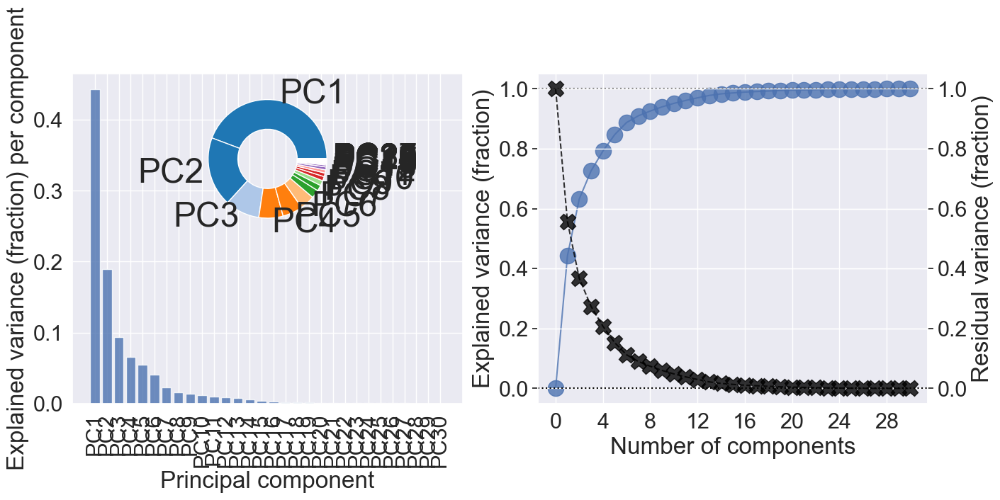

In [112]:
#!pip install psynlig

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from psynlig import (
    pca_explained_variance,
    pca_residual_variance,
    pca_explained_variance_bar,
    pca_explained_variance_pie,
    pca_1d_loadings,
    pca_2d_loadings,
    pca_2d_scores
)

fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, figsize=(14, 6), constrained_layout=True
)
pca_explained_variance_bar(pca1, axi=ax1, alpha=0.8)
pca_explained_variance(pca1, axi=ax2, marker='o', markersize=16, alpha=0.8)

ax4 = ax2.twinx()
pca_residual_variance(
    pca1,
    ax4,
    marker='X',
    markersize=16,
    alpha=0.8,
    color='black',
    linestyle='--'
)

ax3 = inset_axes(ax1, width='45%', height='45%', loc=9)
pca_explained_variance_pie(pca1, axi=ax3, cmap='tab20')
plt.show()

Vemos que hay demasiadas variables que algunos explican muy bajo porcentaje, por lo que procedemos a coger únicamente el 70% de los componentes para analizarlos

## Realiza el ACP sobre las numéricas. ¿Cuántas componentes se deberían considerar para cumplir el criterio mencionado? Interpreta la componente 1.

In [114]:
pca = PCA(n_components=0.7) # tomamos las varibles que nos expliquen el 70% del modelo
scores = pca.fit_transform(X)
pd.DataFrame(scores)

,0,1,2
0,9.192837,1.948583,-1.123166
1,2.387802,-3.768172,-0.529293
2,5.733896,-1.075174,-0.551748
3,7.122953,10.275589,-3.232790
4,3.935302,-1.948072,1.389767
5,2.380247,3.949929,-2.934877
6,2.238883,-2.690031,-1.639913
7,2.143299,2.340244,-0.871947
8,3.174924,3.391813,-3.119986
9,6.351747,7.727174,-4.341916


Usando el PCA, podemos llegar a la conclusión de que con 3 variables ya explican el 70% de la variabilidad de nuestro archivo.

In [115]:
nuevodata = pd.DataFrame(scores, columns = ['PC1','PC2','PC3'])
nuevodata

,PC1,PC2,PC3
0,9.192837,1.948583,-1.123166
1,2.387802,-3.768172,-0.529293
2,5.733896,-1.075174,-0.551748
3,7.122953,10.275589,-3.232790
4,3.935302,-1.948072,1.389767
5,2.380247,3.949929,-2.934877
6,2.238883,-2.690031,-1.639913
7,2.143299,2.340244,-0.871947
8,3.174924,3.391813,-3.119986
9,6.351747,7.727174,-4.341916


(<Figure size 1040x715 with 1 Axes>,
 <AxesSubplot:xlabel='Principal component', ylabel='Eigenvalue'>)

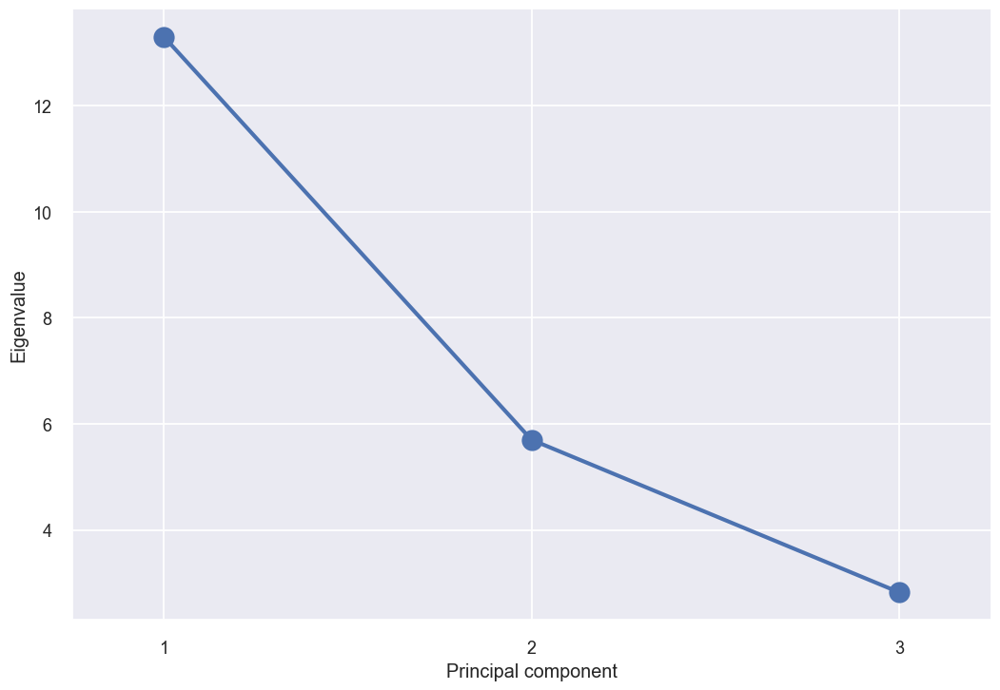

In [116]:
from psynlig import pca_scree
plt.style.use('seaborn-talk')

pca_scree(pca, marker='o', markersize=16, lw=3)

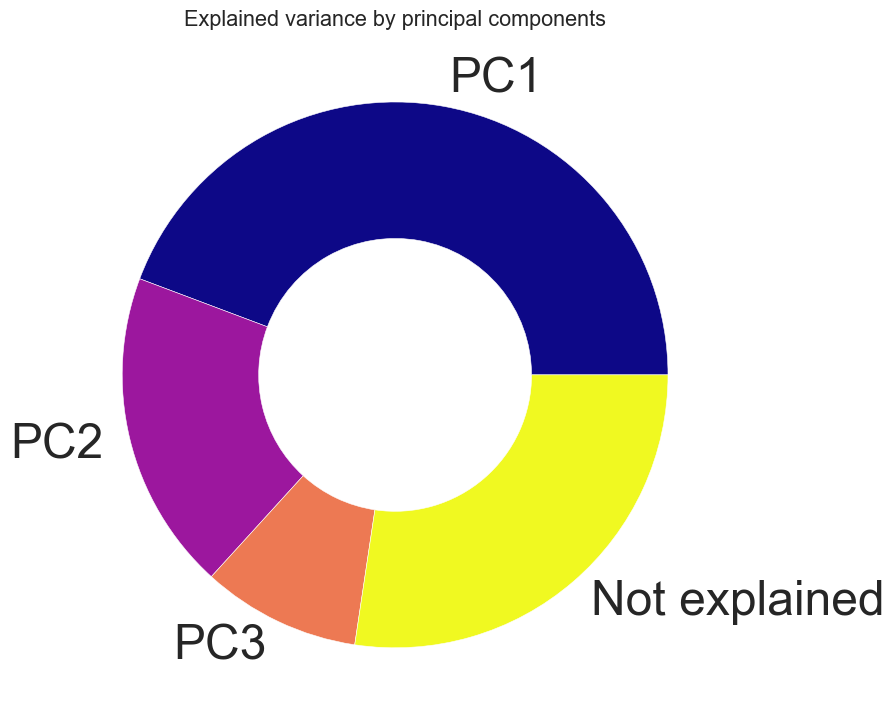

In [117]:
from psynlig import pca_explained_variance_pie
plt.style.use('seaborn-talk')

fig, axi = pca_explained_variance_pie(pca, cmap='plasma')
axi.set_title('Explained variance by principal components')

plt.show()

Como estamos cogiendo únicamente 3 variables que nos explican más del 70% de ahí que tengamos una parte no explicada que es donde se encuentran los otros 28 variables que faltan. También podemos ver cómo la primera variable es la que más explica.

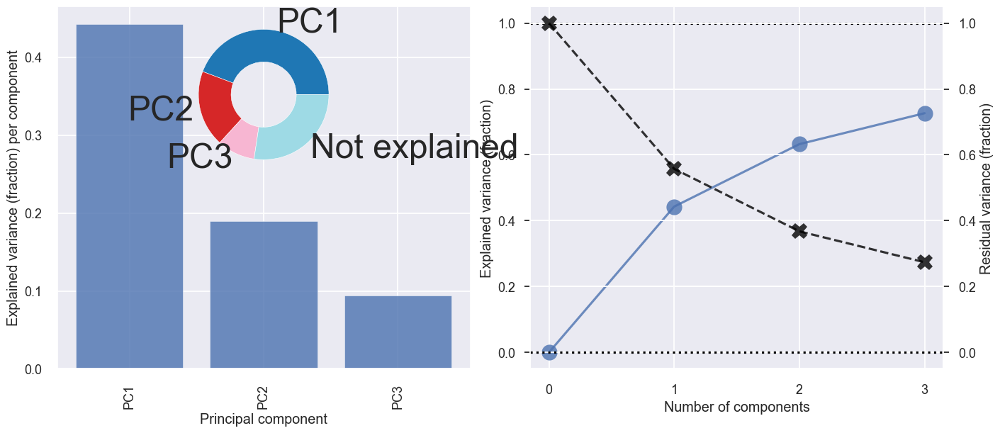

In [118]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from psynlig import (
    pca_explained_variance,
    pca_residual_variance,
    pca_explained_variance_bar,
    pca_explained_variance_pie,
    pca_1d_loadings,
    pca_2d_loadings,
    pca_2d_scores
)

fig, (ax1, ax2) = plt.subplots(
    nrows=1, ncols=2, figsize=(14, 6), constrained_layout=True
)
pca_explained_variance_bar(pca, axi=ax1, alpha=0.8)
pca_explained_variance(pca, axi=ax2, marker='o', markersize=16, alpha=0.8)

ax4 = ax2.twinx()
pca_residual_variance(
    pca,
    ax4,
    marker='X',
    markersize=16,
    alpha=0.8,
    color='black',
    linestyle='--'
)

ax3 = inset_axes(ax1, width='45%', height='45%', loc=9)
pca_explained_variance_pie(pca, axi=ax3, cmap='tab20')
plt.show()

([<Figure size 1040x715 with 1 Axes>],
 [<AxesSubplot:title={'center':'Loading coefficients for PC1'}, xlabel='Variables', ylabel='Coefficient'>])

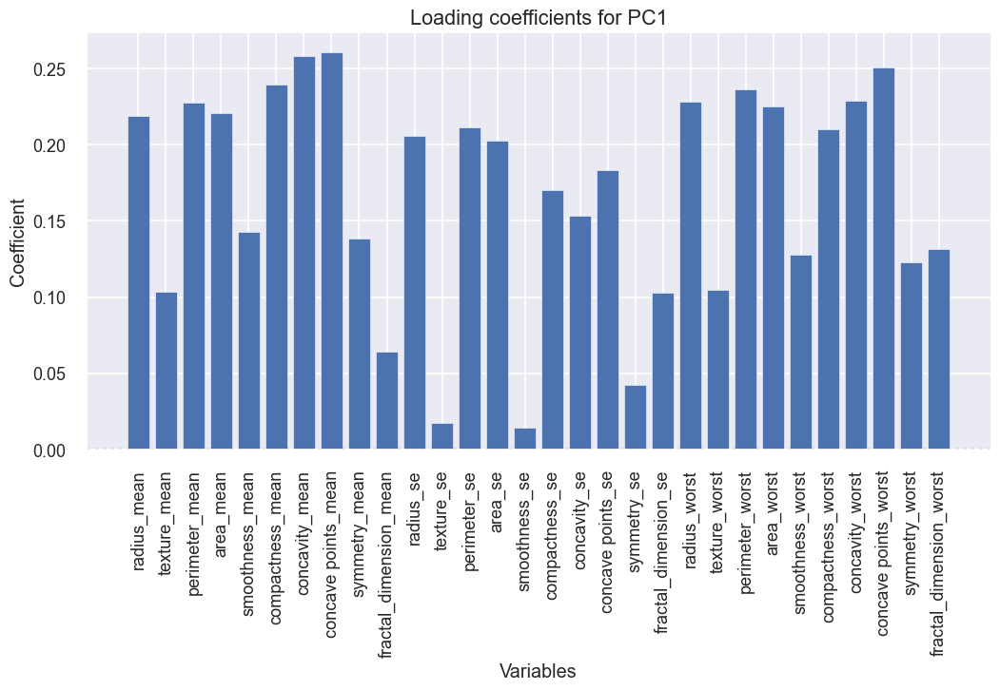

In [119]:
pca_1d_loadings(
        pca,
        wis2.columns,
        select_components={1},
        plot_type='bar',
    )

Componente 1: Las variables que no se explican correctamente como son texture_se, smoothness_se y symmetry_se los podemos revisar como afectan en las otras componentes, por el momento se explican bastante bien las demás y vemos que todas ellas están en sentido positivo

([<Figure size 1040x715 with 1 Axes>],
 [<AxesSubplot:title={'center':'Loading coefficients for PC2'}, xlabel='Variables', ylabel='Coefficient'>])

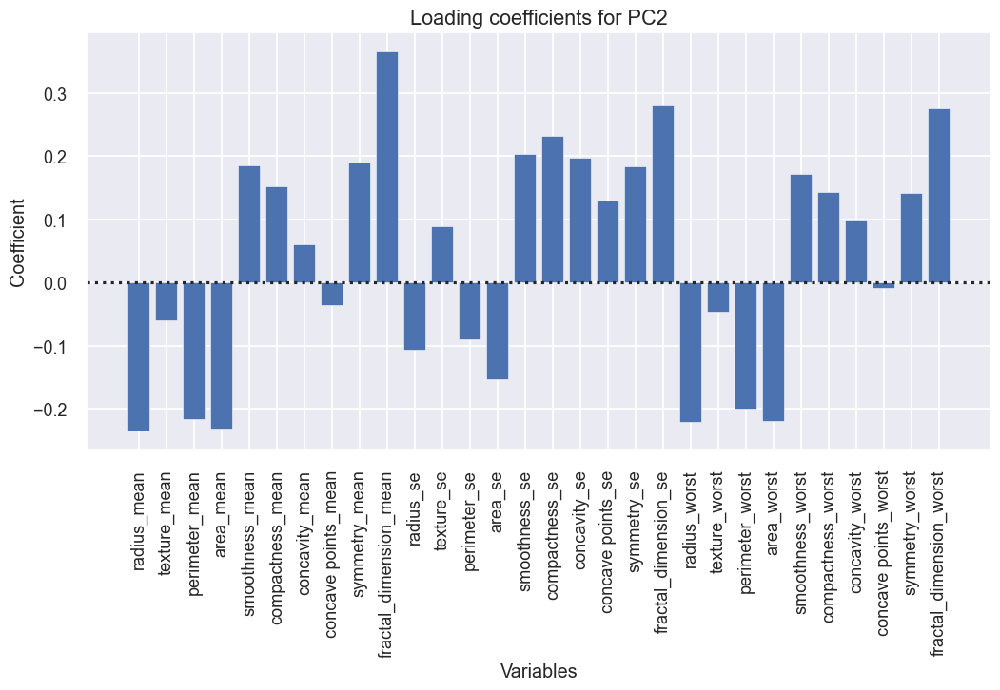

In [120]:
pca_1d_loadings(
        pca,
        wis2.columns,
        select_components={2},
        plot_type='bar',
    )

En la componente 2 podemos que smoothness_se y el fractal_dimension_mean se explica mejor que en la componente 1

([<Figure size 1040x715 with 1 Axes>],
 [<AxesSubplot:title={'center':'Loading coefficients for PC3'}, xlabel='Variables', ylabel='Coefficient'>])

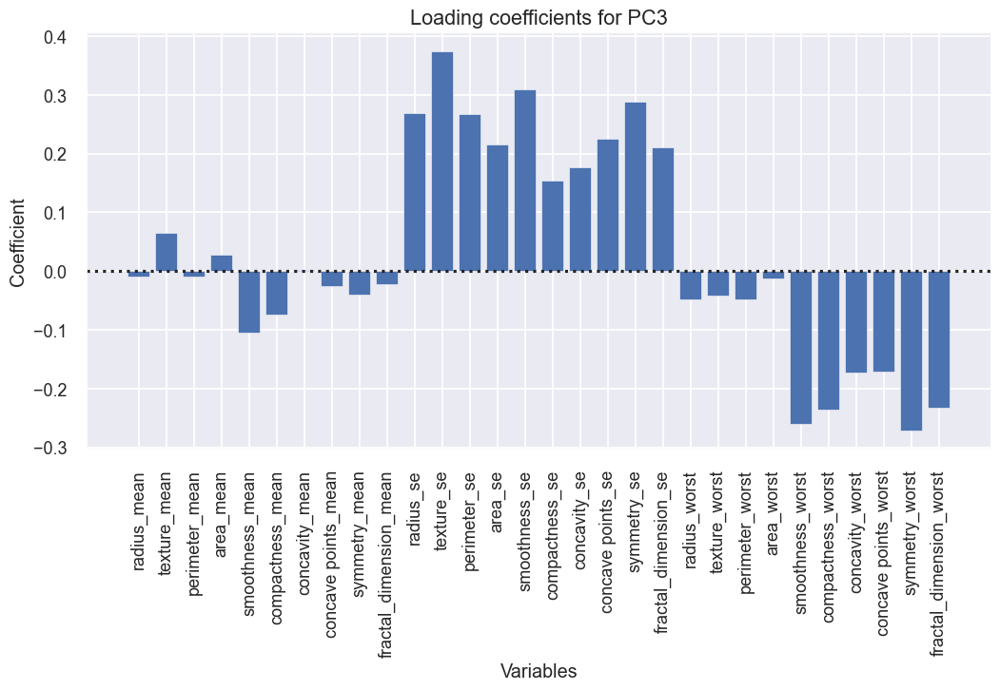

In [121]:
pca_1d_loadings(
        pca,
        wis2.columns,
        select_components={3},
        plot_type='bar',
    )

En la componente 3 podemos que texture_se y symmetry_se se explica mejor que en la componente 1, y podemos ver como muchos de los componentes que nos parecen positivo en la componente uno, aquí nos aparecen en sentido negativo

In [122]:
import plotly.express as px
fig = px.scatter(scores, x=0, y=1, text=wis2.index)
fig.show()

Nos indica la posicion de las observaciones en el plano de los puntos (registros vs componentes), pero al tener tantos, no vemos prácticamente nada. Lo que podemos observar son algunos outliers que están por fuera.

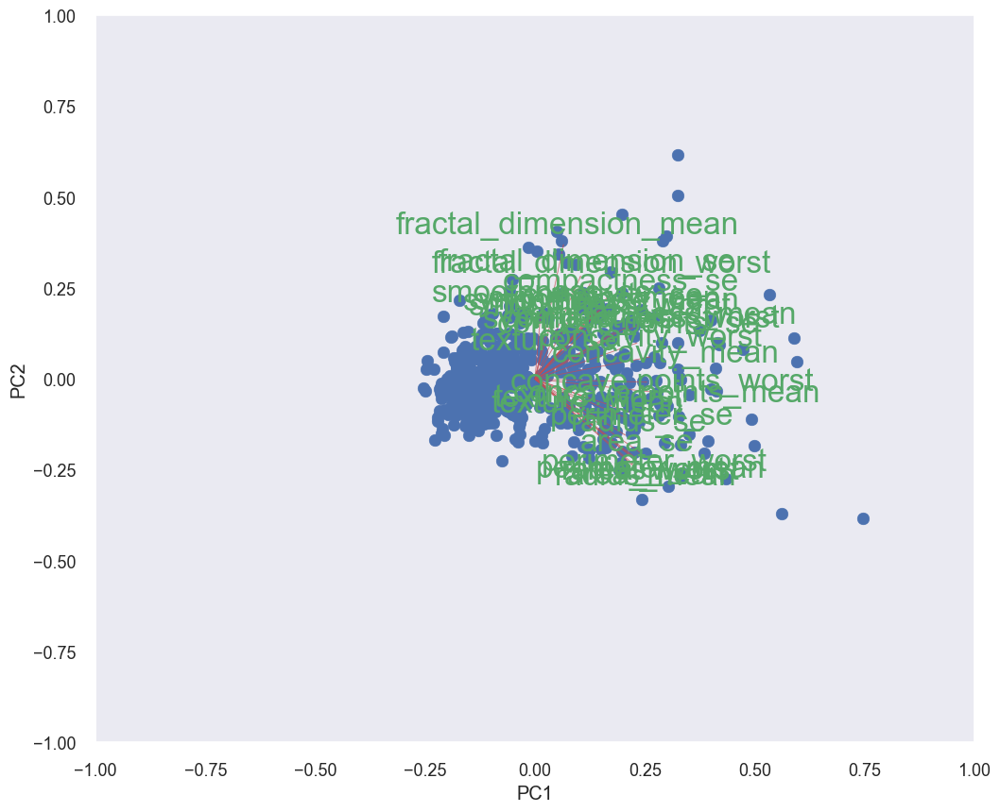

([<Figure size 1200x1000 with 1 Axes>],
 [<AxesSubplot:xlabel='Principal component 1', ylabel='Principal component 2'>])

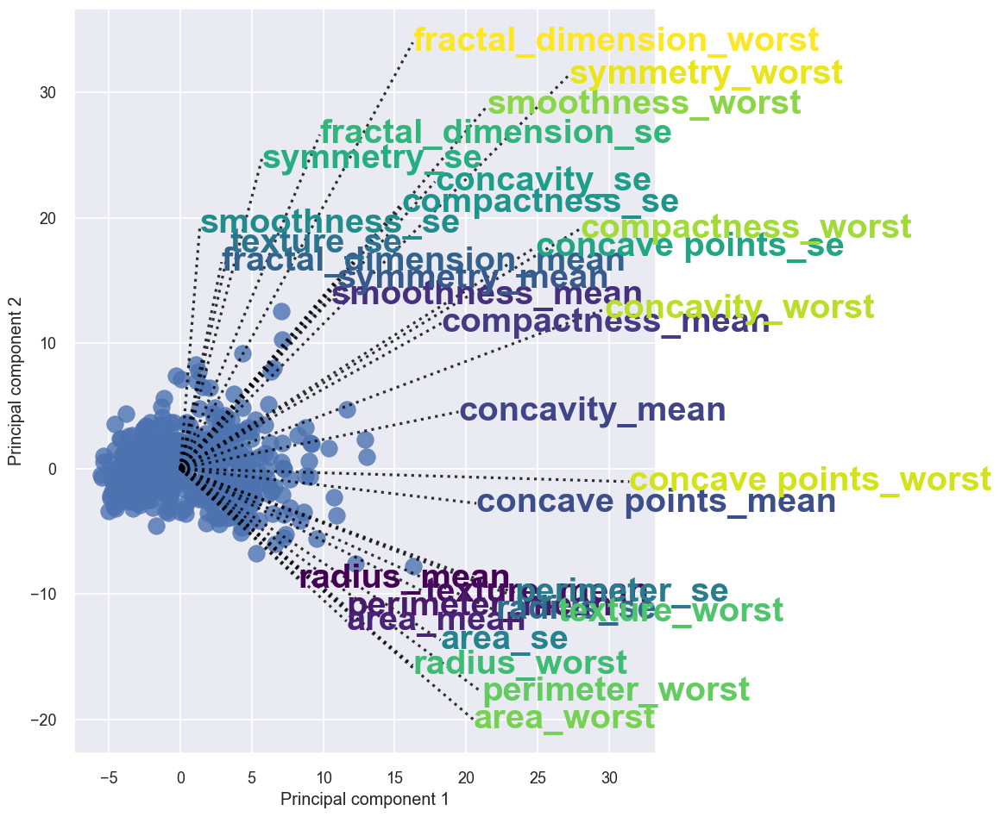

In [123]:
plt.rcParams["figure.figsize"] = (12,10)

def biplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley) #, c = cities.index.tolist())
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
    plt.xlim(-1,1)
    plt.ylim(-1,1)
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()
    
    
biplot(scores[:,0:2],np.transpose(pca.components_[0:2, :]),wis2.columns)
plt.show()

loading_settings = {
    'add_text': True
}
pca_2d_scores(
    pca,
    scores,
    xvars=wis2.columns,
    #class_data=class_data,
    #class_names=class_names,
    select_components={(1, 2)},
    loading_settings=loading_settings,
    s=200,
    alpha=.8,
    cmap_class='Dark2',
)

Aquellas flechas como concave points_worst, concavity_worst, symmetry_worst (riguroso, porque el tamaño de la flecha es más corta) son de las que mayor peso tendran porque están más correlacionadas.

(<Figure size 1200x1000 with 2 Axes>, <AxesSubplot:>)

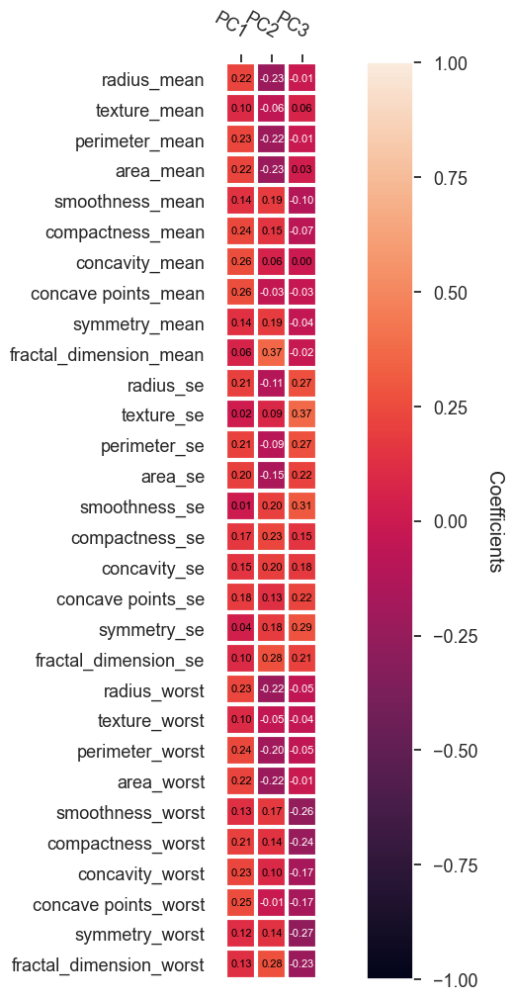

In [124]:
from psynlig import pca_loadings_map
kwargs = {
    'text': {
        'fontsize': '8',
    },
    'heatmap': {
        'vmin': -1,
        'vmax': 1,
    },
}


# Plot the value of the coefficients:
pca_loadings_map(
    pca,
    wis2.columns,
    textcolors=['white', 'black'],
    **kwargs
)

Al igual que hemos hecho en las comparaciones de los componentes, aquí podemos verlo de forma visual.

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [30] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [10] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [30] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[10]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


(<Figure size 1500x1000 with 1 Axes>,
 <AxesSubplot:title={'center':'Cumulative explained variance\n 10 Principal Components explain [96.13%] of the variance.'}, xlabel='Principle Component', ylabel='Percentage explained variance'>)

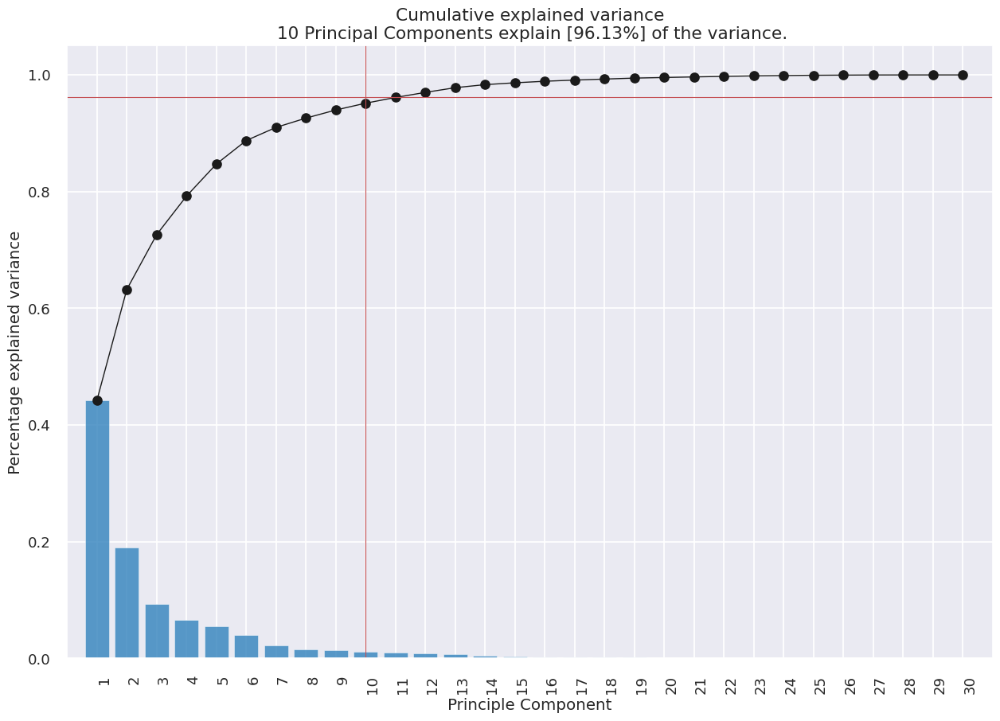

In [131]:
#PCA con el paquete pca

# !pip install pca
from pca import pca

# Inicializamos con los parámetros por defecto
model = pca(normalize=True)

# Fit transform
results = model.fit_transform(wis2)

# Graficamos la varianza explicada

model.plot()

Con este modelo nos da datos bastante utiles:
[pca] >Ajustar usando PCA.

[pca] >Calcular cargas y PCs.

[pca] >Calcular la varianza explicada.

[pca] >El número de componentes es [10] que cubre el [95.00%] de varianza explicada.

[pca] >La reducción PCA se realiza en las [30] columnas del marco de datos de entrada

[pca] >Detección de valores atípicos mediante la prueba T2 de Hotelling con alfa=[0,05] y n_componentes=[10].

[pca] >Corrección de prueba múltiple aplicada para la prueba T2 de Hotelling: [fdr_bh]

[pca] >Detección de valores atípicos mediante SPE/DmodX con n_std=[3]


In [132]:
model.results

{'loadings':       radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
 PC1      0.218902      0.103725        0.227537   0.220995         0.142590   
 PC2     -0.233857     -0.059706       -0.215181  -0.231077         0.186113   
 PC3     -0.008531      0.064550       -0.009314   0.028700        -0.104292   
 PC4      0.041409     -0.603050        0.041983   0.053434         0.159383   
 PC5      0.037786     -0.049469        0.037375   0.010331        -0.365089   
 PC6      0.018741     -0.032179        0.017308  -0.001888        -0.286374   
 PC7     -0.124088      0.011400       -0.114477  -0.051653        -0.140669   
 PC8     -0.007452      0.130675       -0.018687   0.034674        -0.288975   
 PC9     -0.223110      0.112699       -0.223739  -0.195586         0.006425   
 PC10     0.095487      0.240934        0.086386   0.074956        -0.069293   
 
       compactness_mean  concavity_mean  concave points_mean  symmetry_mean  \
 PC1           0.239285    

Con estos datos podemos sacar aquellos que son mejores variables [loading]  que al aplicarlos nos saldrá mejor el analisis y también podemos observar si son outliers [y_bool] o no.

In [133]:
model.results['loadings']

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
PC1,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,0.205979,0.017428,0.211326,0.202870,0.014531,0.170393,0.153590,0.183417,0.042498,0.102568,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
PC2,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,-0.105552,0.089980,-0.089457,-0.152293,0.204430,0.232716,0.197207,0.130322,0.183848,0.280092,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339
PC3,-0.008531,0.064550,-0.009314,0.028700,-0.104292,-0.074092,0.002734,-0.025564,-0.040240,-0.022574,0.268481,0.374634,0.266645,0.216007,0.308839,0.154780,0.176464,0.224658,0.288584,0.211504,-0.047507,-0.042298,-0.048547,-0.011902,-0.259798,-0.236076,-0.173057,-0.170344,-0.271313,-0.232791
PC4,0.041409,-0.603050,0.041983,0.053434,0.159383,0.031795,0.019123,0.065336,0.067125,0.048587,0.097941,-0.359856,0.088992,0.108205,0.044664,-0.027469,0.001317,0.074067,0.044073,0.015305,0.015417,-0.632808,0.013803,0.025895,0.017652,-0.091328,-0.073951,0.006007,-0.036251,-0.077053
PC5,0.037786,-0.049469,0.037375,0.010331,-0.365089,0.011704,0.086375,-0.043861,-0.305941,-0.044424,-0.154456,-0.191651,-0.120990,-0.127574,-0.232066,0.279968,0.353982,0.195548,-0.252869,0.263297,-0.004407,-0.092883,0.007454,-0.027391,-0.324435,0.121804,0.188519,0.043332,-0.244559,0.094423
PC6,0.018741,-0.032179,0.017308,-0.001888,-0.286374,-0.014131,-0.009344,-0.052050,0.356458,-0.119431,-0.025603,-0.028747,0.001811,-0.042864,-0.342917,0.069198,0.056343,-0.031224,0.490246,-0.053195,-0.000291,-0.050008,0.008501,-0.025164,-0.369255,0.047706,0.028379,-0.030873,0.498927,-0.080224
PC7,-0.124088,0.011400,-0.114477,-0.051653,-0.140669,0.030918,-0.107520,-0.150482,-0.093891,0.295760,0.312490,-0.090755,0.314640,0.346679,-0.244024,0.023464,-0.208824,-0.369646,-0.080382,0.191395,-0.009710,0.009871,-0.000446,0.067832,-0.108831,0.140473,-0.060488,-0.167967,-0.018491,0.374658
PC8,-0.007452,0.130675,-0.018687,0.034674,-0.288975,-0.151397,-0.072827,-0.152323,-0.231531,-0.177121,0.022540,-0.475413,-0.011896,0.085805,0.573410,0.117460,0.060566,-0.108319,0.220149,0.011168,0.042619,0.036252,0.030559,0.079394,0.205852,0.084019,0.072468,-0.036171,0.228225,0.048360
PC9,-0.223110,0.112699,-0.223739,-0.195586,0.006425,-0.167841,0.040591,-0.111971,0.256040,-0.123741,0.249985,-0.246645,0.227154,0.229160,-0.141925,-0.145323,0.358107,0.272520,-0.304077,-0.213723,-0.112141,0.103341,-0.109614,-0.080732,0.112316,-0.100678,0.161908,0.060488,0.064638,-0.134174
PC10,0.095487,0.240934,0.086386,0.074956,-0.069293,0.012936,-0.135602,0.008055,0.572070,0.081103,-0.049547,-0.289143,-0.114508,-0.091928,0.160885,0.043505,-0.141276,0.086241,-0.316530,0.367541,0.077362,0.029551,0.050508,0.069921,-0.128305,-0.172134,-0.311639,-0.076649,-0.029563,0.012610


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'10 Principal Components explain [96.13%] of the variance'}, xlabel='PC1 (44.2% expl.var)', ylabel='PC2 (18.9% expl.var)'>)

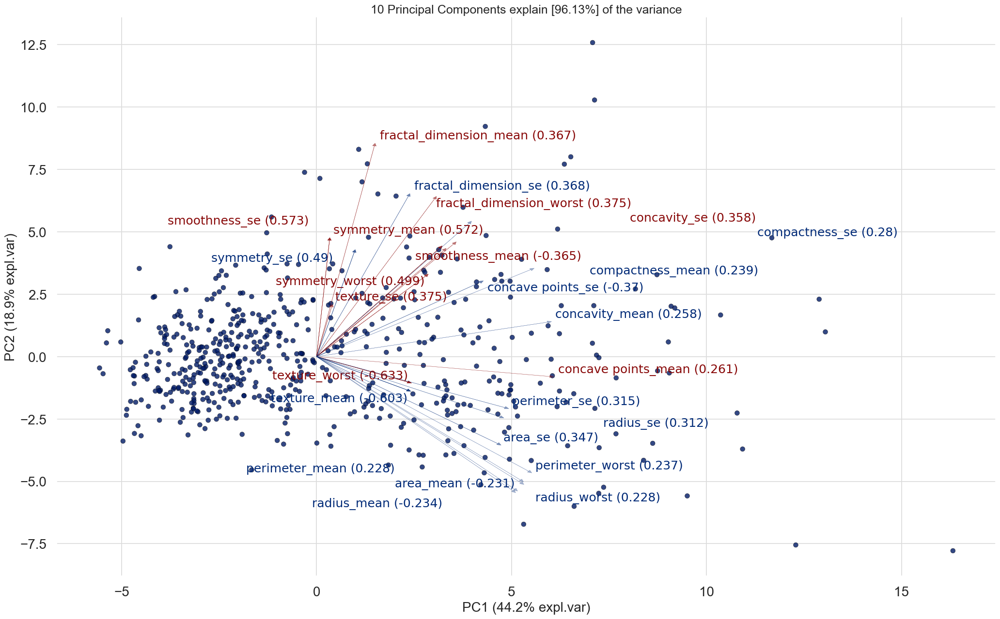

In [130]:
# Graficamos la varianza explicada
model.biplot(legend=False, s=50, jitter = True, label= False
     )

In [134]:
model1 = pca(normalize=True,n_components=0.7)
results1 = model1.fit_transform(wis2)
model1.results['loadings']

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed to capture [70.0%] explained variance using the [30] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [70.00%] explained variance.
[pca] >The PCA reduction is performed on the [30] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
PC1,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,0.205979,0.017428,0.211326,0.202870,0.014531,0.170393,0.153590,0.183417,0.042498,0.102568,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
PC2,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,-0.105552,0.089980,-0.089457,-0.152293,0.204430,0.232716,0.197207,0.130322,0.183848,0.280092,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339
PC3,-0.008531,0.064550,-0.009314,0.028700,-0.104292,-0.074092,0.002734,-0.025564,-0.040240,-0.022574,0.268481,0.374634,0.266645,0.216007,0.308839,0.154780,0.176464,0.224657,0.288584,0.211504,-0.047507,-0.042298,-0.048547,-0.011902,-0.259798,-0.236076,-0.173057,-0.170344,-0.271313,-0.232791


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'3 Principal Components explain [79.23%] of the variance'}, xlabel='PC1 (44.2% expl.var)', ylabel='PC2 (18.9% expl.var)'>)

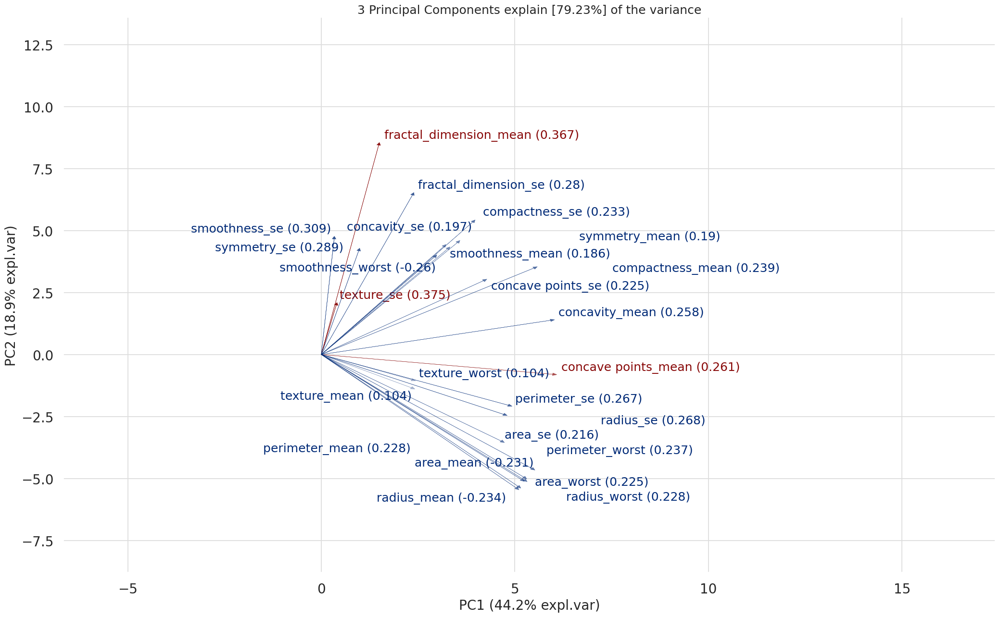

In [135]:
# Graficamos la varianza explicada
model1.biplot(legend=False, label=False, cmap=None)

## 7. Análisis factorial

In [137]:
# Análisis Factorial

from factor_analyzer import FactorAnalyzer

fa = FactorAnalyzer(rotation = 'varimax' ,method='minres',impute = "drop",n_factors=3) #cities.shape[1]

fa.fit(wis2)

FactorAnalyzer(impute='drop', rotation='varimax', rotation_kwargs={})

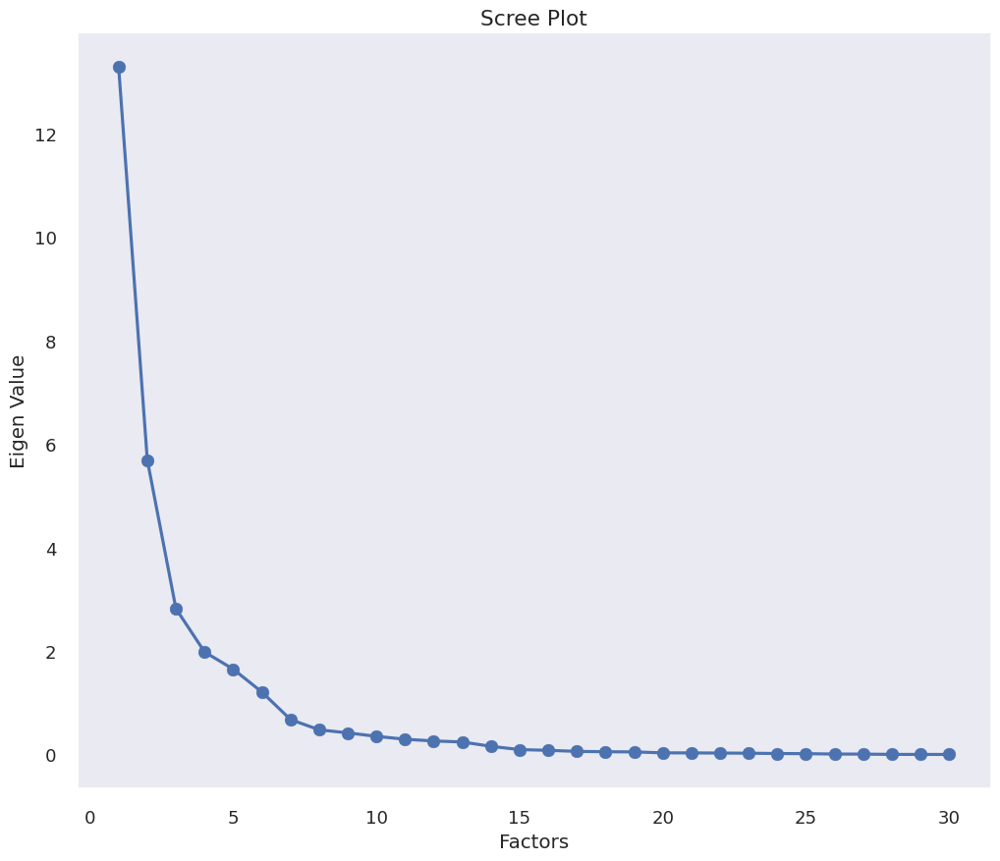

In [138]:
ev,_ = fa.get_eigenvalues()
plt.scatter(range(1,wis2.shape[1]+1),ev)
plt.plot(range(1,wis2.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigen Value')
plt.grid()

In [143]:
# Varianza de los factores
fa_var = pd.DataFrame(fa.get_factor_variance(),index=['Variance','Proportional Var','Cumulative Var'])
fa_var

,0,1,2
Variance,10.343436,6.818471,3.833151
Proportional Var,0.344781,0.227282,0.127772
Cumulative Var,0.344781,0.572064,0.699835


Anteriormente nos explicaba con 3 factores, más del 70% y ahora podemos ver que explica un poco menos del 70, esto pasa debido a que en el factorial depende de cual es el metodo de estimación [minres]

In [144]:
# Comunalidades

#podemos sacar el % de variabilidad explicado por la solución de dos factores para cada variable, nos interesa las comunalidades altas!!!
#(radius_mean, perimeter_mean, area_mean, compactness_mean, etc)

fa_commu = pd.DataFrame(fa.get_communalities(),index=wis2.columns,columns=['Communalities'])
fa_commu

,Communalities
radius_mean,0.951452
texture_mean,0.142260
perimeter_mean,0.954909
area_mean,0.959914
smoothness_mean,0.436656
compactness_mean,0.915200
concavity_mean,0.910235
concave points_mean,0.910257
symmetry_mean,0.410145
fractal_dimension_mean,0.803163


In [145]:
# Cargas
fa_loadings = pd.DataFrame(fa.loadings_,index=wis2.columns)
fa_loadings

,0,1,2
radius_mean,0.960058,0.112788,-0.130459
texture_mean,0.359734,0.094611,0.062451
perimeter_mean,0.959141,0.158444,-0.099268
area_mean,0.973775,0.082255,-0.070073
smoothness_mean,0.142491,0.603155,0.229252
compactness_mean,0.462039,0.779857,0.305849
concavity_mean,0.664309,0.611321,0.308570
concave points_mean,0.797351,0.502585,0.147977
symmetry_mean,0.138347,0.547930,0.301295
fractal_dimension_mean,-0.318513,0.669774,0.503106


In [146]:
# Puntuaciones
fa_scores = pd.DataFrame(fa.transform(wis2),index=wis2.index)
fa_scores.head()

,0,1,2
0,1.269100,2.694582,0.634455
1,1.529311,-0.269914,-1.343188
2,1.339605,0.677321,0.185386
3,-1.085788,4.839862,1.243046
4,1.697922,-0.479785,0.457914


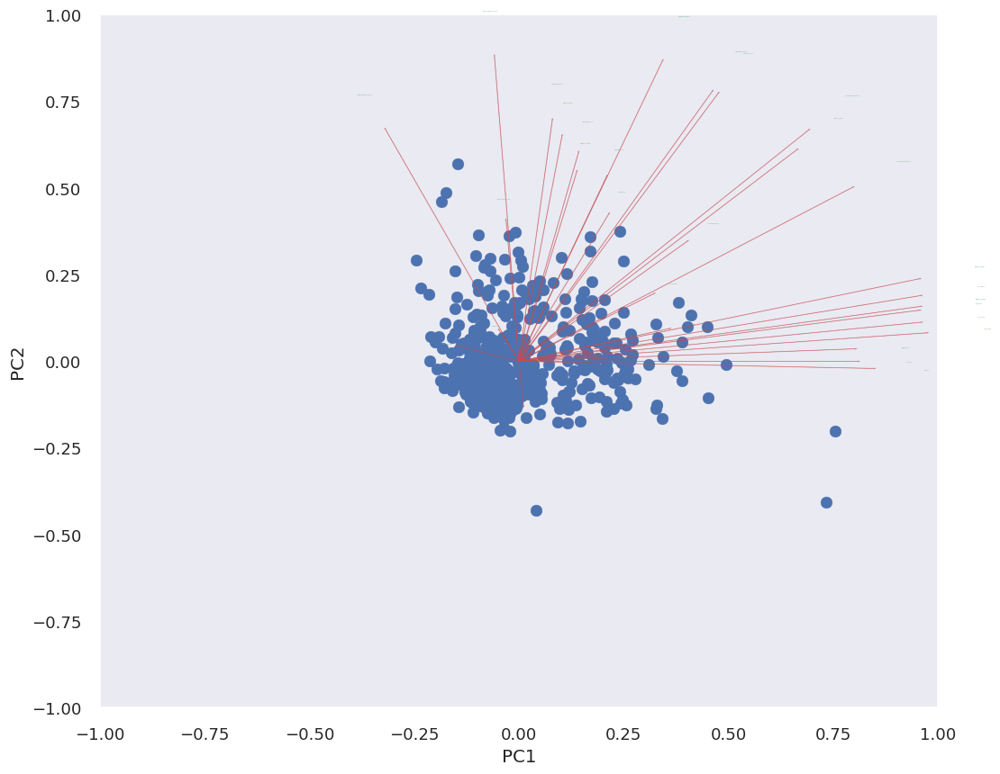

In [149]:
loadings=np.array(fa_loadings)

fig = px.scatter(fa_scores, x=0, y=1, text=wis2.index)

biplot(np.array(fa_scores),np.array(fa_loadings),wis2.columns)
plt.show()

Con la rotación Varimax podemos mejorar un poco algunos puntos ya que ahora algunos como el fractal dimension mean y smoothness se explican mejor en la componente 2, mejoramos bastante aquellos componente 1 ya que vemos como van hacía su dirección.



 PCA :

           0         1         2
0   0.218902 -0.233857 -0.008531
1   0.103725 -0.059706  0.064550
2   0.227537 -0.215181 -0.009314
3   0.220995 -0.231077  0.028700
4   0.142590  0.186113 -0.104292
5   0.239285  0.151892 -0.074092
6   0.258400  0.060165  0.002734
7   0.260854 -0.034767 -0.025564
8   0.138167  0.190349 -0.040240
9   0.064363  0.366575 -0.022574
10  0.205979 -0.105552  0.268481
11  0.017428  0.089980  0.374634
12  0.211326 -0.089457  0.266645
13  0.202870 -0.152293  0.216007
14  0.014531  0.204430  0.308839
15  0.170393  0.232716  0.154780
16  0.153590  0.197207  0.176464
17  0.183417  0.130322  0.224658
18  0.042498  0.183848  0.288584
19  0.102568  0.280092  0.211504
20  0.227997 -0.219866 -0.047507
21  0.104469 -0.045467 -0.042298
22  0.236640 -0.199878 -0.048547
23  0.224871 -0.219352 -0.011902
24  0.127953  0.172304 -0.259798
25  0.210096  0.143593 -0.236076
26  0.228768  0.097964 -0.173057
27  0.250886 -0.008257 -0.170344
28  0.122905  0.141883 -0.271313


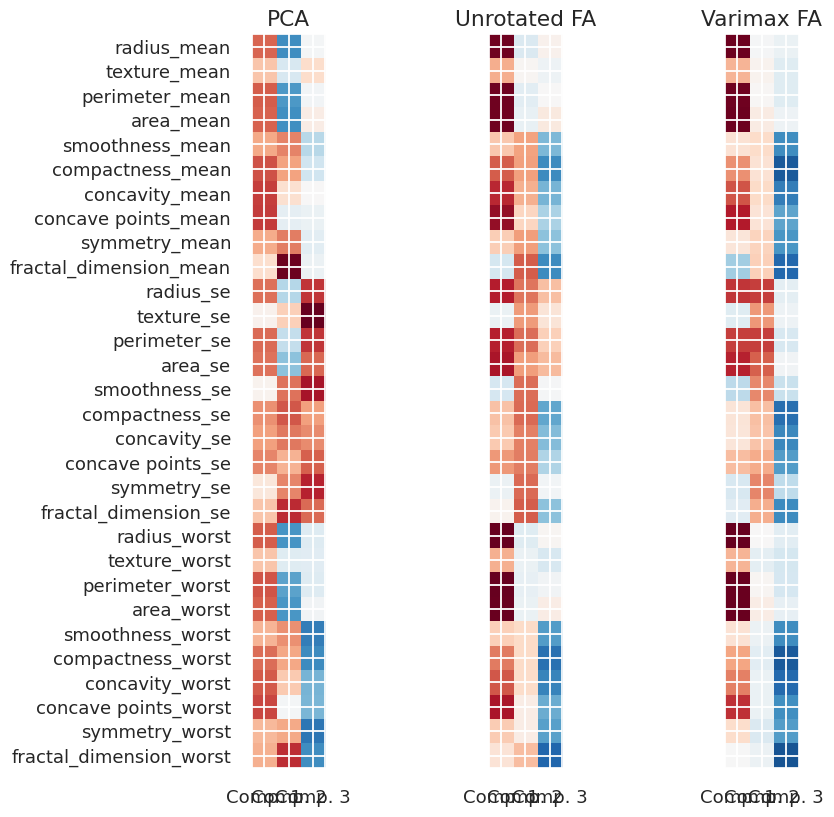

In [150]:
#Comparativa PCA-FA-FA_varimax

from sklearn.decomposition import FactorAnalysis, PCA
from sklearn.preprocessing import scale
n_comps = 3

# Escalado de datos
# ==============================================================================
X=scale(wis2)

feature_names=wis2.columns
methods = [
    ("PCA", PCA()),
    ("Unrotated FA", FactorAnalysis()),
    ("Varimax FA", FactorAnalysis(rotation="varimax")),
    
]
fig, axes = plt.subplots(ncols=len(methods), figsize=(10, 8))

for ax, (method, fa) in zip(axes, methods):
    fa.set_params(n_components=n_comps)
    fa.fit(X)

    components = fa.components_.T
    print("\n\n %s :\n" % method)
    print(pd.DataFrame(components))

    vmax = np.abs(components).max()
    ax.imshow(components, cmap="RdBu_r", vmax=vmax, vmin=-vmax)
    ax.set_yticks(np.arange(len(feature_names)))
    if ax.get_subplotspec().is_first_col():
        ax.set_yticklabels(feature_names)
    else:
        ax.set_yticklabels([])
    ax.set_title(str(method))
    ax.set_xticks([0, 1, 2])
    ax.set_xticklabels(["Comp. 1", "Comp. 2", "Comp. 3"])
    # Ajusta el espaciado entre los elementos del gráfico
    plt.tight_layout()


### Crea el input con estas componentes (matriz de scores o puntuaciones) y ajusta un modelo de predicción adecuado para la variable objetivo "diagnosis".

In [151]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score

In [152]:
# Matriz de predictores
X = wis1.drop(["diagnosis"], axis=1)
# Variable objetivo para la regresión logística
y = wis1['diagnosis']

# Partición training-test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1234)

In [ ]:
# Definimos los pasos del pipeline
steps = [('scaler', StandardScaler()),
         ('pca', PCA(n_components=0.7)),
         ('clf', LogisticRegression())]
# Construimos el pipeline
pipe_lr = Pipeline(steps)

# Ajustamos el proceso del pipe en training
pipe_lr.fit(X_train, y_train)
# Predicciones en training
train_predictions = pipe_lr.predict(X_train)
# Predicciones en test
test_predictions = pipe_lr.predict(X_test)

print("TRAIN:")
print(classification_report(y_train, train_predictions))

print("TEST:")
print(classification_report(y_test, test_predictions))

In [154]:
# Score final (accuracy)
pipe_lr.score(X_test,y_test)

0.8947368421052632

Muy buen ajuste de la regresión logística PCA a los datos de training y buena capacidad de generalización al conjunto de test. Un modelo que acierta el 97% de los registros y los clasifica como diagnosis M o B.

In [156]:
# Regresion Logistica
wis1
wis1['diagnosis'].value_counts(normalize=True)

B    0.627417
M    0.372583
Name: diagnosis, dtype: float64

Modelo de clasificación  con un 63/37. Hay algo de desbalanceo.

In [157]:
# Eliminar la variable objetivo

wis1['diagnosis'] = wis1['diagnosis'].map({'M':1, 'B':0})
# hacemos el cambio para facilitar los analisis
varObjBin = wis1['diagnosis']

imput = wis1.drop(['diagnosis'], axis = 1)
imput.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              569 non-null    float64
 1   texture_mean             569 non-null    float64
 2   perimeter_mean           569 non-null    float64
 3   area_mean                569 non-null    float64
 4   smoothness_mean          569 non-null    float64
 5   compactness_mean         569 non-null    float64
 6   concavity_mean           569 non-null    float64
 7   concave points_mean      569 non-null    float64
 8   symmetry_mean            569 non-null    float64
 9   fractal_dimension_mean   569 non-null    float64
 10  radius_se                569 non-null    float64
 11  texture_se               569 non-null    float64
 12  perimeter_se             569 non-null    float64
 13  area_se                  569 non-null    float64
 14  smoothness_se            5

In [158]:
# nuevodata

NewTable = pd.concat([nuevodata,varObjBin], axis=1)
NewTable.info()
NewTable.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   PC1        569 non-null    float64
 1   PC2        569 non-null    float64
 2   PC3        569 non-null    float64
 3   diagnosis  569 non-null    int64  
dtypes: float64(3), int64(1)
memory usage: 17.9 KB


,PC1,PC2,PC3,diagnosis
0,9.192837,1.948583,-1.123166,1
1,2.387802,-3.768172,-0.529293,1
2,5.733896,-1.075174,-0.551748,1
3,7.122953,10.275589,-3.232790,1
4,3.935302,-1.948072,1.389767,1


In [159]:
# Matriz de predictores
#X = wis1.drop(["diagnosis"], axis=1)
# Variable objetivo para la regresión logística
#y = wis1['diagnosis']

# Partición training-test
X_train, X_test, y_train, y_test = train_test_split(nuevodata, varObjBin, test_size=0.20, random_state=1234)
print("Training dataset:", X_train.shape, y_train.shape)
print("Testing dataset:", X_test.shape, y_test.shape)


Training dataset: (455, 3) (455,)
Testing dataset: (114, 3) (114,)


In [160]:
# Unir el predictor de la variable objetivo con la variable objetivo en el training
data_train = X_train.join(y_train)
data_train.head()

,PC1,PC2,PC3,diagnosis
518,-0.199871,1.076360,-0.673149,0
551,-2.025037,1.261242,0.504926,0
111,-0.103350,2.280144,2.109563,0
64,1.691608,1.540677,-1.799845,1
443,-3.900527,0.730776,2.136071,0


In [162]:
from statsmodels.formula.api import ols

exec(open('NuestrasFunciones.py').read())

In [164]:
# form=ols_formula(data_train,'fev')
# form

formC_log = ols_formula(data_train,'diagnosis')
formC_log

'diagnosis ~ PC1 + PC2 + PC3'

In [165]:
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import logit 

# Ajusto regresión modelo completo efectos ppales
modeloCompleto_log = logit(formC_log,data=data_train).fit()
modeloCompleto_log.summary()

Optimization terminated successfully.
         Current function value: 0.081726
         Iterations 11


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      451
Method:                           MLE   Df Model:                            3
Date:                Thu, 29 Jun 2023   Pseudo R-squ.:                  0.8757
Time:                        17:26:32   Log-Likelihood:                -37.185
converged:                       True   LL-Null:                       -299.10
Covariance Type:            nonrobust   LLR p-value:                3.276e-113
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.1188      0.342     -3.271      0.001      -1.789      -0.448
PC1            2.9671      0.520      5.709      0.000       1.948       3.986
PC2           -1.4898      0.306     -4.861      0.000      -2.090      -0.889
PC3           -0.5897      0.171     -3.448      0.001      -0.925      -0.255
==============================================================================

Possibly complete quasi-separation: A fraction 0.44 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [167]:
# Evaluacion del test
#data_tot = input_transf.join()

tr_tst_eval_log(formC_log,NewTable)

Accuracy en training:  0.9648351648351648 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[67  2]
 [ 9 36]]
              precision    recall  f1-score   support

         0.0       0.88      0.97      0.92        69
         1.0       0.95      0.80      0.87        45

    accuracy                           0.90       114
   macro avg       0.91      0.89      0.90       114
weighted avg       0.91      0.90      0.90       114

Area bajo la curva ROC training: 
 0.9953426480372588
Area bajo la curva ROC test: 
 0.9780998389694042


In [168]:
formC_log1 = 'diagnosis ~ PC1 + PC2'
modelo_log1 = logit(formC_log1,data=data_train).fit()
modelo_log1.summary()

Optimization terminated successfully.
         Current function value: 0.099126
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      452
Method:                           MLE   Df Model:                            2
Date:                Thu, 29 Jun 2023   Pseudo R-squ.:                  0.8492
Time:                        17:26:54   Log-Likelihood:                -45.102
converged:                       True   LL-Null:                       -299.10
Covariance Type:            nonrobust   LLR p-value:                4.911e-111
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.7142      0.281     -2.538      0.011      -1.266      -0.163
PC1            2.5879      0.398      6.500      0.000       1.808       3.368
PC2           -1.3519      0.243     -5.557      0.000      -1.829      -0.875
==============================================================================

Possibly complete quasi-separation: A fraction 0.31 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [169]:
tr_tst_eval_log(formC_log1,NewTable)

Accuracy en training:  0.9626373626373627 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[67  2]
 [ 8 37]]
              precision    recall  f1-score   support

         0.0       0.89      0.97      0.93        69
         1.0       0.95      0.82      0.88        45

    accuracy                           0.91       114
   macro avg       0.92      0.90      0.91       114
weighted avg       0.92      0.91      0.91       114

Area bajo la curva ROC training: 
 0.9929308050565535
Area bajo la curva ROC test: 
 0.9790660225442834


In [170]:
formC_log2 = 'diagnosis ~ PC1 + PC3'
modelo_log2 = logit(formC_log2,data=data_train).fit()
modelo_log2.summary()

Optimization terminated successfully.
         Current function value: 0.168990
         Iterations 9


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      452
Method:                           MLE   Df Model:                            2
Date:                Thu, 29 Jun 2023   Pseudo R-squ.:                  0.7429
Time:                        17:27:07   Log-Likelihood:                -76.891
converged:                       True   LL-Null:                       -299.10
Covariance Type:            nonrobust   LLR p-value:                 3.138e-97
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.0801      0.223     -4.843      0.000      -1.517      -0.643
PC1            1.3633      0.145      9.410      0.000       1.079       1.647
PC3           -0.5614      0.130     -4.334      0.000      -0.815      -0.308
==============================================================================
"""

In [171]:
tr_tst_eval_log(formC_log2,NewTable)

Accuracy en training:  0.9274725274725275 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[65  4]
 [11 34]]
              precision    recall  f1-score   support

         0.0       0.86      0.94      0.90        69
         1.0       0.89      0.76      0.82        45

    accuracy                           0.87       114
   macro avg       0.88      0.85      0.86       114
weighted avg       0.87      0.87      0.87       114

Area bajo la curva ROC training: 
 0.980393379906853
Area bajo la curva ROC test: 
 0.9481481481481482


In [172]:
formC_log3 = 'diagnosis ~ PC2 + PC3'
modelo_log3 = logit(formC_log3,data=data_train).fit()
modelo_log3.summary()

Optimization terminated successfully.
         Current function value: 0.625584
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      452
Method:                           MLE   Df Model:                            2
Date:                Thu, 29 Jun 2023   Pseudo R-squ.:                 0.04834
Time:                        17:27:21   Log-Likelihood:                -284.64
converged:                       True   LL-Null:                       -299.10
Covariance Type:            nonrobust   LLR p-value:                 5.264e-07
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.6018      0.103     -5.854      0.000      -0.803      -0.400
PC2           -0.1675      0.047     -3.547      0.000      -0.260      -0.075
PC3           -0.2710      0.069     -3.950      0.000      -0.405      -0.137
==============================================================================
"""

In [173]:
tr_tst_eval_log(formC_log3,NewTable)

Accuracy en training:  0.7076923076923077 

Matriz de confusiÃ³n y mÃ©tricas derivadas: 
 [[69  0]
 [30 15]]
              precision    recall  f1-score   support

         0.0       0.70      1.00      0.82        69
         1.0       1.00      0.33      0.50        45

    accuracy                           0.74       114
   macro avg       0.85      0.67      0.66       114
weighted avg       0.82      0.74      0.69       114

Area bajo la curva ROC training: 
 0.665585495675316
Area bajo la curva ROC test: 
 0.6876006441223832


In [175]:
formC_log4 = 'diagnosis ~ PC1 + PC2*PC3'
modelo_log4 = logit(formC_log4,data=data_train).fit()
modelo_log4.summary()

Optimization terminated successfully.
         Current function value: 0.080601
         Iterations 11


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      450
Method:                           MLE   Df Model:                            4
Date:                Thu, 29 Jun 2023   Pseudo R-squ.:                  0.8774
Time:                        17:27:44   Log-Likelihood:                -36.673
converged:                       True   LL-Null:                       -299.10
Covariance Type:            nonrobust   LLR p-value:                2.826e-112
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.0754      0.344     -3.128      0.002      -1.749      -0.401
PC1            2.9358      0.521      5.636      0.000       1.915       3.957
PC2           -1.4326      0.315     -4.551      0.000      -2.050      -0.816
PC3           -0.5047      0.188     -2.692      0.007      -0.872      -0.137
PC2:PC3       -0.0669      0.070     -0.961      0.337      -0.203       0.070
==============================================================================

Possibly complete quasi-separation: A fraction 0.43 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Descartamos porque el P valor es mayor a 0.05

In [176]:
formC_log5 = 'diagnosis ~ PC1*PC2 + PC3'
modelo_log5 = logit(formC_log5,data=data_train).fit()
modelo_log5.summary()

Optimization terminated successfully.
         Current function value: 0.081377
         Iterations 11


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:              diagnosis   No. Observations:                  455
Model:                          Logit   Df Residuals:                      450
Method:                           MLE   Df Model:                            4
Date:                Thu, 29 Jun 2023   Pseudo R-squ.:                  0.8762
Time:                        17:28:06   Log-Likelihood:                -37.027
converged:                       True   LL-Null:                       -299.10
Covariance Type:            nonrobust   LLR p-value:                4.018e-112
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.0182      0.377     -2.700      0.007      -1.757      -0.279
PC1            2.9987      0.536      5.595      0.000       1.948       4.049
PC2           -1.4574      0.321     -4.535      0.000      -2.087      -0.828
PC1:PC2       -0.0423      0.075     -0.561      0.575      -0.190       0.105
PC3           -0.5615      0.178     -3.163      0.002      -0.909      -0.214
==============================================================================

Possibly complete quasi-separation: A fraction 0.44 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

Descartamos porque el P valor es mayor a 0.05

In [177]:
list_form_log = [formC_log, formC_log1, formC_log2, formC_log3]

list_res = pd.DataFrame(map(lambda x: cross_val_log(x,NewTable, seed=1234),list_form_log))

Modelo: diagnosis ~ PC1 + PC2 + PC3
AUC: 0.991 (0.007)
Modelo: diagnosis ~ PC1 + PC2
AUC: 0.989 (0.007)
Modelo: diagnosis ~ PC1 + PC3
AUC: 0.972 (0.013)
Modelo: diagnosis ~ PC2 + PC3
AUC: 0.658 (0.048)


In [178]:
# Transponer dataframe 
results = list_res.T.melt()
results.columns = ['Modelo','AUC']
results.head()

# Boxplot paralelo para comparar

,Modelo,AUC
0,0,0.978100
1,0,0.994872
2,0,0.997685
3,0,0.998362
4,0,0.988372


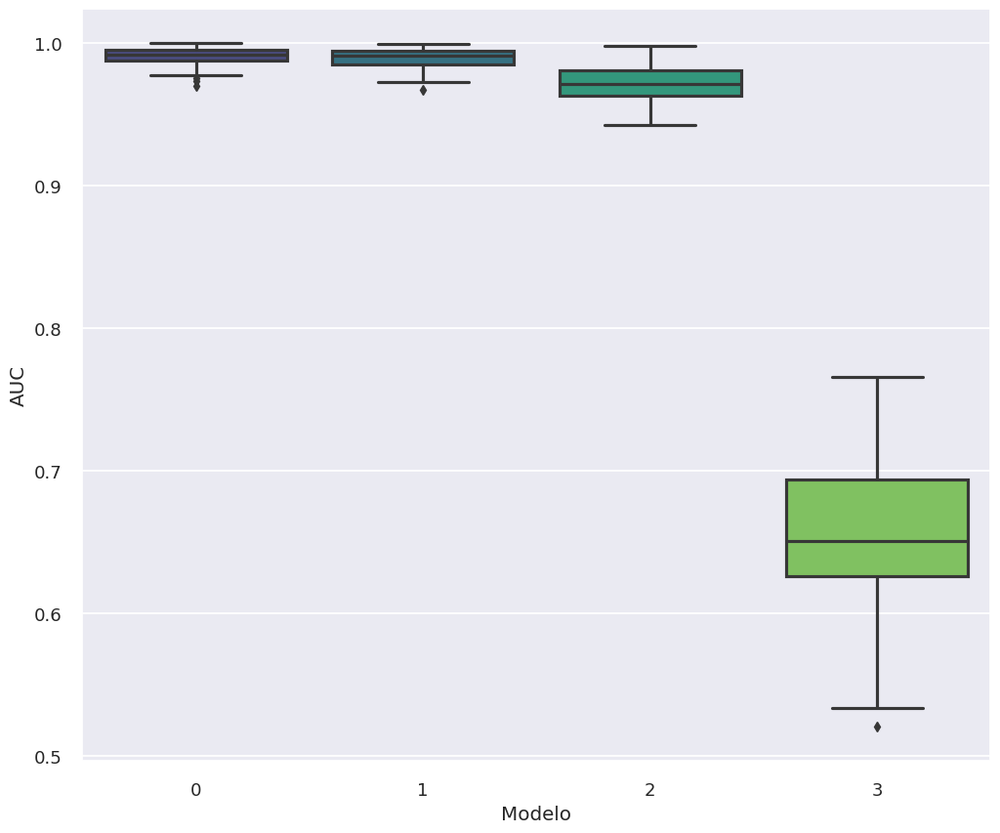

In [179]:
plt.clf()
sns.boxplot(x='Modelo',y='AUC',data=results,palette='viridis')
plt.show()


In [180]:
list_form_log2 = [formC_log, formC_log1, formC_log2]

list_res2 = pd.DataFrame(map(lambda x: cross_val_log(x,NewTable, seed=1234),list_form_log2))

Modelo: diagnosis ~ PC1 + PC2 + PC3
AUC: 0.991 (0.007)
Modelo: diagnosis ~ PC1 + PC2
AUC: 0.989 (0.007)
Modelo: diagnosis ~ PC1 + PC3
AUC: 0.972 (0.013)


In [181]:
results2 = list_res2.T.melt()
results2.columns = ['Modelo','AUC']
results2.head()

,Modelo,AUC
0,0,0.978100
1,0,0.994872
2,0,0.997685
3,0,0.998362
4,0,0.988372


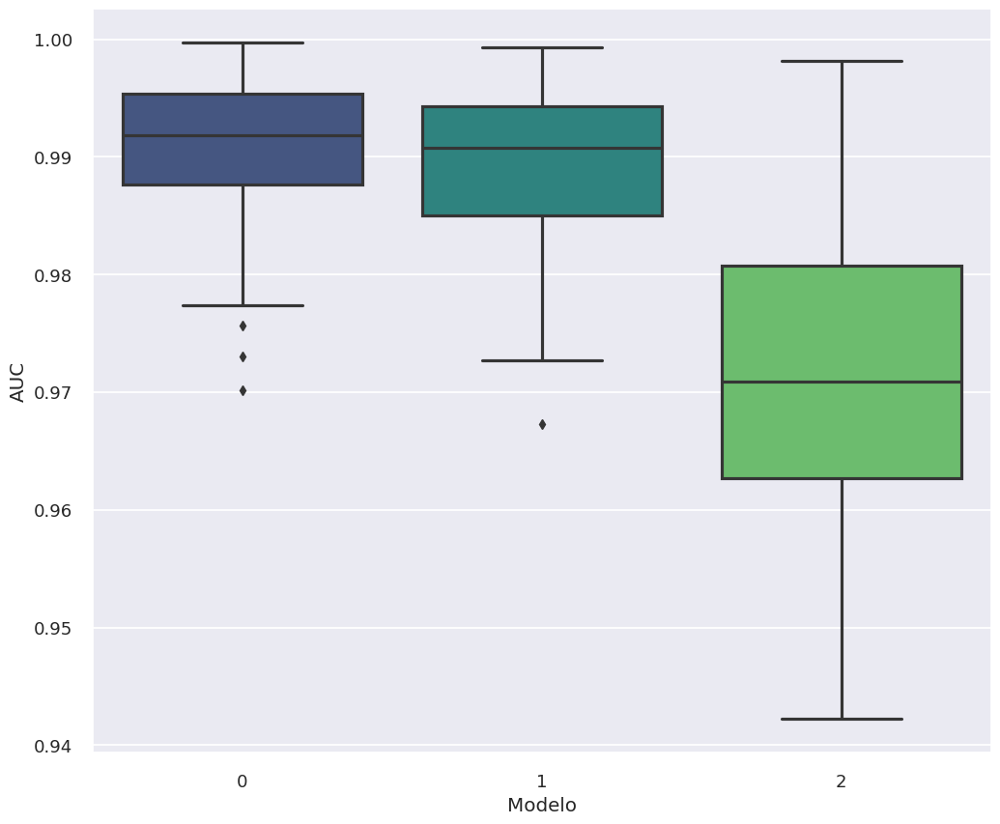

In [182]:
plt.clf()
sns.boxplot(x='Modelo',y='AUC',data=results2,palette='viridis')
plt.show()

Escogemos el primer modelo, ya que es el más preciso de ellos y además abarca menos

# EJERCICIO 4

El conjunto de datos DatosEleccionesEspaña.xlsx contiene información demográfica sobre los distintos municipios de España junto con los resultados que se obtuvieron en un proceso electoral. 

En esta práctica, el objetivo fundamental es crear grupos de comunidades autónomas en función de ciertas características previamente seleccionadas.

1. Escoge 10 variables numéricas presentes en el conjunto de datos y realiza un ligera depuración sobre este subconjunto de variables (Valores raros, Outliers, NAs..) 
2. Agrega los valores por CCAA, distinguiendo entre valores relativos (agregación por la media) y valores absolutos (agregación por suma) 
3. Valora la necesidad de escalar los datos y decide el tipo de distancia a aplicar
4. Explora los métodos de clustering jerárquico para estos datos y decide el tipo  de Linkage más adecuado. 
5. Toma una decisión sobre el número de clusters a considerar y realiza un análisis cluster mediante el método k-means.
6. Muestra el biplot (puede ser proyección sobre dos de las variables que resulten relevantes o proyección sobre las dos primeras componentes principales de la matriz de entrada) y comenta los grupos formados. Interpreta los centroides.

## 1. Escoge 10 variables numéricas presentes en el conjunto de datos y realiza un ligera depuración sobre este subconjunto de variables (Valores raros, Outliers, NAs..) 

In [187]:
# Lectura de datos
sp = pd.read_excel('DatosEleccionesEspaña.xlsx')
sp.head()

,Name,CodigoProvincia,CCAA,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,ActividadPpal,inmuebles,Pob2010,SUPERFICIE,Densidad,PobChange_pct,PersonasInmueble,Explotaciones
0,Abadía,10,Extremadura,336,282,20.213,0,60.444,35.555,1.778,1,0,3.869,18.155,55.059,26.785,44.048,0.89,79.762,0.298,19.345,2.381,54.762,42.857,4.762,9.524,11.905,73.810,15.0,0.0,0.0,0.0,0.0,Otro,216.0,326.0,4507.5593,MuyBaja,3.07,1.56,28
1,Abertura,10,Extremadura,429,364,25.275,0,54.779,44.118,0.368,1,0,1.632,13.055,56.643,30.304,50.117,1.63,90.909,2.797,7.226,16.216,32.432,51.351,8.108,8.108,10.811,67.568,11.0,0.0,0.0,0.0,0.0,Otro,382.0,459.0,6270.7646,MuyBaja,-6.54,1.12,67
2,Acebo,10,Extremadura,569,569,27.241,0,44.203,53.140,0.966,0,1,1.230,9.139,54.834,36.028,49.033,0.70,78.910,0.703,18.102,8.197,36.066,55.738,22.951,9.836,13.115,49.180,49.0,0.0,0.0,0.0,0.0,Otro,918.0,674.0,5702.1000,MuyBaja,-15.58,0.62,74
3,Acehúche,10,Extremadura,822,704,30.114,1,50.813,45.325,0.000,1,0,4.258,14.964,60.098,24.940,51.095,0.12,93.917,0.487,5.109,7.407,61.111,31.481,16.667,5.556,16.667,59.259,50.0,0.0,0.0,0.0,0.0,Otro,599.0,842.0,9106.4649,MuyBaja,-2.38,1.37,66
4,Aceituna,10,Extremadura,623,540,30.185,1,44.562,49.867,0.796,0,1,3.531,15.569,59.391,25.042,48.154,0.64,93.258,0.161,4.173,15.385,48.077,36.538,21.154,0.000,11.538,61.538,22.0,0.0,0.0,0.0,0.0,Otro,394.0,625.0,4007.6141,MuyBaja,-0.32,1.58,96


In [189]:
sp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8119 entries, 0 to 8118
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Name                          8119 non-null   object 
 1   CodigoProvincia               8119 non-null   int64  
 2   CCAA                          8119 non-null   object 
 3   Population                    8119 non-null   int64  
 4   TotalCensus                   8119 non-null   int64  
 5   AbstentionPtge                8119 non-null   float64
 6   AbstencionAlta                8119 non-null   int64  
 7   Izda_Pct                      8119 non-null   float64
 8   Dcha_Pct                      8119 non-null   float64
 9   Otros_Pct                     8119 non-null   float64
 10  Izquierda                     8119 non-null   int64  
 11  Derecha                       8119 non-null   int64  
 12  Age_0-4_Ptge                  8119 non-null   float64
 13  Age

In [191]:
sp.nunique()

Name                            8102
CodigoProvincia                   52
CCAA                              19
Population                      3597
TotalCensus                     3310
AbstentionPtge                  5675
AbstencionAlta                     2
Izda_Pct                        6569
Dcha_Pct                        6682
Otros_Pct                       4319
Izquierda                          2
Derecha                            2
Age_0-4_Ptge                    3761
Age_under19_Ptge                5891
Age_19_65_pct                   6215
Age_over65_pct                  6778
WomanPopulationPtge             4524
ForeignersPtge                  2329
SameComAutonPtge                6151
SameComAutonDiffProvPtge        4207
DifComAutonPtge                 5574
UnemployLess25_Ptge             2342
Unemploy25_40_Ptge              2681
UnemployMore40_Ptge             2751
AgricultureUnemploymentPtge     2525
IndustryUnemploymentPtge        2538
ConstructionUnemploymentPtge    2505
S

In [192]:
sp.describe()

,CodigoProvincia,Population,TotalCensus,AbstentionPtge,AbstencionAlta,Izda_Pct,Dcha_Pct,Otros_Pct,Izquierda,Derecha,Age_0-4_Ptge,Age_under19_Ptge,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,SameComAutonPtge,SameComAutonDiffProvPtge,DifComAutonPtge,UnemployLess25_Ptge,Unemploy25_40_Ptge,UnemployMore40_Ptge,AgricultureUnemploymentPtge,IndustryUnemploymentPtge,ConstructionUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Construccion,ComercTTEHosteleria,Servicios,inmuebles,Pob2010,SUPERFICIE,PobChange_pct,PersonasInmueble,Explotaciones
count,8119.000000,8.119000e+03,8.119000e+03,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8114.000000,7931.000000,7980.000000,8110.000000,8057.000000,7.981000e+03,8.112000e+03,8110.000000,8112.000000,7981.000000,8119.000000
mean,26.670772,5.741855e+03,4.260666e+03,26.506951,0.311368,34.403789,48.915409,14.666183,0.222811,0.621136,3.019429,13.567747,57.371541,29.073583,47.302755,5.619553,81.629141,4.336688,10.729018,7.322292,37.003976,50.180442,8.400982,10.007836,10.837496,58.649705,398.603032,23.419367,48.878321,146.735265,172.149684,3.246160e+03,5.795812e+03,6214.695257,-4.897406,1.296009,2447.204582
std,14.896717,4.621520e+04,3.442889e+04,7.540091,0.463082,16.482285,19.945087,25.093642,0.416158,0.485134,2.053726,6.780648,6.818072,11.745849,4.361907,7.348553,12.289063,6.394440,8.847295,9.408555,20.317306,22.803515,12.958405,12.528441,13.281177,24.259562,4219.366083,158.610811,421.863266,1233.023418,2446.812300,2.431471e+04,4.753568e+04,9218.194603,10.383417,0.566620,15062.738051
min,1.000000,5.000000e+00,5.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.459000,0.000000,11.765000,-8.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000e+00,5.000000e+00,2.578400,-52.270000,0.110000,1.000000
25%,13.000000,1.660000e+02,1.400000e+02,21.678000,0.000000,21.892500,38.690500,0.759500,0.000000,0.000000,1.389000,8.334000,53.845000,19.824500,45.725000,1.060000,75.806000,0.676000,4.933000,0.000000,28.571000,41.667000,0.000000,0.000000,0.000000,50.000000,7.000000,0.000000,0.000000,0.000000,0.000000,1.800000e+02,1.777500e+02,1839.191800,-10.400000,0.850000,22.000000
50%,26.000000,5.490000e+02,4.470000e+02,26.429000,0.000000,35.165000,51.582000,1.883000,0.000000,1.000000,2.978000,13.889000,58.655000,27.559000,48.485000,3.590000,84.493000,2.190000,8.271000,5.882000,39.935000,50.000000,3.493000,7.143000,8.333000,62.018000,30.000000,0.000000,0.000000,0.000000,0.000000,4.860000e+02,5.820000e+02,3487.737450,-4.960000,1.250000,52.000000
75%,41.000000,2.427500e+03,1.846500e+03,31.475000,1.000000,46.032000,62.201000,16.497000,0.000000,1.000000,4.533000,19.058500,61.818000,36.908000,50.000000,8.180000,90.462000,5.277000,13.898000,10.469500,46.667000,60.039000,11.732500,14.286000,14.286000,72.123000,147.000000,14.000000,25.000000,65.000000,40.000000,1.589000e+03,2.483000e+03,6893.877800,0.092500,1.730000,137.000000
max,52.000000,3.141991e+06,2.363829e+06,57.576000,1.000000,94.117000,100.000000,100.000000,1.000000,1.000000,13.245000,33.696000,100.002000,76.471000,72.683000,71.470000,127.156000,67.308000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,299397.000000,10521.000000,30343.000000,80856.000000,177677.000000,1.615548e+06,3.273049e+06,175022.910000,138.460000,3.330000,99999.000000


In [194]:
new_sp = sp[['CCAA','Population','Age_19_65_pct','Age_over65_pct','WomanPopulationPtge','ForeignersPtge','IndustryUnemploymentPtge','ServicesUnemploymentPtge','totalEmpresas','Industria','Servicios']]

In [195]:
new_sp.describe()

,Population,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,IndustryUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Servicios
count,8.119000e+03,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8114.000000,7931.000000,8057.000000
mean,5.741855e+03,57.371541,29.073583,47.302755,5.619553,10.007836,58.649705,398.603032,23.419367,172.149684
std,4.621520e+04,6.818072,11.745849,4.361907,7.348553,12.528441,24.259562,4219.366083,158.610811,2446.812300
min,5.000000e+00,23.459000,0.000000,11.765000,-8.960000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.660000e+02,53.845000,19.824500,45.725000,1.060000,0.000000,50.000000,7.000000,0.000000,0.000000
50%,5.490000e+02,58.655000,27.559000,48.485000,3.590000,7.143000,62.018000,30.000000,0.000000,0.000000
75%,2.427500e+03,61.818000,36.908000,50.000000,8.180000,14.286000,72.123000,147.000000,14.000000,40.000000
max,3.141991e+06,100.002000,76.471000,72.683000,71.470000,100.000000,100.000000,299397.000000,10521.000000,177677.000000


Cont


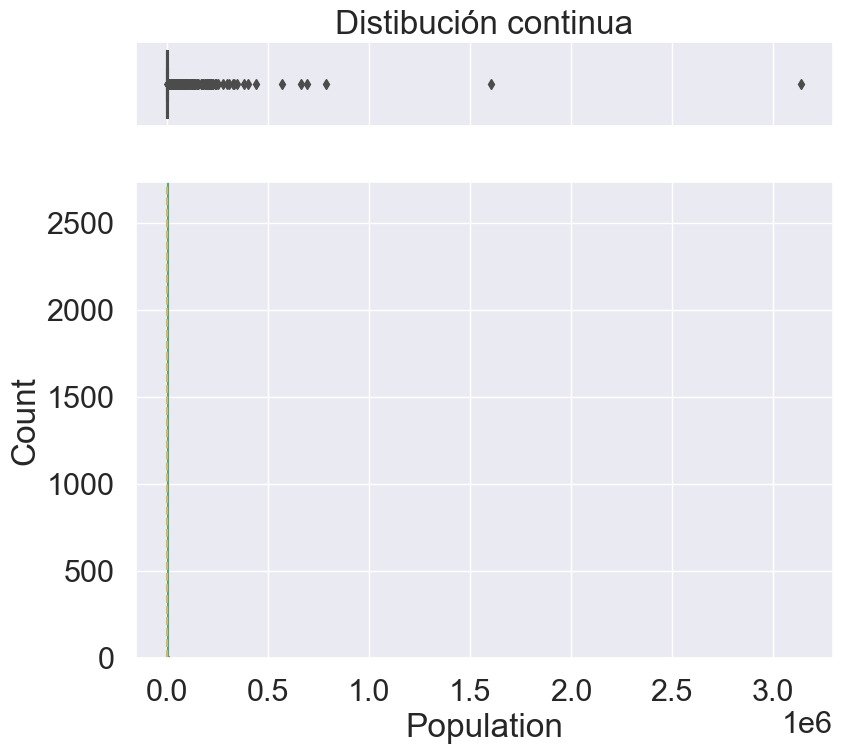

Cont


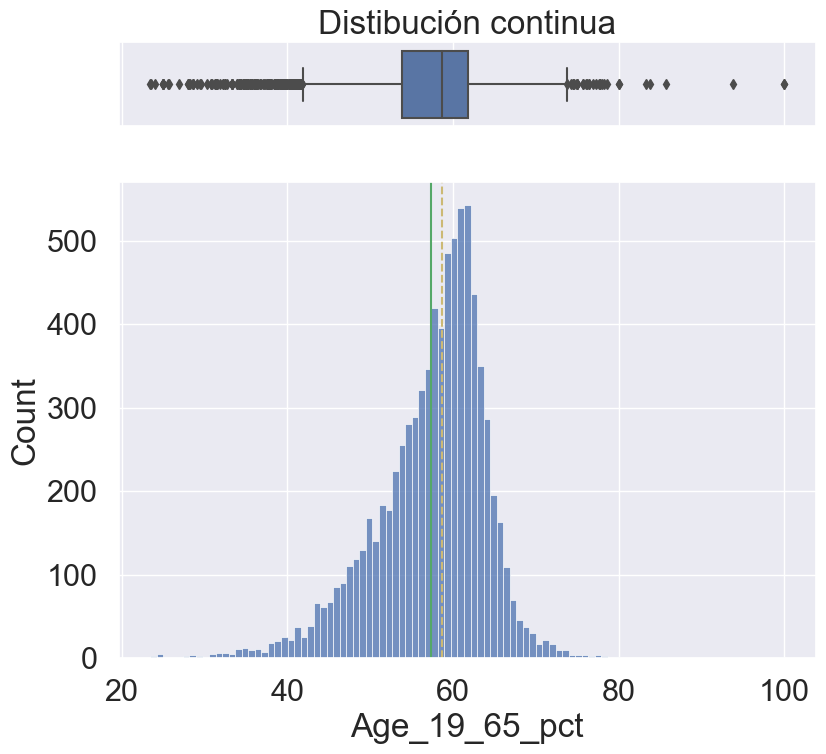

Cont


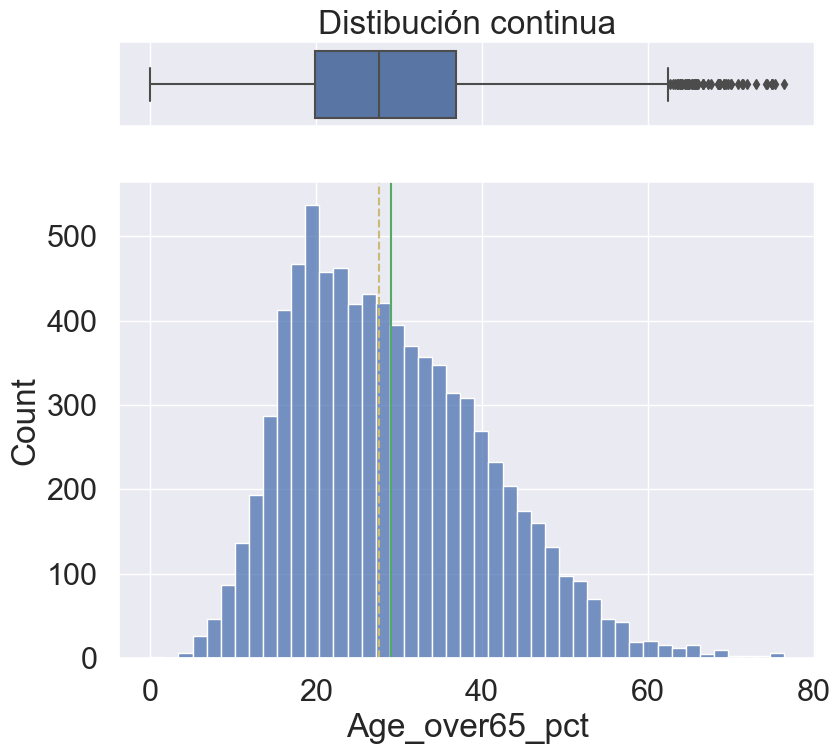

Cont


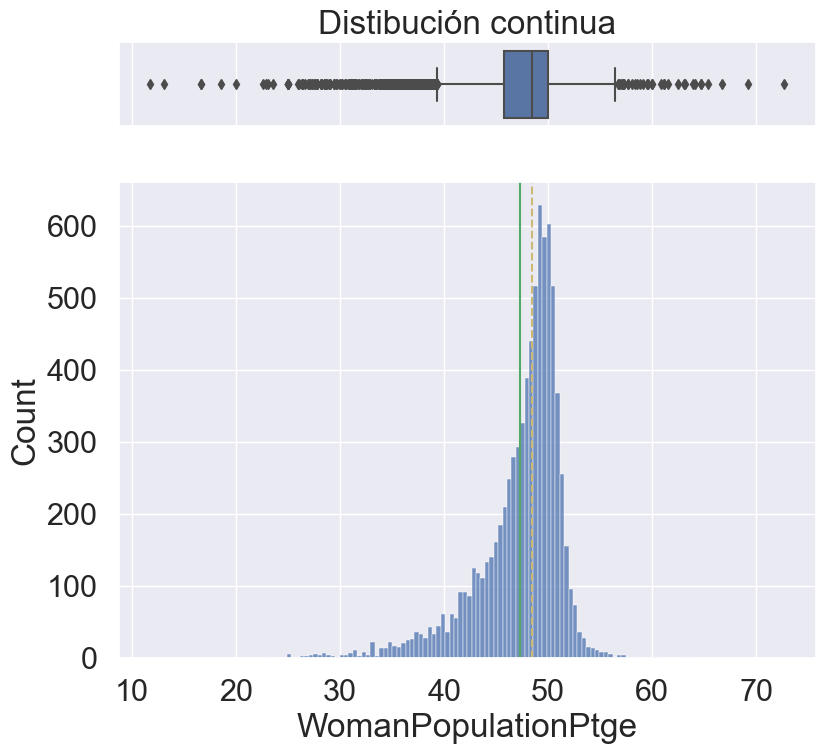

Cont


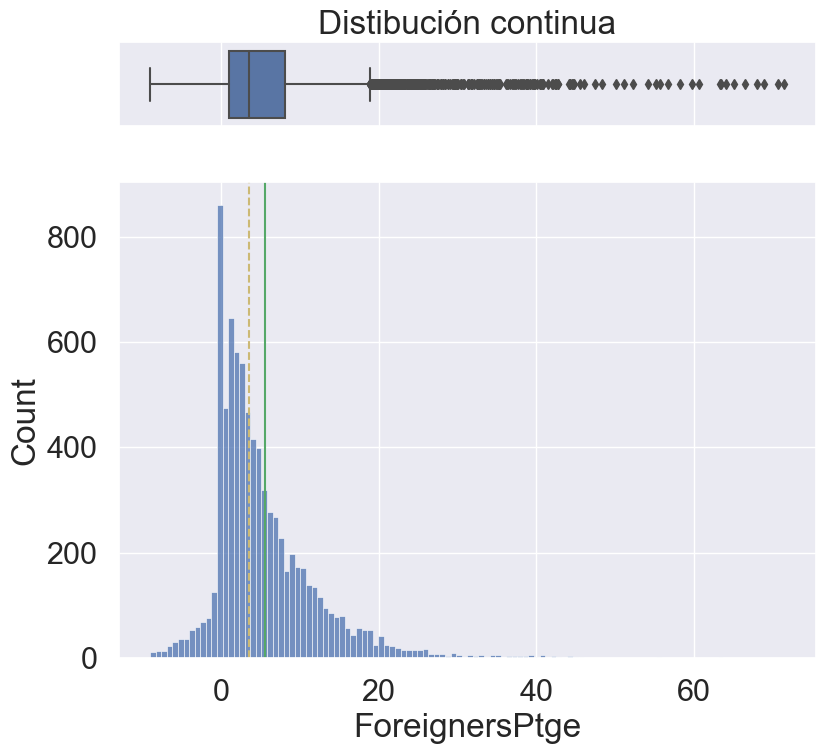

Cont


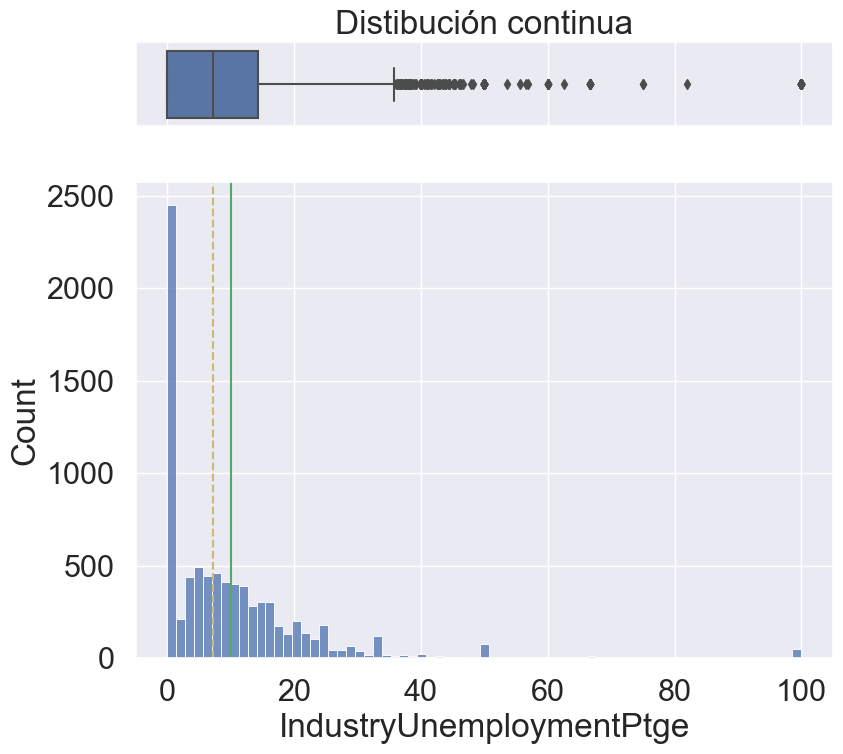

Cont


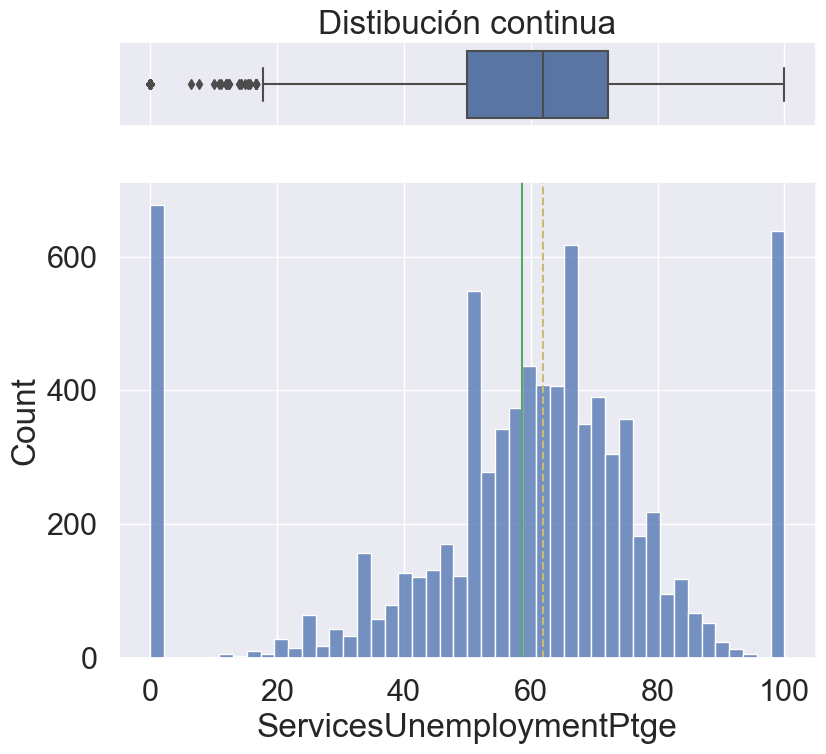

Cont


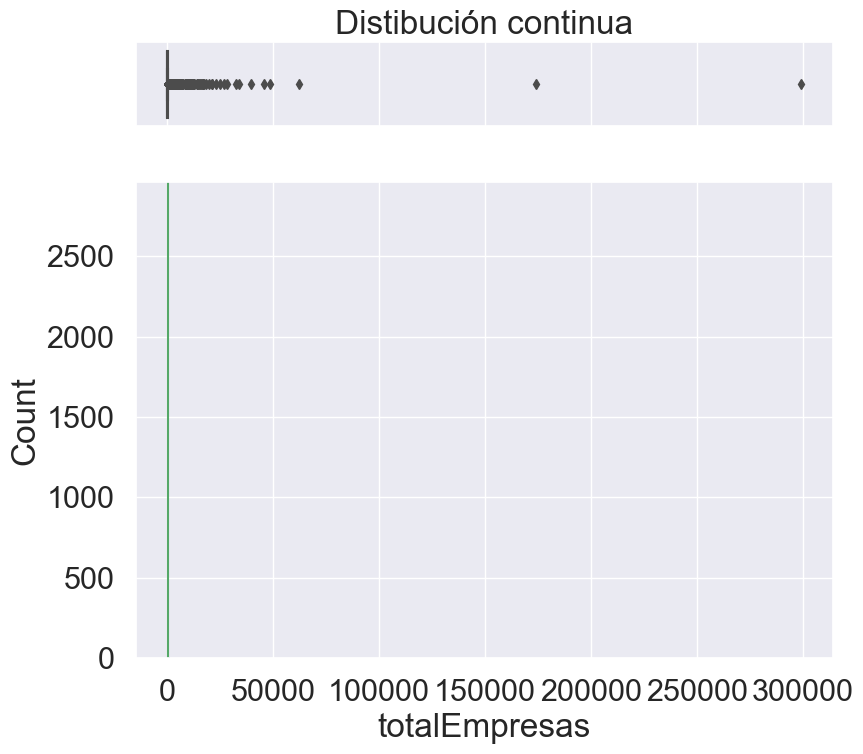

Cont


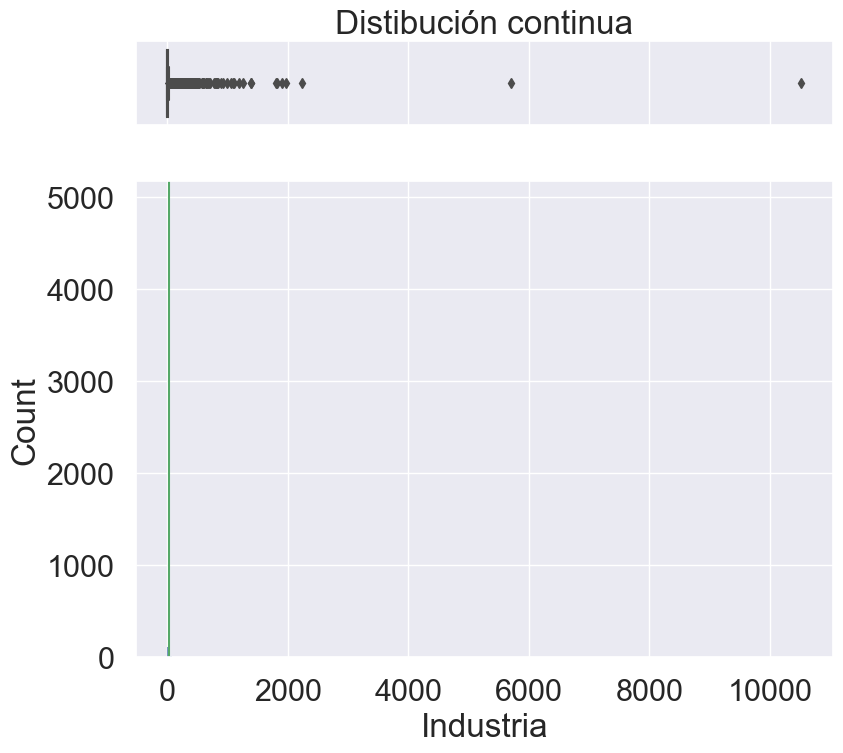

Population                  None
Age_19_65_pct               None
Age_over65_pct              None
WomanPopulationPtge         None
ForeignersPtge              None
IndustryUnemploymentPtge    None
ServicesUnemploymentPtge    None
totalEmpresas               None
Industria                   None
dtype: object

In [196]:
def plot(col):
     if col.dtypes != 'category':
        print('Cont')
        histogram_boxplot(col, xlabel = col.name, title = 'Distibución continua')
     else:
        print('Cat')
        cat_plot(col)
new_sp.iloc[:,1:10].apply(plot)

In [197]:
#new_sp.ForeignersPtge.replace(-8.9,np.nan,inplace=True)
new_sp['ForeignersPtge'] = np.where(new_sp['ForeignersPtge'] < 0, np.nan, new_sp['ForeignersPtge'])

new_sp.ForeignersPtge.min()


C:\Users\tiqda\AppData\Local\Temp\ipykernel_2180\1106157405.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



0.0

In [198]:
#new_sp.ForeignersPtge.replace(-8.9,np.nan,inplace=True)
new_sp['Age_19_65_pct'] = np.where(new_sp['Age_19_65_pct'] > 100, np.nan, new_sp['Age_19_65_pct'])

new_sp.Age_19_65_pct.max()

C:\Users\tiqda\AppData\Local\Temp\ipykernel_2180\4155783652.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



100.0

In [199]:
new_sp.describe()

,Population,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,IndustryUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Servicios
count,8.119000e+03,8118.000000,8119.000000,8119.000000,7466.000000,8119.000000,8119.000000,8114.000000,7931.000000,8057.000000
mean,5.741855e+03,57.366290,29.073583,47.302755,6.344069,10.007836,58.649705,398.603032,23.419367,172.149684
std,4.621520e+04,6.802052,11.745849,4.361907,7.194724,12.528441,24.259562,4219.366083,158.610811,2446.812300
min,5.000000e+00,23.459000,0.000000,11.765000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.660000e+02,53.845000,19.824500,45.725000,1.620000,0.000000,50.000000,7.000000,0.000000,0.000000
50%,5.490000e+02,58.655000,27.559000,48.485000,4.130000,7.143000,62.018000,30.000000,0.000000,0.000000
75%,2.427500e+03,61.817500,36.908000,50.000000,8.810000,14.286000,72.123000,147.000000,14.000000,40.000000
max,3.141991e+06,100.000000,76.471000,72.683000,71.470000,100.000000,100.000000,299397.000000,10521.000000,177677.000000


In [204]:
#!pip install feature-engine

import feature_engine.imputation as fe_imp

In [205]:
imputer_mean = fe_imp.MeanMedianImputer(imputation_method='mean')

In [206]:
new_sp_mean_imputed = imputer_mean.fit(new_sp).transform(new_sp)

In [207]:
new_sp_mean_imputed.describe()

,Population,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,IndustryUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Servicios
count,8.119000e+03,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000,8119.000000
mean,5.741855e+03,57.366290,29.073583,47.302755,6.344069,10.007836,58.649705,398.603032,23.419367,172.149684
std,4.621520e+04,6.801633,11.745849,4.361907,6.899291,12.528441,24.259562,4218.066497,156.763465,2437.450811
min,5.000000e+00,23.459000,0.000000,11.765000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.660000e+02,53.845000,19.824500,45.725000,1.790000,0.000000,50.000000,7.000000,0.000000,0.000000
50%,5.490000e+02,58.655000,27.559000,48.485000,4.680000,7.143000,62.018000,30.000000,0.000000,0.000000
75%,2.427500e+03,61.817000,36.908000,50.000000,8.180000,14.286000,72.123000,148.000000,16.000000,42.000000
max,3.141991e+06,100.000000,76.471000,72.683000,71.470000,100.000000,100.000000,299397.000000,10521.000000,177677.000000


## Agrega los valores por CCAA, distinguiendo entre valores relativos (agregación por la media) y valores absolutos (agregación por suma)

In [208]:
grouped_data = new_sp_mean_imputed.groupby('CCAA').mean()

In [209]:
grouped_data.head(20)

,Population,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,IndustryUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Servicios
CCAA,,,,,,,,,,
Andalucía,10858.494179,60.876649,20.938508,49.366288,6.272943,5.971745,55.793304,633.936877,35.297918,261.775414
Aragón,1802.800274,55.521389,33.307423,45.753094,7.327759,10.513605,54.195016,123.184679,7.829928,49.216347
Asturias,13477.294872,58.626064,29.810372,49.841897,2.840902,9.579077,64.149731,867.615385,45.299422,362.476278
Baleares,16484.761194,62.421522,17.805015,49.460373,15.076246,6.183836,67.592612,1333.447761,65.776119,585.686567
Canarias,23867.113636,64.421011,17.617239,49.451693,11.012302,3.876227,72.823102,1544.420455,58.342009,677.842610
Cantabria,5737.049020,61.367000,24.182500,47.716373,3.773736,7.717853,69.295892,369.529412,20.567996,154.613713
CastillaLeón,1099.667260,54.563655,36.713069,45.622654,4.037952,8.537348,54.964627,71.347865,4.105972,24.731716
CastillaMancha,2240.686616,55.319970,32.234108,46.331884,7.148154,7.640454,57.178591,137.261153,12.214048,45.451304
Cataluña,7928.306230,60.009161,21.316567,48.409210,8.995276,14.371141,64.650232,629.537487,36.275641,287.728617


## Valora la necesidad de escalar los datos y decide el tipo de distancia a aplicar

In [210]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

In [211]:
scaler = StandardScaler()
scaled_grouped_data = scaler.fit_transform(grouped_data)

In [212]:
X_scaled = scale(grouped_data)

## Explora los métodos de clustering jerárquico para estos datos y decide el tipo de Linkage más adecuado.

ward :	0.01s


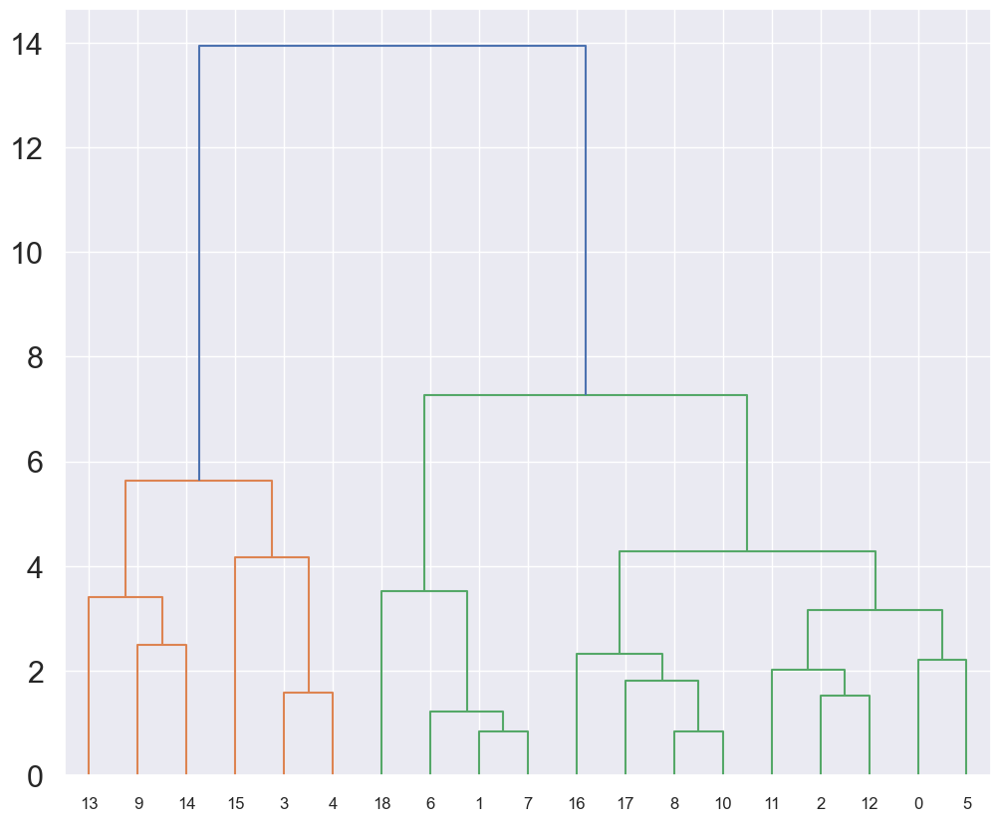

average :	0.00s


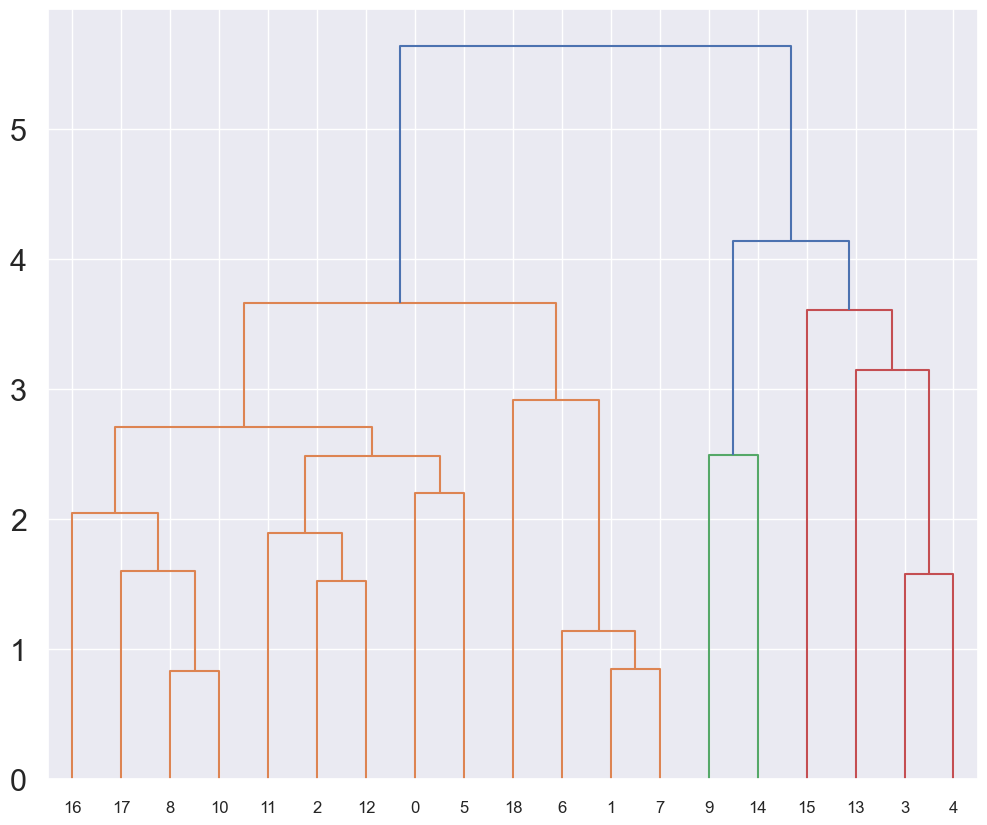

complete :	0.00s


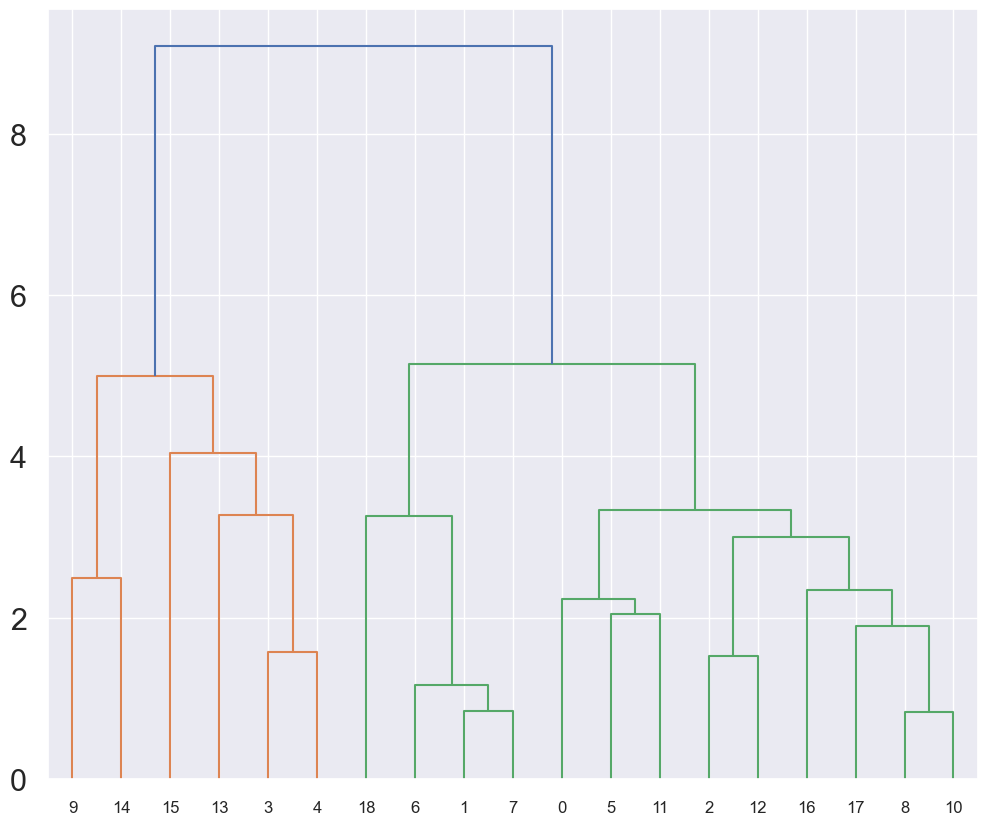

single :	0.00s


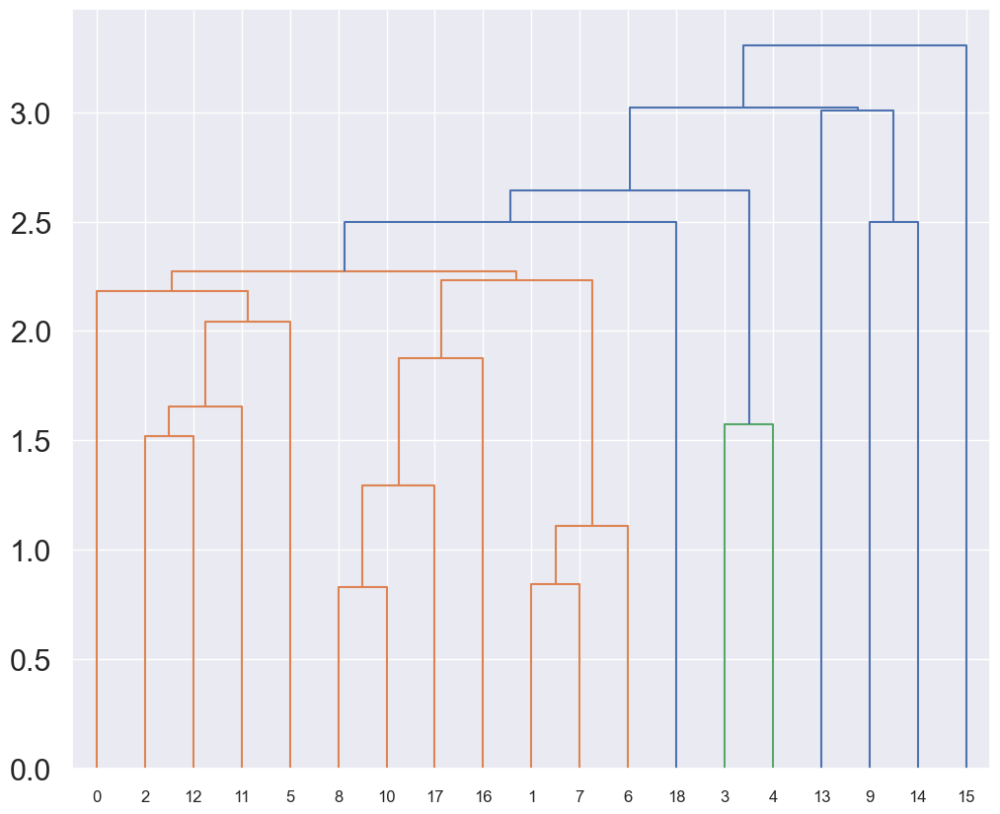

In [213]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from time import time

for linkage in ("ward", "average", "complete", "single"):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=None,
                            distance_threshold = 0)
    t0 = time()
    clustering.fit(X_scaled)
    print("%s :\t%.2fs" % (linkage, time() - t0))
    
    plt.clf()
    plot_dendogram(clustering)
    #plot_clustering(X_scaled, clustering.labels_, "%s linkage" % linkage)


#plt.show()

"ward" = se divide principalmente en 4 grupos

"average" = podemos observar que podrían ser hasta 4 grupos o 5 aunque ya se metería a otro nivel

"complete" = 4 grupos

"single" = se juntan muchos, lo descartaría

## Toma una decisión sobre el número de clusters a considerar y realiza un análisis cluster mediante el método k-means.

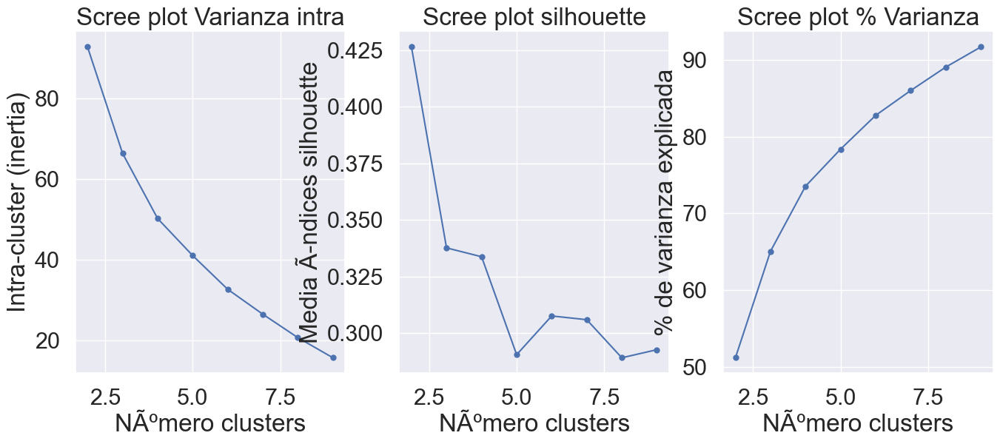

In [215]:
scree_plot_kmeans(grouped_data,10)

In [216]:
X_scaled = scale(grouped_data)
modelo_kmeans = KMeans(n_clusters=4, n_init=25, random_state=123)
modelo_kmeans.fit(X=X_scaled)

print('Varianza intra: ' + str(modelo_kmeans.inertia_))
print('Centroides')
print(modelo_kmeans.cluster_centers_)
print('Etiquetas')

Varianza intra: 50.2492978681132
Centroides
[[-0.44291502 -0.08761114  0.1964263   0.37756568 -0.56252676  0.41552866
   0.02834318 -0.47298373 -0.3647231  -0.48123259]
 [ 2.67644707  0.66460507 -1.73978681  0.54423396  0.74320907 -1.49985788
   1.02096125  2.37216704  0.83917297  1.94071367]
 [-0.68598635 -1.36438994  1.30535494 -1.66471487 -0.35847563  0.25635879
  -1.2975524  -0.80008199 -0.97362875 -0.83817813]
 [ 0.3443216   1.22921247 -0.87742071  0.54307512  1.25255631 -0.44136933
   0.72329962  0.67821185  1.37466923  0.95059462]]
Etiquetas


In [217]:
modelo_kmeans.labels_[:5]

array([0, 2, 0, 3, 3])

In [218]:
# Clasificación con el modelo kmeans

y_predict = modelo_kmeans.predict(X=X_scaled)

silhouette_score(X_scaled, y_predict)

0.3337158630201639

Al tener un valor muy bajo, nuestro modelo tendrá problemas para clasificar nuestros grupos

In [219]:
from sklearn import metrics
metrics.calinski_harabasz_score(X_scaled, y_predict)

13.905736802401043

Este nos indica que deberíamos tener una separabilidad buena ya que el numero es alto

## Muestra el biplot (puede ser proyección sobre dos de las variables que resulten relevantes o proyección sobre las dos primeras componentes principales de la matriz de entrada) y comenta los grupos formados. Interpreta los centroides.

In [220]:
grouped_data.columns

Index(['Population', 'Age_19_65_pct', 'Age_over65_pct', 'WomanPopulationPtge',
       'ForeignersPtge', 'IndustryUnemploymentPtge',
       'ServicesUnemploymentPtge', 'totalEmpresas', 'Industria', 'Servicios'],
      dtype='object')

In [221]:
grouped_data.describe()

,Population,Age_19_65_pct,Age_over65_pct,WomanPopulationPtge,ForeignersPtge,IndustryUnemploymentPtge,ServicesUnemploymentPtge,totalEmpresas,Industria,Servicios
count,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000,19.000000
mean,18711.723456,59.400793,23.724265,48.209458,7.669162,9.541429,62.225306,1109.614144,46.537486,446.105096
std,25416.580961,2.820785,7.894408,1.796316,4.072288,4.555885,8.129158,1275.884013,39.743966,494.398438
min,1099.667260,54.563655,9.684000,43.487810,2.569728,1.324000,41.496276,71.347865,4.105972,24.731716
25%,2588.406312,57.275561,17.711127,47.326593,4.614112,6.088220,56.485947,166.008389,12.659654,61.014082
50%,8722.139442,60.009161,24.182500,48.963561,6.479259,8.537348,62.624026,629.537487,40.009966,261.775414
75%,20175.937415,61.474200,31.022240,49.312144,11.168642,13.448879,68.444252,1438.934108,62.059064,631.764589
max,85584.000000,64.421011,36.713069,50.631452,15.120000,16.592482,75.613039,4349.000000,149.840861,1561.616198


In [222]:
import plotly.express as px
grouped_data['cluster_kmeans'] = y_predict
fig = px.scatter(grouped_data, x='totalEmpresas',y='WomanPopulationPtge', color='cluster_kmeans', text=grouped_data.index)
fig.show()

In [225]:
# Cálculo de centroides
from sklearn.neighbors import NearestCentroid

clf = NearestCentroid()
clf.fit(grouped_data, y_predict)

print(clf.centroids_)

[[7.75458906e+03 5.91602525e+01 2.52335759e+01 4.88695962e+01
  5.43948883e+00 1.13840380e+01 6.24495666e+01 5.22237265e+02
  3.24285612e+01 2.14530150e+02 0.00000000e+00]
 [8.49235000e+04 6.12255000e+01 1.03560000e+01 4.91610000e+01
  1.06150000e+01 2.89050000e+00 7.03035000e+01 4.05550000e+03
  7.90000000e+01 1.38000000e+03 1.00000000e+00]
 [1.74132446e+03 5.56547921e+01 3.37544201e+01 4.52988606e+01
  6.24828102e+00 1.06782195e+01 5.19586275e+01 1.16028884e+02
  8.87369398e+00 4.27636349e+01 2.00000000e+00]
 [2.72297866e+04 6.27756580e+01 1.69822939e+01 4.91589739e+01
  1.26338864e+01 7.58423287e+00 6.79482994e+01 1.95185445e+03
  9.97151035e+01 9.03542731e+02 3.00000000e+00]]
